In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fifa-20-complete-player-dataset/players_16.csv
/kaggle/input/fifa-20-complete-player-dataset/players_17.csv
/kaggle/input/fifa-20-complete-player-dataset/players_18.csv
/kaggle/input/fifa-20-complete-player-dataset/teams_and_leagues.csv
/kaggle/input/fifa-20-complete-player-dataset/players_20.csv
/kaggle/input/fifa-20-complete-player-dataset/players_19.csv
/kaggle/input/fifa-20-complete-player-dataset/players_15.csv


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot, plot
from plotly.subplots import make_subplots
from collections import Counter
from math import sqrt
from random import randrange
import os
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

init_notebook_mode(connected=True)
pd.set_option('display.max_columns', None)
pd.set_option('precision', 0)
pd.options.mode.chained_assignment = None

In [3]:
df_20 = pd.read_csv("/kaggle/input/fifa-20-complete-player-dataset/players_20.csv")
df_19 = pd.read_csv("/kaggle/input/fifa-20-complete-player-dataset/players_19.csv")
df_18 = pd.read_csv("/kaggle/input/fifa-20-complete-player-dataset/players_18.csv")
df_17 = pd.read_csv("/kaggle/input/fifa-20-complete-player-dataset/players_17.csv")
df_16 = pd.read_csv("/kaggle/input/fifa-20-complete-player-dataset/players_16.csv")
df_15 = pd.read_csv("/kaggle/input/fifa-20-complete-player-dataset/players_15.csv")

df_20.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,1958,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,NaN,2004-07-01,2021,NaN,NaN,87,92,92,96,39,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,965,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,NaN,2018-07-10,2022,LS,7,90,93,82,89,35,78,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,1952,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,NaN,2017-08-03,2022,LW,10,91,85,87,95,32,58,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,1647,NaN,GK,13,NaN,2014-07-16,2023,GK,1,NaN,NaN,NaN,NaN,NaN,NaN,87,92,78,89,52,9,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,1845,"#Speedster, #Dribbler, #Acrobat",LW,7,NaN,2019-07-01,2024,LF,10,91,83,86,94,35,66,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,

In [4]:
df_20.shape

(18278, 104)

In [5]:
for i in df_20.columns:
    print(i)

sofifa_id
player_url
short_name
long_name
age
dob
height_cm
weight_kg
nationality
club
overall
potential
value_eur
wage_eur
player_positions
preferred_foot
international_reputation
weak_foot
skill_moves
work_rate
body_type
real_face
release_clause_eur
player_tags
team_position
team_jersey_number
loaned_from
joined
contract_valid_until
nation_position
nation_jersey_number
pace
shooting
passing
dribbling
defending
physic
gk_diving
gk_handling
gk_kicking
gk_reflexes
gk_speed
gk_positioning
player_traits
attacking_crossing
attacking_finishing
attacking_heading_accuracy
attacking_short_passing
attacking_volleys
skill_dribbling
skill_curve
skill_fk_accuracy
skill_long_passing
skill_ball_control
movement_acceleration
movement_sprint_speed
movement_agility
movement_reactions
movement_balance
power_shot_power
power_jumping
power_stamina
power_strength
power_long_shots
mentality_aggression
mentality_interceptions
mentality_positioning
mentality_vision
mentality_penalties
mentality_composure
defe

In [6]:
df_20.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278,18278,18278,18278,18278,18278,2e+04,18278,2e+04,2e+04,2e+04,2e+04,18038,18038,1126,16242,16242,16242,16242,16242,16242,2036,2036,2036,2036,2036,2036,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278
mean,219739,25,181,75,66,72,2e+06,9457,1e+00,3e+00,2e+00,5e+06,20,2021,12,68,52,57,63,52,65,65,63,62,66,38,63,50,46,52,59,43,56,47,43,53,58,64,64,64,62,64,58,65,63,65,47,56,46,50,54,48,59,47,48,46,17,16,16,16,17
std,27960,5,7,7,7,6,6e+06,21352,4e-01,7e-01,8e-01,1e+07,17,1,7,11,14,10,10,16,10,8,7,8,8,11,8,18,20,17,15,18,19,18,17,15,17,15,15,15,9,14,13,12,16,13,19,17,21,20,14,16,12,20,22,21,18,17,17,17,18
min,768,16,156,50,48,49,0e+00,0,1e+00,1e+00,1e+00,1e+04,1,2019,1,24,15,24,23,15,27,44,42,35,45,12,41,5,2,5,7,3,4,6,4,8,5,12,11,11,21,12,14,19,12,20,4,9,3,2,9,7,12,1,5,3,1,1,1,1,1
25%,204446,22,177,70,62,67,3e+05,1000,1e+00,3e+00,2e+00,6e+05,9,2020,6,61,42,50,57,36,59,60,58,57,61,29,58,38,30,44,54,30,50,34,31,43,54,56,57,55,56,56,48,58,56,58,32,44,25,39,44,39,51,29,27,24,8,8,8,8,8
50%,226165,25,181,75,66,71,7e+05,3000,1e+00,3e+00,2e+00,1e+06,17,2021,12,69,54,58,64,56,66,65,63,61,66,39,64,54,49,56,62,44,61,49,41,56,63,67,67,66,62,66,59,66,66,66,51,58,52,55,55,49,60,52,55,52,11,11,11,11,11
75%,240796,29,186,80,71,75,2e+06,8000,1e+00,3e+00,3e+00,4e+06,27,2022,18,75,63,64,69,65,72,70,68,66,72,46,69,64,62,64,68,56,68,62,56,64,69,75,75,74,68,74,68,73,74,74,62,69,64,64,64,60,67,64,66,64,14,14,14,14,14
max,252905,42,205,110,94,95,1e+08,565000,5e+00,5e+00,5e+00,2e+08,99,2026,30,96,93,92,96,90,90,90,92,93,92,65,91,93,95,93,92,90,97,94,94,92,96,97,96,96,96,97,95,95,97,97,94,95,92,95,94,92,96,94,92,90,90,92,93,91,92


In [7]:
df_20.isnull().sum()

sofifa_id        0
player_url       0
short_name       0
long_name        0
age              0
              ... 
lb            2036
lcb           2036
cb            2036
rcb           2036
rb            2036
Length: 104, dtype: int64

In [8]:
missing_data = df_20.isnull().sum().sort_values(ascending=False)
missing_data = missing_data.reset_index(drop = False)
missing_data = missing_data.rename(columns={"index": "Columns", 0:"Value"})
missing_data['proportion'] = (missing_data['Value']/len(df_20))*100
missing_data.head()

,Columns,Value,proportion
0,loaned_from,17230,94
1,nation_jersey_number,17152,94
2,nation_position,17152,94
3,player_tags,16779,92
4,gk_diving,16242,89


In [9]:
sample = missing_data[missing_data['proportion']>10]
fig = px.pie(sample, names='Columns', values='proportion',
             color_discrete_sequence=px.colors.sequential.Viridis_r,
             title='Percentage of Missing values in Columns')
fig.update_traces(textposition='inside', textinfo='label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000'))
fig.show()

In [10]:
df_20.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


In [11]:
df_20['release_clause_eur'].fillna(0,inplace=True)
df_20['player_tags'].fillna('#Team Player',inplace=True)
df_20['team_position'].fillna('Not Decided',inplace=True)                                  
df_20['team_jersey_number'].fillna(0,inplace=True)
df_20['loaned_from'].fillna('Disclosed',inplace=True)
df_20['joined'].fillna('Disclosed',inplace=True)
df_20['contract_valid_until'].fillna('Disclosed',inplace=True)
df_20['pace'].fillna(df_20['pace'].mean(),inplace=True)
df_20['shooting'].fillna(df_20['shooting'].mean(),inplace=True)
df_20['passing'].fillna(df_20['passing'].mean(),inplace=True)
df_20['dribbling'].fillna(df_20['dribbling'].mean(),inplace=True)
df_20['defending'].fillna(df_20['defending'].mean(),inplace=True)
df_20['physic'].fillna(df_20['physic'].mean(),inplace=True)
df_20['gk_diving'].fillna(df_20['gk_diving'].mean(),inplace=True)
df_20['gk_handling'].fillna(df_20['gk_handling'].mean(),inplace=True)
df_20['gk_kicking'].fillna(df_20['gk_kicking'].mean(),inplace=True)
df_20['gk_reflexes'].fillna(df_20['gk_reflexes'].mean(),inplace=True)
df_20['gk_speed'].fillna(df_20['gk_speed'].mean(),inplace=True)
df_20['gk_positioning'].fillna(df_20['gk_positioning'].mean(),inplace=True)
df_20['player_traits'].fillna('NA',inplace=True)
df_20['ls'].fillna('NA',inplace=True)
df_20['st'].fillna('NA',inplace=True)
df_20['rs'].fillna('NA',inplace=True)
df_20['lw'].fillna('NA',inplace=True)
df_20['lf'].fillna('NA',inplace=True)
df_20['cf'].fillna('NA',inplace=True)
df_20['rf'].fillna('NA',inplace=True)
df_20['rw'].fillna('NA',inplace=True)
df_20['lam'].fillna('NA',inplace=True)
df_20['cam'].fillna('NA',inplace=True)
df_20['ram'].fillna('NA',inplace=True)
df_20['lm'].fillna('NA',inplace=True)
df_20['lcm'].fillna('NA',inplace=True)
df_20['cm'].fillna('NA',inplace=True)
df_20['rcm'].fillna('NA',inplace=True)
df_20['rm'].fillna('NA',inplace=True)
df_20['lwb'].fillna('NA',inplace=True)
df_20['ldm'].fillna('NA',inplace=True)
df_20['cdm'].fillna('NA',inplace=True)
df_20['rdm'].fillna('NA',inplace=True)
df_20['rwb'].fillna('NA',inplace=True)
df_20['lb'].fillna('NA',inplace=True)
df_20['lcb'].fillna('NA',inplace=True)
df_20['cb'].fillna('NA',inplace=True)
df_20['rcb'].fillna('NA',inplace=True)
df_20['rb'].fillna('NA',inplace=True)

In [12]:
df_20.drop(['sofifa_id','player_url','real_face','nation_position','nation_jersey_number','long_name'], axis=1, inplace=True)
df_20.head()

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,1958,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2e+03,87,92,92,96,39,66,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,965,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,Disclosed,2018-07-10,2e+03,90,93,82,89,35,78,65,63,62,66,38,63,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,1952,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,Disclosed,2017-08-03,2e+03,91,85,87,95,32,58,65,63,62,66,38,63,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,J. Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,1647,#Team Player,GK,13,Disclosed,2014-07-16,2e+03,68,52,57,63,52,65,87,92,78,89,52,90,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,1845,"#Speedster, #Dribbler, #Acrobat",LW,7,Disclosed,2019-07-01,2e+03,91,83,86,94,35,66,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [13]:
df_20.shape

(18278, 98)

In [14]:
df_20.club.unique()

array(['FC Barcelona', 'Juventus', 'Paris Saint-Germain',
       'Atlético Madrid', 'Real Madrid', 'Manchester City', 'Liverpool',
       'Napoli', 'Tottenham Hotspur', 'Manchester United', 'Chelsea',
       'FC Bayern München', 'Inter', 'Borussia Dortmund', 'Arsenal',
       'Valencia CF', 'Lazio', 'Milan', 'Sporting CP',
       'Olympique Lyonnais', 'RB Leipzig', 'Ajax', 'LA Galaxy',
       'Atalanta', 'RC Celta', 'Bayer 04 Leverkusen', 'Real Betis',
       'FC Porto', 'SV Werder Bremen', 'West Ham United',
       'Wolverhampton Wanderers', 'AS Saint-Étienne', 'Torino',
       'Dalian YiFang FC', 'Borussia Mönchengladbach', 'Roma',
       'Guangzhou Evergrande Taobao FC', 'SL Benfica',
       'Medipol Başakşehir FK', 'Everton', 'VfL Wolfsburg',
       'Crystal Palace', 'Getafe CF', 'Shanghai SIPG FC',
       'Eintracht Frankfurt', 'Olympique de Marseille', 'Hertha BSC',
       'RSC Anderlecht', 'Villarreal CF', 'Sampdoria', 'Leicester City',
       'AS Monaco', 'Jiangsu Suning FC', '

In [15]:
len(df_20.club.unique())

698

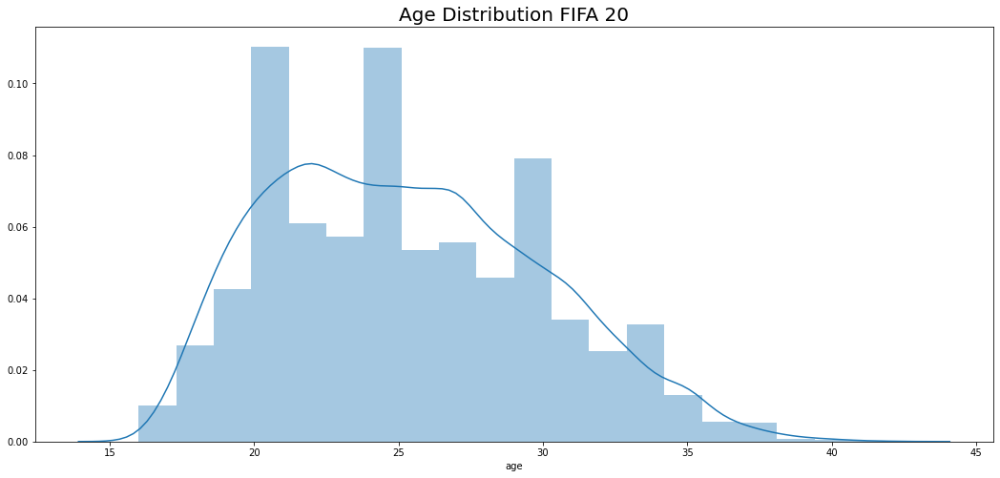

In [16]:
plt.figure(figsize=(18,8))
plt.title('Age Distribution FIFA 20', fontsize=20)
sns.distplot(a=df_20['age'], kde=True, bins=20)

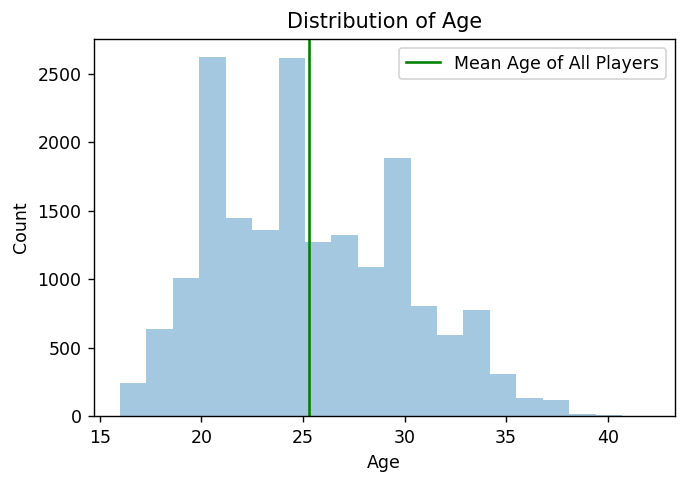

In [17]:
plt.figure(dpi=125)
sns.distplot(a=df_20['age'],kde=False,bins=20)
plt.axvline(x=np.mean(df_20['age']),c='green',label='Mean Age of All Players')
plt.legend()
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Distribution of Age')
plt.show()

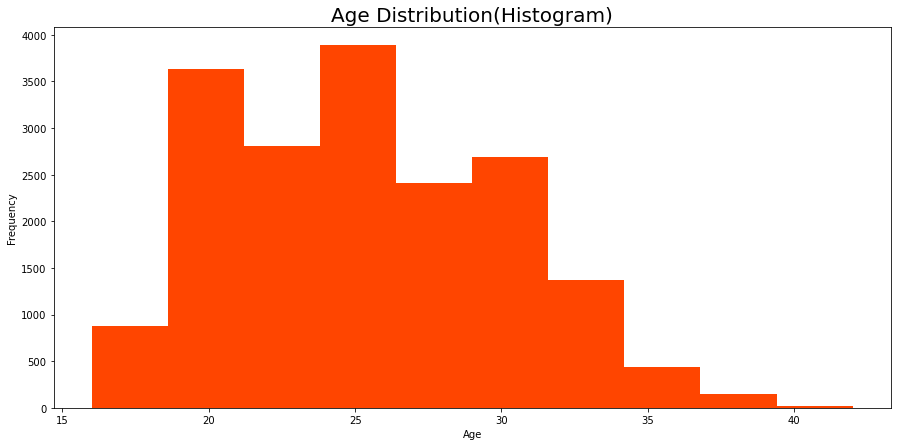

In [18]:
plt.figure(figsize = (15, 7))
df_20['age'].plot(kind="hist", color="orangered")
plt.title("Age Distribution(Histogram)", fontsize=20)
plt.xlabel("Age")
plt.show()

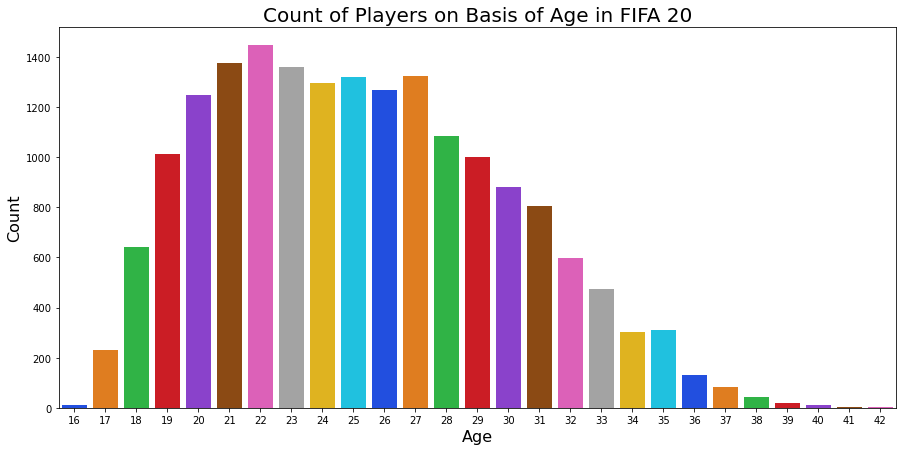

In [19]:
plt.figure(figsize= (15,7))

ax = sns.countplot(x='age', data=df_20, palette='bright')
ax.set_title(label='Count of Players on Basis of Age in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Age', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)

plt.show()

In [20]:
print(df_20.nationality.unique())

['Argentina' 'Portugal' 'Brazil' 'Slovenia' 'Belgium' 'Germany'
 'Netherlands' 'Croatia' 'Egypt' 'France' 'Senegal' 'England' 'Spain'
 'Italy' 'Uruguay' 'Poland' 'Denmark' 'Gabon' 'Korea Republic'
 'Costa Rica' 'Slovakia' 'Bosnia Herzegovina' 'Serbia' 'Scotland'
 'Hungary' 'Switzerland' 'Greece' 'Austria' 'Morocco' 'Sweden' 'Wales'
 'Colombia' 'Czech Republic' 'Chile' 'Algeria' 'Ivory Coast' 'Togo'
 'Norway' 'Mexico' 'Iceland' 'Finland' 'Jamaica' 'Albania' 'Guinea'
 'Cameroon' 'Ghana' 'Montenegro' 'Ukraine' 'Russia' 'DR Congo'
 'Central African Rep.' 'Venezuela' 'Nigeria' 'Armenia' 'Israel' 'Ecuador'
 'Paraguay' 'Australia' 'Turkey' 'Romania' 'Japan' 'Mali' 'United States'
 'Kosovo' 'Dominican Republic' 'Tanzania' 'China PR' 'Northern Ireland'
 'Republic of Ireland' 'Tunisia' 'Cape Verde' 'FYR Macedonia'
 'Burkina Faso' 'Kenya' 'Angola' 'South Africa' 'Peru' 'Syria' 'Gambia'
 'New Zealand' 'Equatorial Guinea' 'Zimbabwe' 'Georgia' 'Canada' 'Estonia'
 'Benin' 'Bulgaria' 'Mozambique' 'Hon

In [21]:
print(len(df_20.nationality.unique()))

162


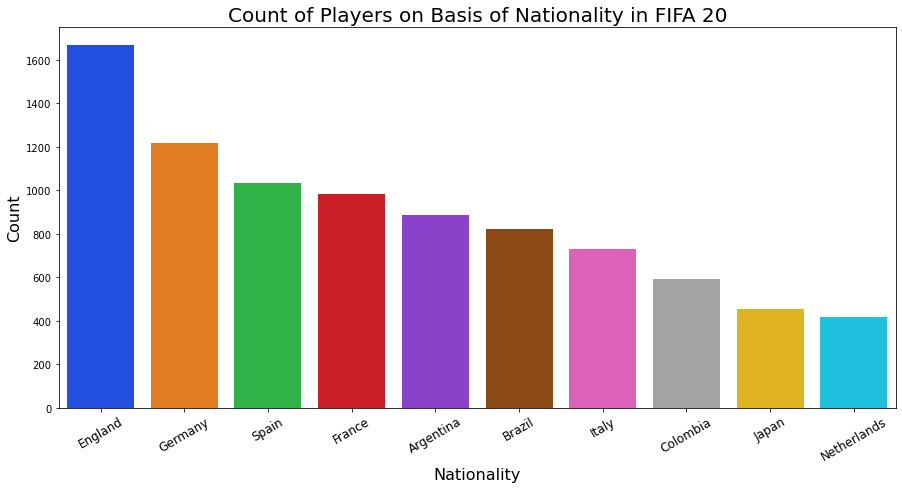

In [22]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='nationality', data=df_20, palette='bright', order=df_20.nationality.value_counts().iloc[:10].index)
ax.set_title(label='Count of Players on Basis of Nationality in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Nationality', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [23]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df_20['nationality'],
    y = df_20['overall'],
    mode='markers',
    marker=dict(
        size=16,
        color=df_20['overall'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= df_20['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

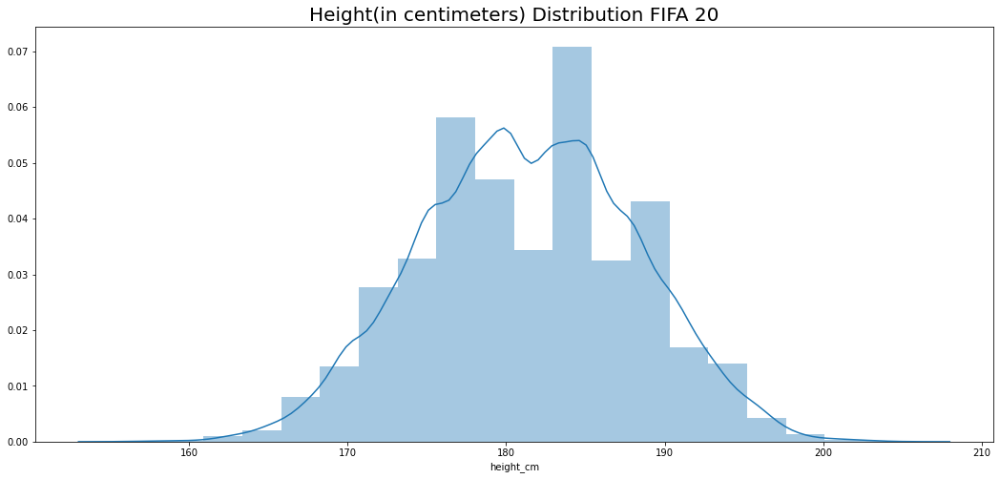

In [24]:
plt.figure(figsize=(18,8))
plt.title('Height(in centimeters) Distribution FIFA 20', fontsize=20)
sns.distplot(a=df_20['height_cm'], kde=True, bins=20)

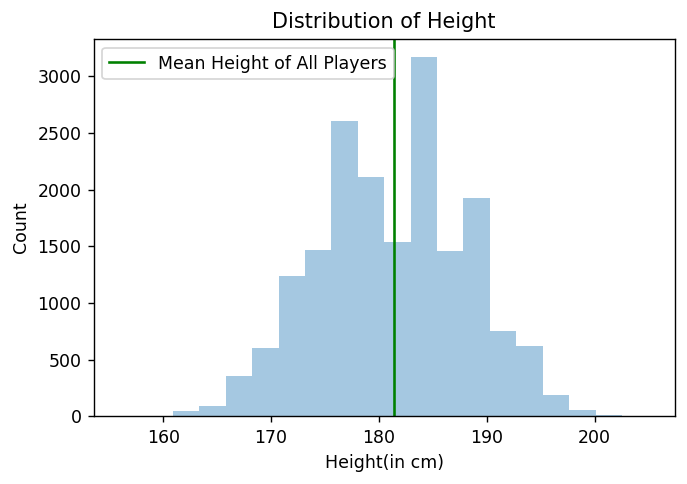

In [25]:
plt.figure(dpi=125)
sns.distplot(a=df_20['height_cm'],kde=False,bins=20)
plt.axvline(x=np.mean(df_20['height_cm']),c='green',label='Mean Height of All Players')
plt.legend()
plt.xlabel('Height(in cm)')
plt.ylabel('Count')
plt.title('Distribution of Height')
plt.show()

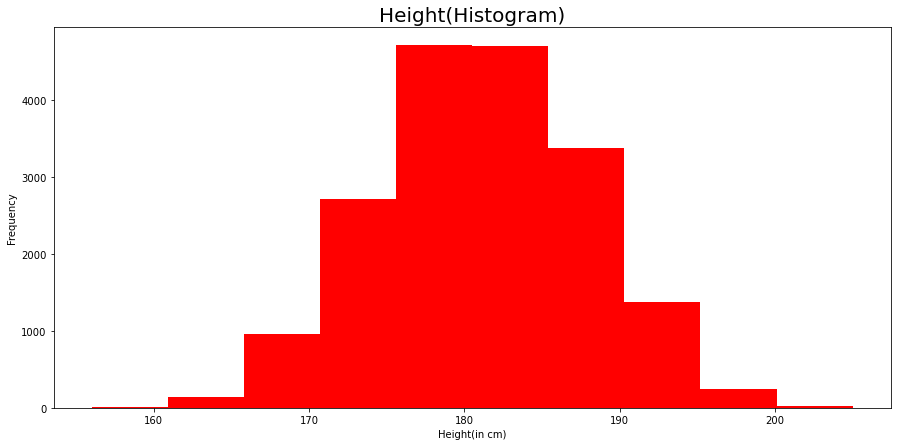

In [26]:
plt.figure(figsize = (15, 7))
df_20['height_cm'].plot(kind="hist", color="red")
plt.title("Height(Histogram)", fontsize=20)
plt.xlabel("Height(in cm)")
plt.show()

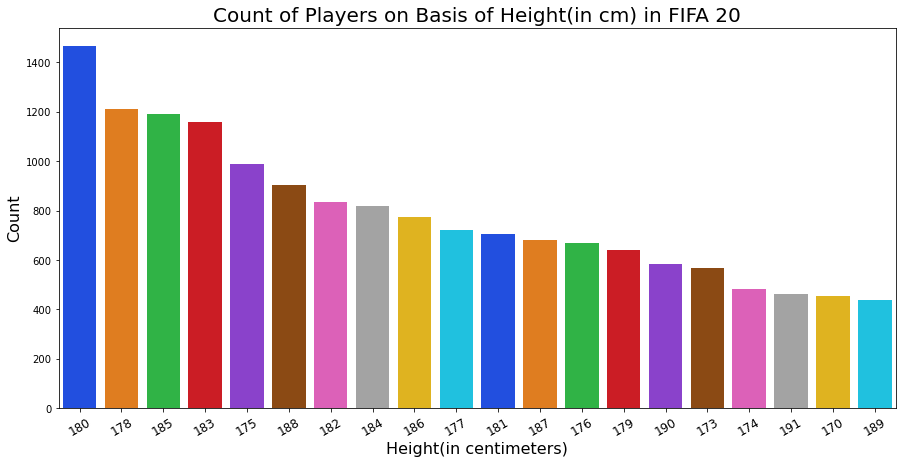

In [27]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='height_cm', data=df_20, palette='bright', order=df_20.height_cm.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of Height(in cm) in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Height(in centimeters)', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

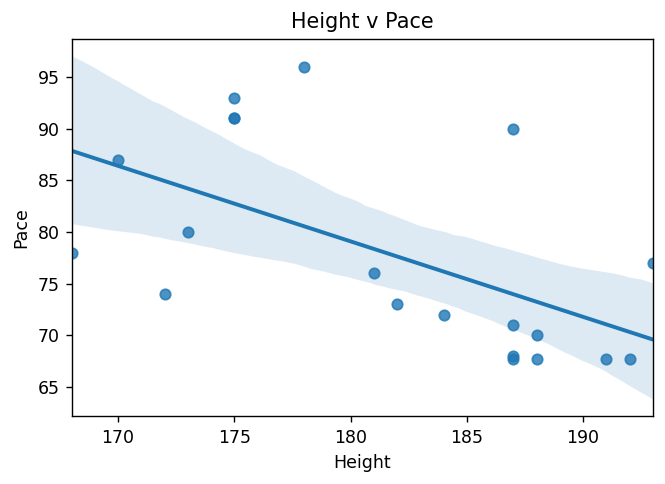

In [28]:
plt.figure(dpi=125)
x=df_20.head(20)['height_cm']
y=df_20.head(20)['pace']

sns.regplot(x,y)
plt.title('Height v Pace')
plt.xlabel('Height')
plt.ylabel('Pace')
plt.show()

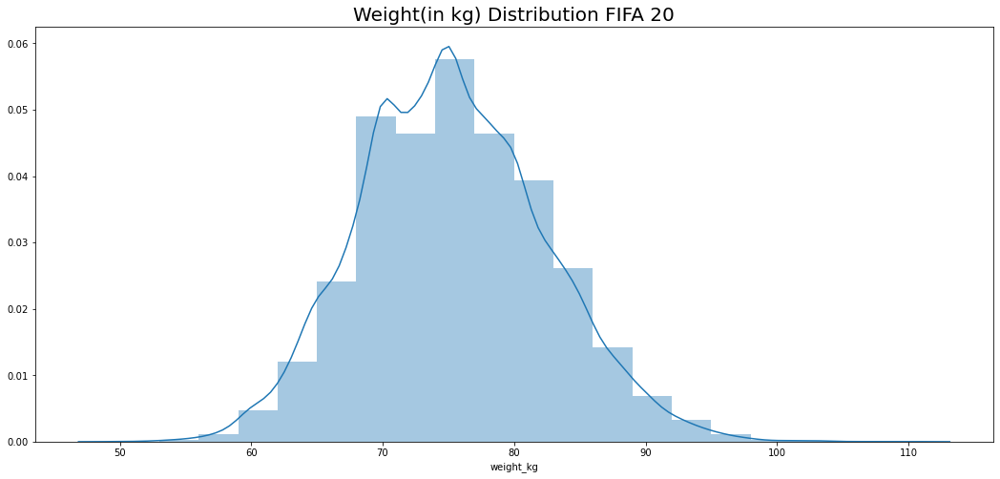

In [29]:
plt.figure(figsize=(18,8))
plt.title('Weight(in kg) Distribution FIFA 20', fontsize=20)
sns.distplot(a=df_20['weight_kg'], kde=True, bins=20)

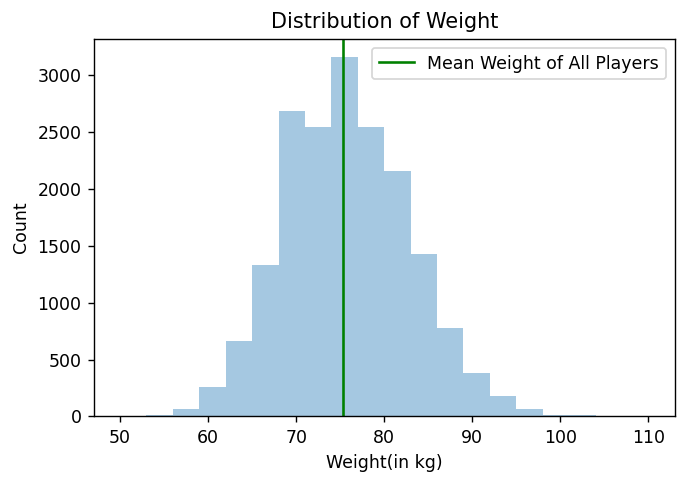

In [30]:
plt.figure(dpi=125)
sns.distplot(a=df_20['weight_kg'],kde=False,bins=20)
plt.axvline(x=np.mean(df_20['weight_kg']),c='green',label='Mean Weight of All Players')
plt.legend()
plt.xlabel('Weight(in kg)')
plt.ylabel('Count')
plt.title('Distribution of Weight')
plt.show()

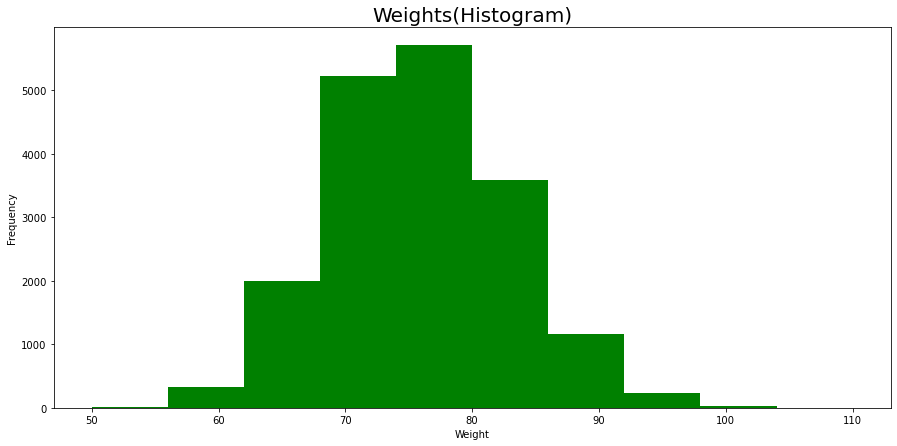

In [31]:
plt.figure(figsize = (15, 7))
df_20['weight_kg'].plot(kind="hist", color="green")
plt.title("Weights(Histogram)", fontsize=20)
plt.xlabel("Weight")
plt.show()

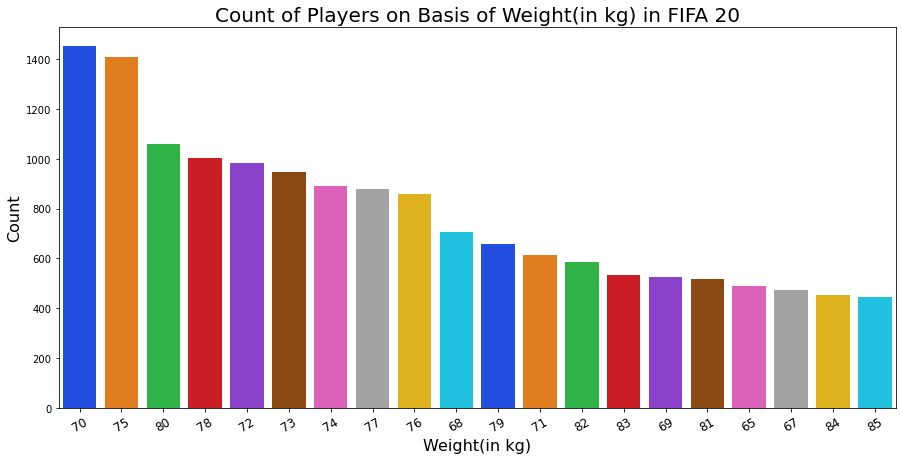

In [32]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='weight_kg', data=df_20, palette='bright', order=df_20.weight_kg.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of Weight(in kg) in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Weight(in kg)', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

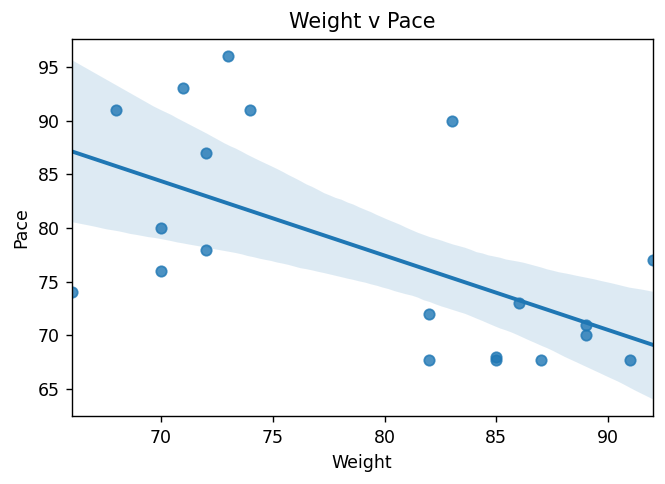

In [33]:
plt.figure(dpi=125)
x=df_20.head(20)['weight_kg']
y=df_20.head(20)['pace']

sns.regplot(x,y)
plt.title('Weight v Pace')
plt.xlabel('Weight')
plt.ylabel('Pace')
plt.show()

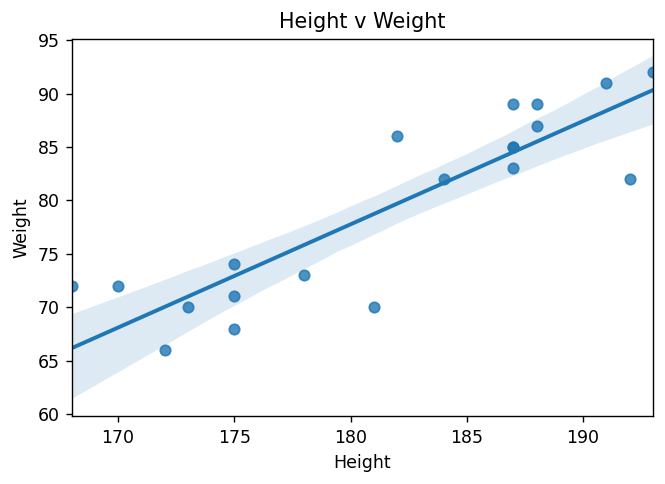

In [34]:
plt.figure(dpi=125)
x=df_20.head(20)['height_cm']
y=df_20.head(20)['weight_kg']

sns.regplot(x,y)
plt.title('Height v Weight')
plt.xlabel('Height')
plt.ylabel('Weight')
plt.show()

In [35]:
df_20['bmi'] = df_20['weight_kg'] // (df_20['height_cm']/100)**2
df_20['bmi'].head(20)

0     24
1     23
2     22
3     24
4     24
5     21
6     24
7     24
8     22
9     23
10    23
11    25
12    25
13    24
14    22
15    25
16    24
17    23
18    24
19    25
Name: bmi, dtype: float64

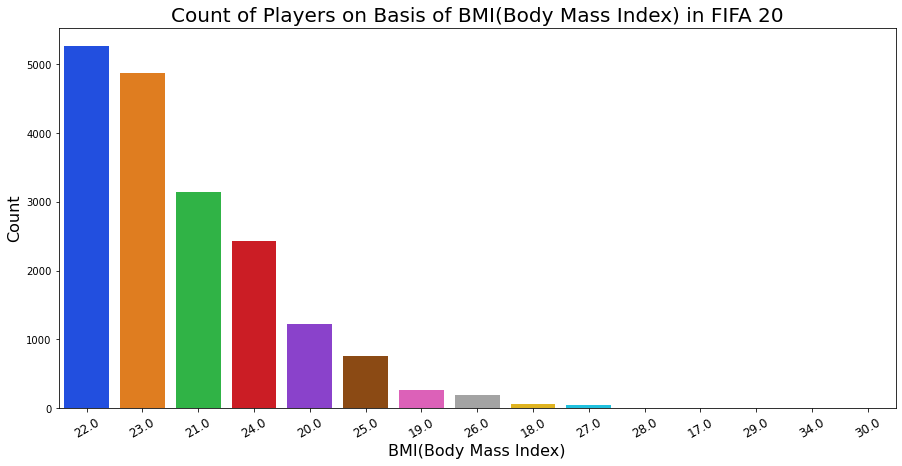

In [36]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='bmi', data=df_20, palette='bright', order=df_20.bmi.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of BMI(Body Mass Index) in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='BMI(Body Mass Index)', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

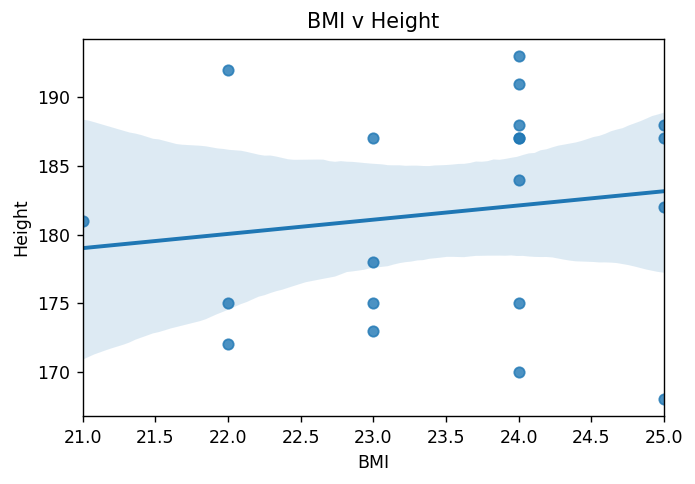

In [37]:
plt.figure(dpi=125)
x=df_20.head(20)['bmi']
y=df_20.head(20)['height_cm']

sns.regplot(x,y)
plt.title('BMI v Height')
plt.xlabel('BMI')
plt.ylabel('Height')
plt.show()

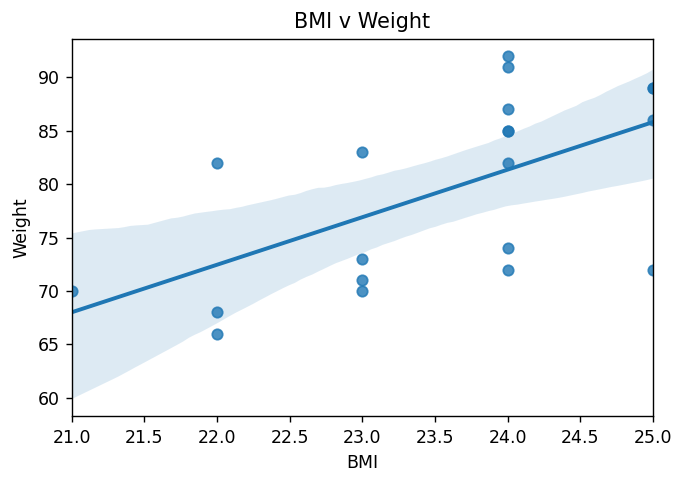

In [38]:
plt.figure(dpi=125)
x=df_20.head(20)['bmi']
y=df_20.head(20)['weight_kg']

sns.regplot(x,y)
plt.title('BMI v Weight')
plt.xlabel('BMI')
plt.ylabel('Weight')
plt.show()

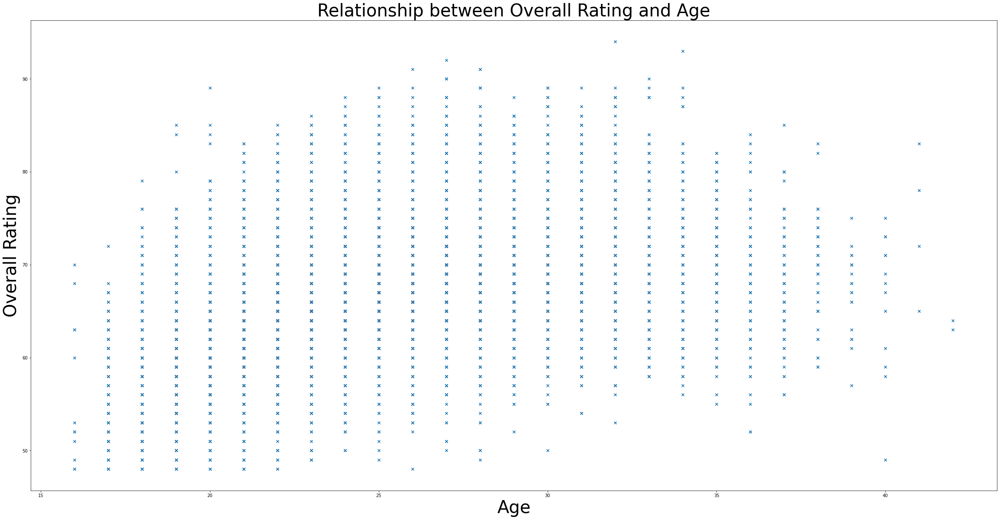

In [39]:
plt.figure(figsize=(40, 20))
plt.scatter(df_20['age'], df_20['overall'], marker="x")
plt.ylabel('Overall Rating', fontsize=40)
plt.xlabel("Age", fontsize=40)
plt.title("Relationship between Overall Rating and Age", fontsize=40)
plt.show()

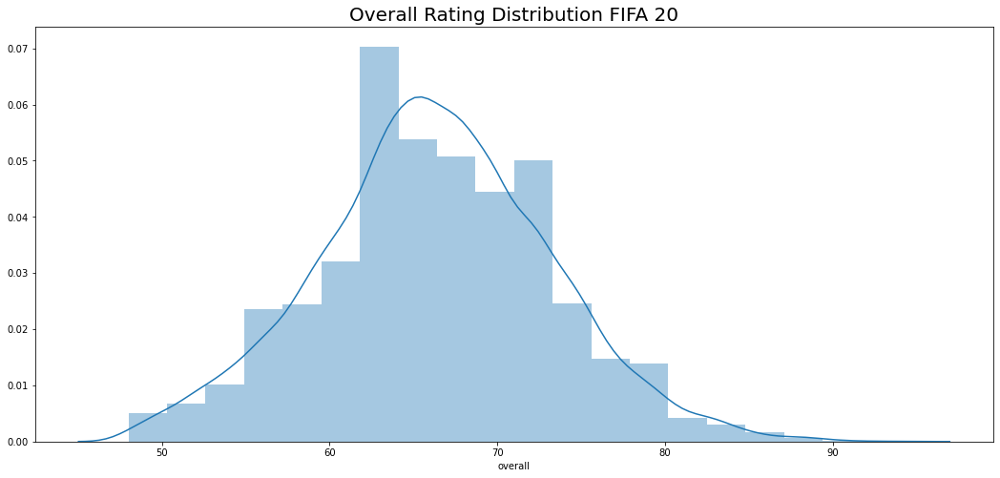

In [40]:
plt.figure(figsize=(18,8))
plt.title('Overall Rating Distribution FIFA 20', fontsize=20)
sns.distplot(a=df_20['overall'], kde=True, bins=20)

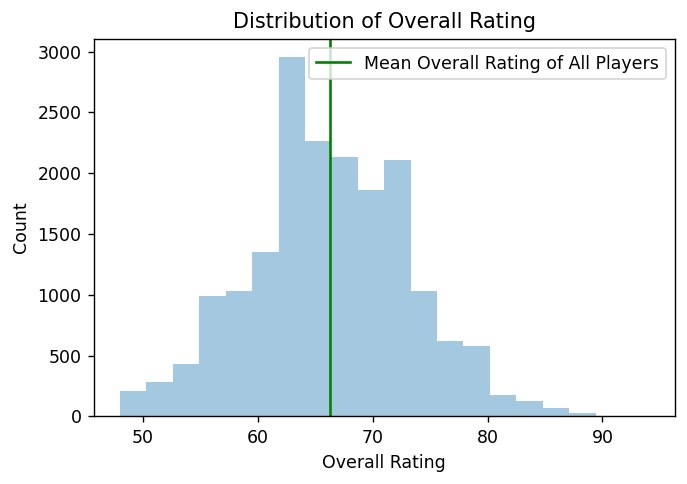

In [41]:
plt.figure(dpi=125)
sns.distplot(a=df_20['overall'],kde=False,bins=20)
plt.axvline(x=np.mean(df_20['overall']),c='green',label='Mean Overall Rating of All Players')
plt.legend()
plt.xlabel('Overall Rating')
plt.ylabel('Count')
plt.title('Distribution of Overall Rating')
plt.show()

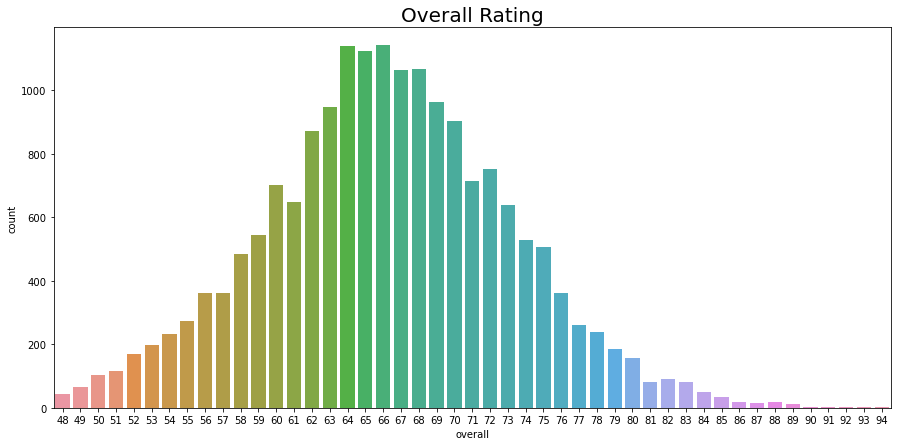

In [42]:
plt.figure(figsize=(15, 7))
sns.countplot(df_20['overall'])
plt.title("Overall Rating", fontsize=20)
plt.show()

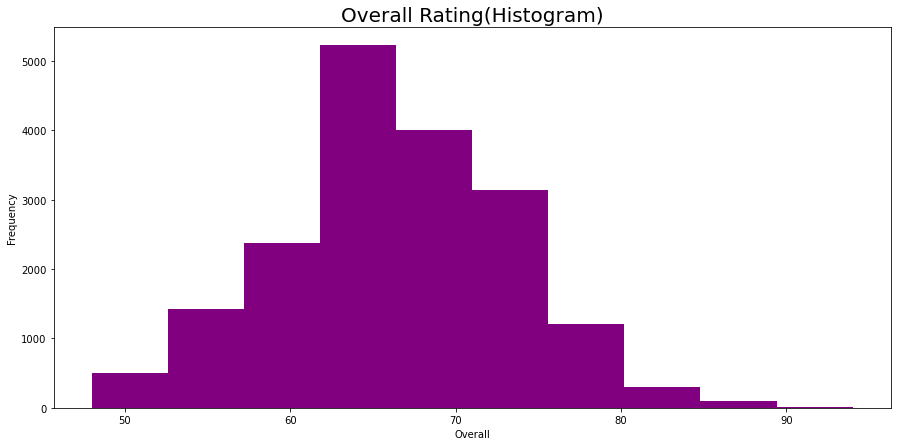

In [43]:
plt.figure(figsize = (15, 7))
df_20['overall'].plot(kind="hist", color="purple")
plt.title("Overall Rating(Histogram)", fontsize=20)
plt.xlabel("Overall")
plt.show()

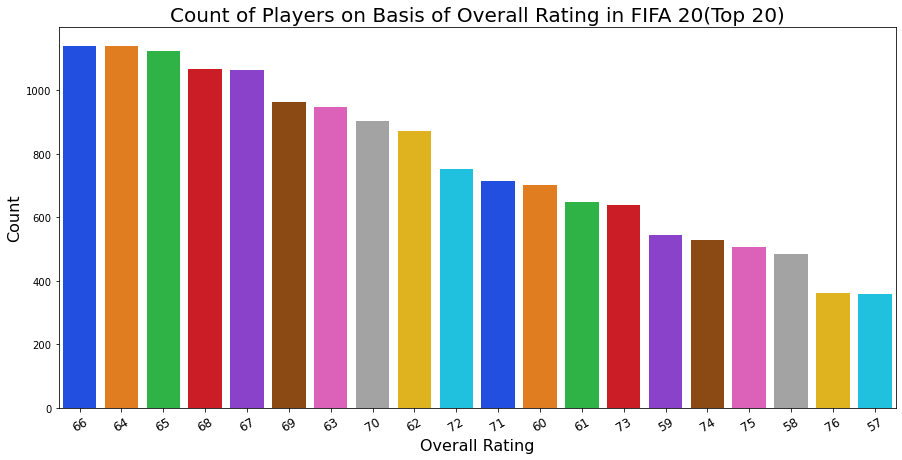

In [44]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='overall', data=df_20, palette='bright', order=df_20.overall.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of Overall Rating in FIFA 20(Top 20)', fontsize=20)

ax.set_xlabel(xlabel='Overall Rating', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

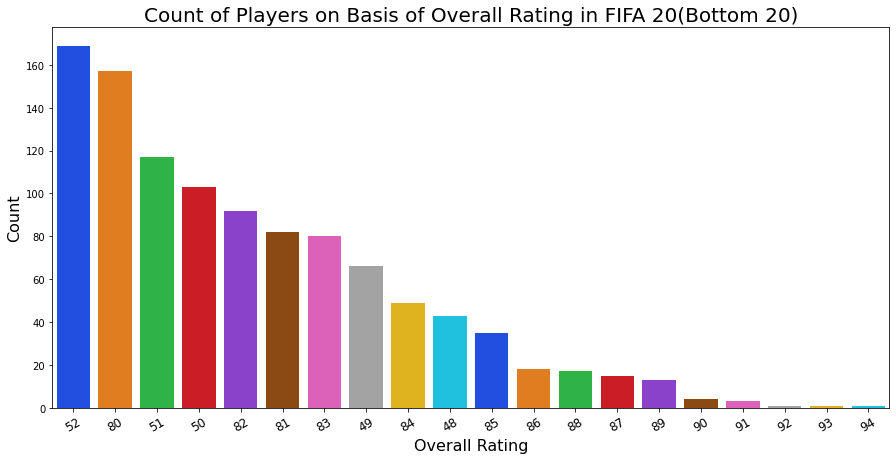

In [45]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='overall', data=df_20, palette='bright', order=df_20.overall.value_counts().iloc[-20:].index)
ax.set_title(label='Count of Players on Basis of Overall Rating in FIFA 20(Bottom 20)', fontsize=20)

ax.set_xlabel(xlabel='Overall Rating', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [46]:
fig = go.Figure()
data = df_20.sort_values(by='nationality')

fig.add_trace(go.Box(
    x = data['nationality'],
    y = data['bmi'],
    name = "Suspected Outliers",
    boxpoints = "suspectedoutliers",
    marker = dict(
        size = 12,
        color = 'rgb(180, 222, 43)',
        outliercolor = 'rgba(31, 158, 137, 0.6)',
        line = dict(
            outliercolor = 'rgba(31, 158, 137, 0.6)',
            outlierwidth = 2
        )),
    line_color = 'rgba(72, 40, 120)',
    text = data['short_name']
))

fig.update_layout(title='Styled Box Plot (with Suspected Outliers) - Nationality vs BMI',
                  xaxis_title='Nationality',
                  yaxis_title='BMI',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000'),
                  xaxis_rangeslider_visible=True)
fig.show()

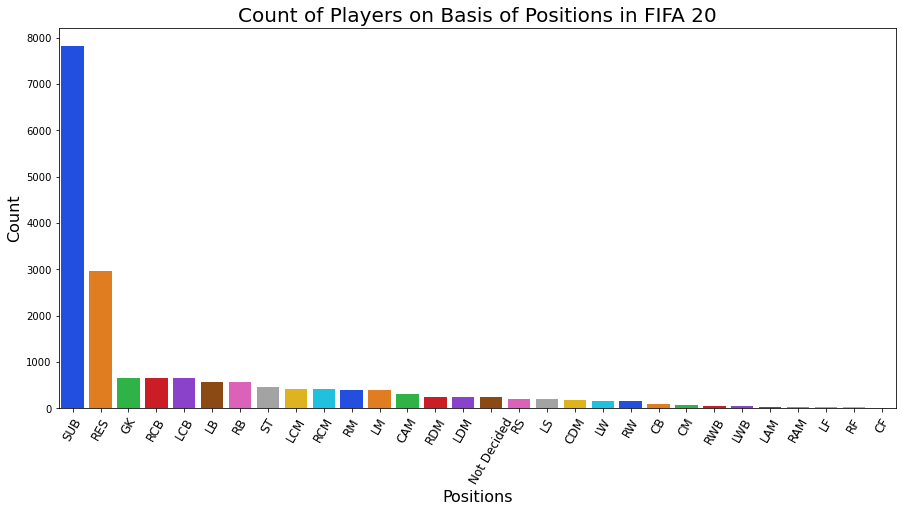

In [47]:
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='team_position', data=df_20, palette='bright', order=df_20.team_position.value_counts().index)
ax.set_title(label='Count of Players on Basis of Positions in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Positions', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=60, fontsize=12)

plt.show()

In [48]:
attack = ['LW', 'RW', 'ST', 'LF', 'RF', 'CF', 'LS', 'RS']
data = df_20.query('team_position in @attack')    
fig = px.pie(data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Bluered,
             title='Percentages of Player Attacking Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

In [49]:
defence = ['LWB', 'RWB', 'CB', 'LB', 'RB', 'LCB', 'RCB']
data = df_20.query('team_position in @defence')    
fig = px.pie(data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Sunsetdark,
             title='Percentages of Player Defending Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

In [50]:
mid = ['CM', 'RCM', 'LCM', 'RM', 'LM', 'CAM', 'RDM', 'LDM', 'CDM', 'RAM', 'LAM']
data = df_20.query('team_position in @mid')    
fig = px.pie(data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Agsunset,
             title='Percentages of Player Midfield Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

In [51]:
df_20['short_name'][df_20['overall']==max(df_20['overall'])]

0    L. Messi
Name: short_name, dtype: object

In [52]:
df_20['overall'].mean()

66.24499398183609

In [53]:
df_20_top_rated = df_20.sort_values(by=["overall"], ascending=False)
df_20_top_rated.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,1958,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2e+03,87,92,92,96,39,66,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,965,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,Disclosed,2018-07-10,2e+03,90,93,82,89,35,78,65,63,62,66,38,63,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,1952,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,Disclosed,2017-08-03,2e+03,91,85,87,95,32,58,65,63,62,66,38,63,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22
3,J. Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,1647,#Team Player,GK,13,Disclosed,2014-07-16,2e+03,68,52,57,63,52,65,87,92,78,89,52,90,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,24
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,1845,"#Speedster, #Dribbler, #Acrobat",LW,7,Disclosed,2019-07-01,2e+03,91,83,86,94,35,66,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24
5,K. De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,High/High,Normal,1665,"#Dribbler, #Playmaker , #Engine, #Distance Sh...",RCM,17,Disclosed,2015-08-30,2e+03,76,86,92,86,61,78,65,63,62,66,38,63,"Power Free-Kick, Avoids Using Weaker Foot, Div...

In [54]:
fig = px.pie(df_20_top_rated.head(25), names='club',
             title='Percentage of Clubs in top 25 players')
fig.show()

In [55]:
fig = px.pie(df_20_top_rated.head(25), names='nationality',
             title='Percentage of Nations in top 25 players')
fig.show()

In [56]:
df_20_high_value = df_20.sort_values(by=['value_eur'], ascending=False)
df_20_high_value.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,1952,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,Disclosed,2017-08-03,2e+03,91,85,87,95,32,58,65,63,62,66,38,63,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,1958,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2e+03,87,92,92,96,39,66,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,1917,"#Speedster, #Dribbler, #Acrobat",RW,7,Disclosed,2018-07-01,2e+03,96,84,78,90,39,75,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
5,K. De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,High/High,Normal,1665,"#Dribbler, #Playmaker , #Engine, #Distance Sh...",RCM,17,Disclosed,2015-08-30,2e+03,76,86,92,86,61,78,65,63,62,66,38,63,"Power Free-Kick, Avoids Using Weaker Foot, Div...",93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,15,13,5,10,13,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,1845,"#Speedster, #Dribbler, #Acrobat",LW,7,Disclosed,2019-07-01,2e+03,91,83,86,94,35,66,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24
12,H. Kane,25,1993-07-28,188,89,England,Tottenham Hotspur,89,91,83000000,220000,ST,Right,3,4,3,High/High,Normal,1598,"#Engine, #Distance Shooter, #Clinical Finisher",ST,10,Disclosed,2010-07-01,2e+03,

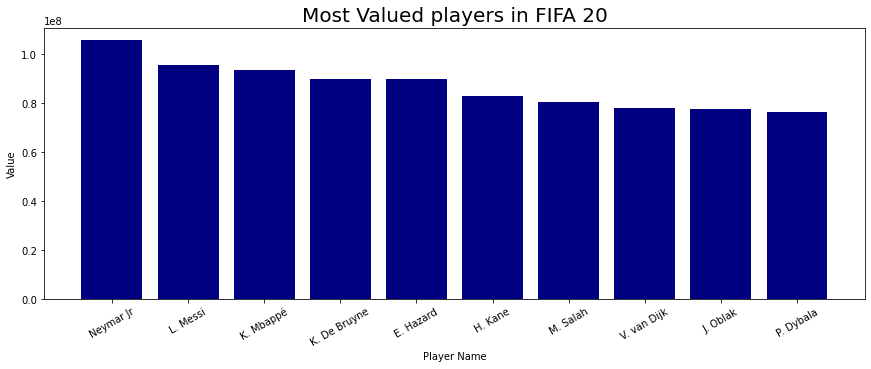

In [57]:
plt.figure(figsize = (50, 5))
plt.subplot(131)
plt.bar(df_20_high_value["short_name"].head(10), df_20_high_value["value_eur"].head(10), color='navy')
plt.tick_params(axis="x", rotation=30)
plt.ylabel("Value")
plt.xlabel("Player Name")

plt.title("Most Valued players in FIFA 20", fontsize=20)
plt.show()

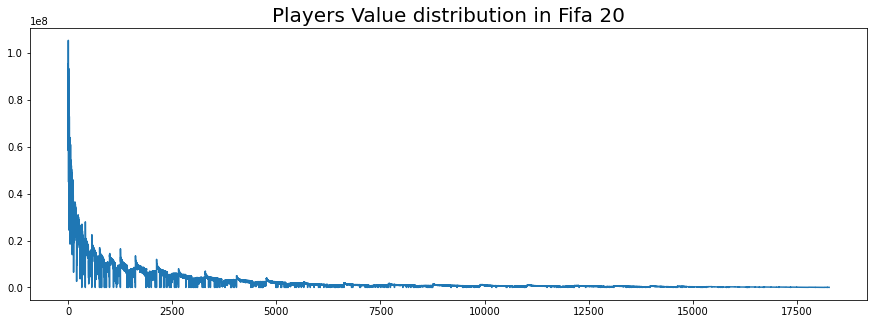

In [58]:
plt.rcParams['figure.figsize'] = (15, 5)
df_20['value_eur'].plot(kind="line")
plt.title("Players Value distribution in Fifa 20", fontsize=20)
plt.show()

In [59]:
df_20_high_release = df_20.sort_values(by=['release_clause_eur'], ascending=False)
df_20_high_release.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,1958,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2e+03,87,92,92,96,39,66,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,1952,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,Disclosed,2017-08-03,2e+03,91,85,87,95,32,58,65,63,62,66,38,63,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,1917,"#Speedster, #Dribbler, #Acrobat",RW,7,Disclosed,2018-07-01,2e+03,96,84,78,90,39,75,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,1845,"#Speedster, #Dribbler, #Acrobat",LW,7,Disclosed,2019-07-01,2e+03,91,83,86,94,35,66,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24
5,K. De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,High/High,Normal,1665,"#Dribbler, #Playmaker , #Engine, #Distance Sh...",RCM,17,Disclosed,2015-08-30,2e+03,76,86,92,86,61,78,65,63,62,66,38,63,"Power Free-Kick, Avoids Using Weaker Foot, Div...",93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,15,13,5,10,13,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21
3,J. Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,1647,#Team Player,GK,13,Disclosed,2014-07-16,2e+03,68,52,57,63,52,65,87,92,78,89,52,

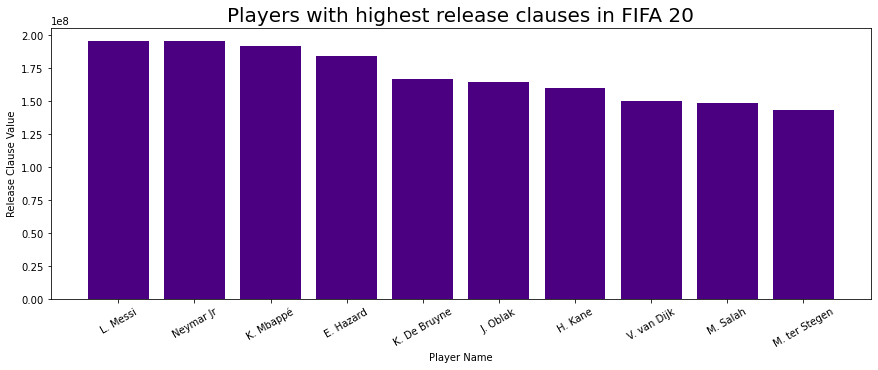

In [60]:
plt.figure(figsize = (50, 5))
plt.subplot(131)
plt.bar(df_20_high_release["short_name"].head(10), df_20_high_release["release_clause_eur"].head(10), color="indigo")
plt.tick_params(axis="x", rotation=30)
plt.ylabel("Release Clause Value")
plt.xlabel("Player Name")

plt.title("Players with highest release clauses in FIFA 20", fontsize=20)
plt.show()

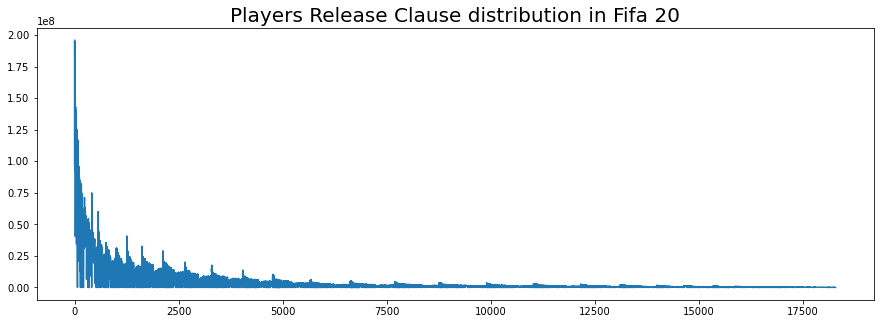

In [61]:
plt.rcParams['figure.figsize'] = (15, 5)
df_20['release_clause_eur'].plot(kind="line")
plt.title("Players Release Clause distribution in Fifa 20", fontsize=20)
plt.show()

In [62]:
print(df_20_high_release[:10]['age'].mean())
print(df_20_high_value[:10]['age'].mean())

26.7
26.5


Text(0.5, 1.0, 'Value of top 10 players')

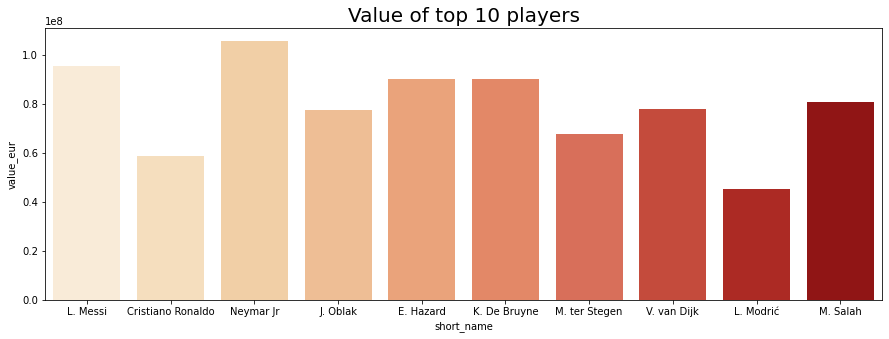

In [63]:
sns.barplot(df_20_top_rated['short_name'].head(10), df_20_top_rated['value_eur'].head(10), palette="OrRd").set_title("Value of top 10 players", fontsize=20)

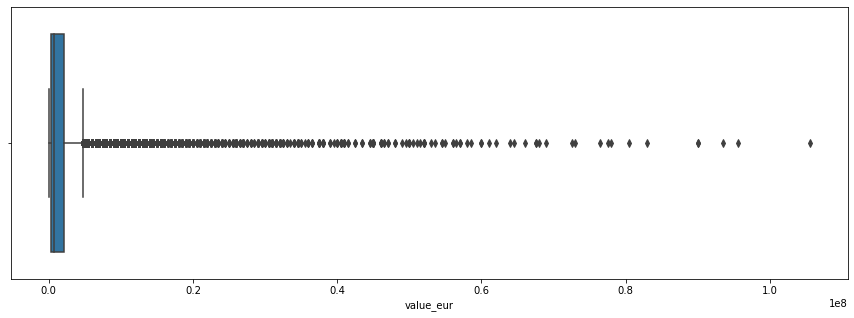

In [64]:
sns.boxplot(df_20['value_eur'])

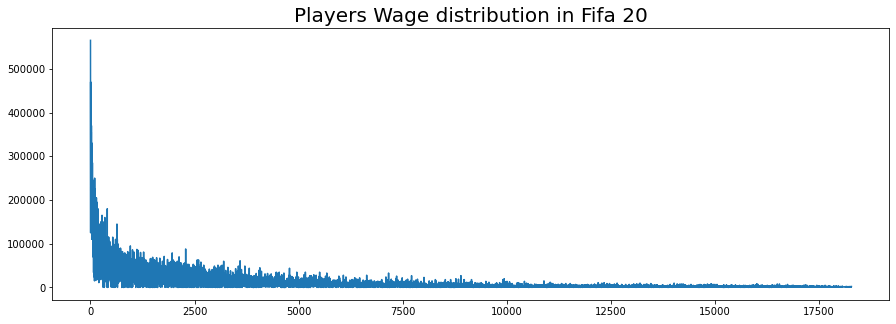

In [65]:
plt.rcParams['figure.figsize'] = (15, 5)
df_20['wage_eur'].plot(kind="line")
plt.title("Players Wage distribution in Fifa 20", fontsize=20)
plt.show()

In [66]:
df_20_high_wage = df_20.sort_values(by=['wage_eur'], ascending=False)
df_20_high_wage.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,1958,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2e+03,87,92,92,96,39,66,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,1845,"#Speedster, #Dribbler, #Acrobat",LW,7,Disclosed,2019-07-01,2e+03,91,83,86,94,35,66,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,965,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,Disclosed,2018-07-10,2e+03,90,93,82,89,35,78,65,63,62,66,38,63,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23
5,K. De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,High/High,Normal,1665,"#Dribbler, #Playmaker , #Engine, #Distance Sh...",RCM,17,Disclosed,2015-08-30,2e+03,76,86,92,86,61,78,65,63,62,66,38,63,"Power Free-Kick, Avoids Using Weaker Foot, Div...",93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,15,13,5,10,13,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21
22,A. Griezmann,28,1991-03-21,176,73,France,FC Barcelona,89,89,69000000,370000,"CF, ST, LW",Left,4,3,4,High/High,Normal,1415,"#Dribbler, #Engine, #Acrobat, #Clinical Finish...",LW,17,Disclosed,2019-07-12,2e+03,81,86,84,89,57,72,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Argues with Offici...",83,89,84,85,87,88,86,85,82,90,82,81,90,92,83,82,89,87,63,83,73,49,90,86,86,89,59,54,49,14,8,14,13,14,85+3,85+3,85+3,87+3,87+3,87+3,87+3,87+3,87+3,87+3,87+3,86+3,83+3,83+3,83+3,86+3,73+3,71+3,71+3,71+3,73+3,70+3,65+3,65+3,65+3,70+3,23
19,L. Suárez,32,1987-01-24,182,86,Uruguay,FC Barcelona,89,89,53000000,355000,ST,Right,5,4,3,High/Medium,Normal,1087,"#Distance Shooter, #Strength, #Clinical Finish...",ST,9,Disclose

Text(0.5, 1.0, 'Top 10 Player wages')

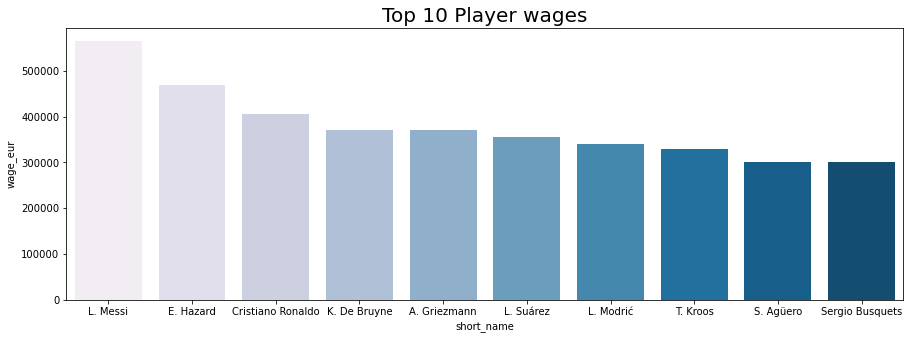

In [67]:
sns.barplot(df_20_high_wage['short_name'].head(10), df_20_high_wage['wage_eur'].head(10), palette="PuBu").set_title("Top 10 Player wages", fontsize=20)

Text(0.5, 1.0, 'Wage of top 10 players')

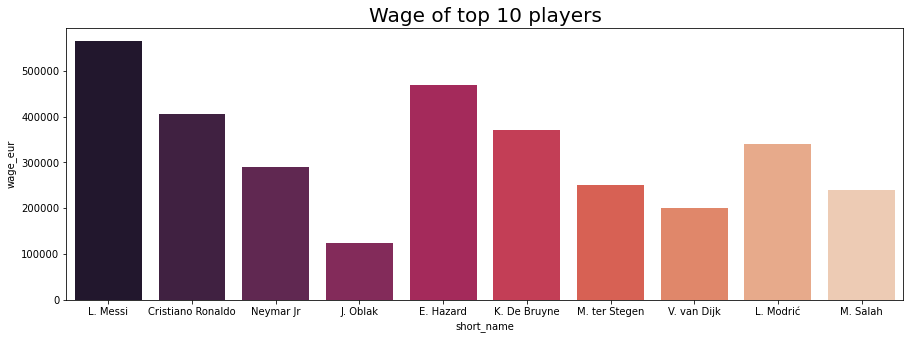

In [68]:
sns.barplot(df_20_top_rated['short_name'].head(10), df_20_top_rated['wage_eur'].head(10), palette="rocket").set_title("Wage of top 10 players", fontsize=20)

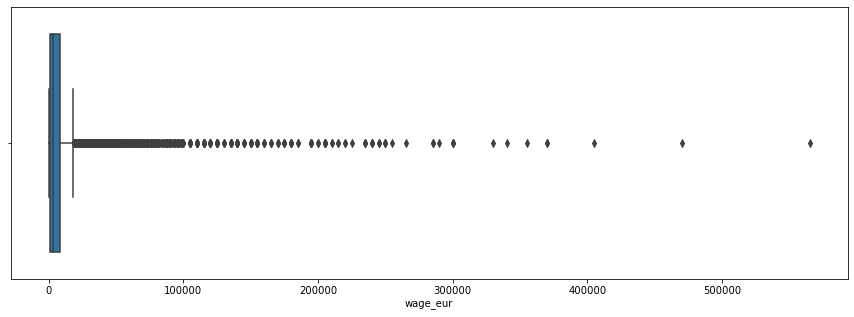

In [69]:
sns.boxplot(df_20['wage_eur'])

In [70]:
fig = px.scatter_3d(df_20_top_rated.head(20), x='potential', y='overall', z='wage_eur',
              color='short_name')
fig.update_layout(title='3D Plot of Potential, Overall and Wage in Euros of Top 20 FIFA Players')
fig.show()

In [71]:
fig = px.scatter_3d(df_20_top_rated.head(20), x='potential', y='overall', z='value_eur',
              color='short_name')
fig.update_layout(title='3D Plot of Potential, Overall and Value in Euros of Top 20 FIFA Players')
fig.show()

In [72]:
df_20_top_attackers = df_20[df_20['team_position'].str.contains('ST|RW|LW|CF|LS|RS')].sort_values(by="overall", ascending=False)
df_20_top_attackers.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,1958,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2e+03,87,92,92,96,39,66,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,965,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,Disclosed,2018-07-10,2e+03,90,93,82,89,35,78,65,63,62,66,38,63,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,1845,"#Speedster, #Dribbler, #Acrobat",LW,7,Disclosed,2019-07-01,2e+03,91,83,86,94,35,66,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24
9,M. Salah,27,1992-06-15,175,71,Egypt,Liverpool,90,90,80500000,240000,"RW, ST",Left,3,3,4,High/Medium,PLAYER_BODY_TYPE_25,1489,"#Speedster, #Dribbler, #Acrobat, #Clinical Fin...",RW,11,Disclosed,2017-07-01,2e+03,93,86,81,89,45,74,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",79,90,59,84,79,89,83,69,75,89,94,92,91,92,88,80,69,85,73,84,63,55,92,84,77,91,38,43,41,14,14,9,11,14,84+3,84+3,84+3,88+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,87+3,81+3,81+3,81+3,87+3,70+3,67+3,67+3,67+3,70+3,66+3,57+3,57+3,57+3,66+3,23
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,1917,"#Speedster, #Dribbler, #Acrobat",RW,7,Disclosed,2018-07-01,2e+03,96,84,78,90,39,75,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
12,H. Kane,25,1993-07-28,188,89,England,Tottenham Hotspur,89,91,83000000,220000,ST,Right,3,4,3,High/High,Normal,1598,"#Engine, #Distance Shooter, #Clinical Finisher",ST,10,Disclosed,2010-07-01,2e+03,70

Text(0.5, 1.0, 'Overall Ratings of Top 10 Attackers')

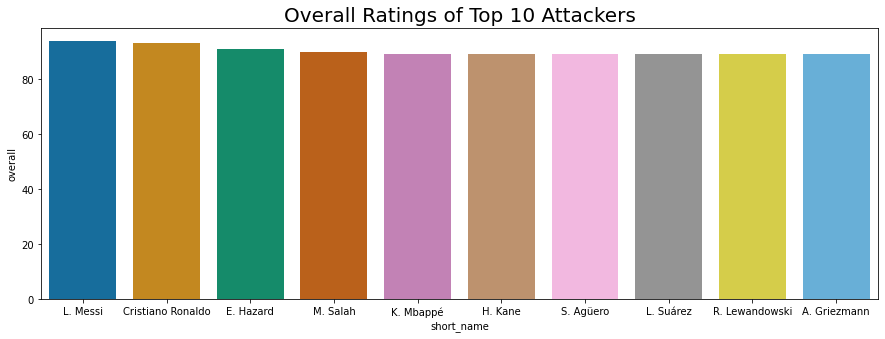

In [73]:
sns.barplot(df_20_top_attackers['short_name'].head(10), df_20_top_attackers['overall'].head(10), palette="colorblind").set_title("Overall Ratings of Top 10 Attackers", fontsize=20)

Text(0.5, 1.0, 'Values of Top 10 Attackers')

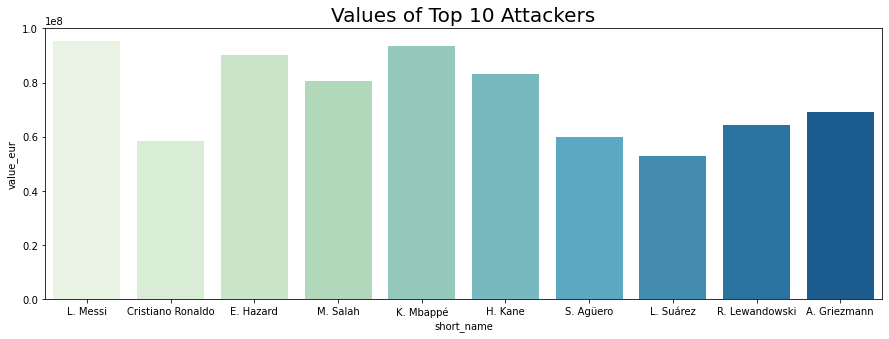

In [74]:
sns.barplot(df_20_top_attackers['short_name'].head(10), df_20_top_attackers['value_eur'].head(10), palette="GnBu").set_title("Values of Top 10 Attackers", fontsize=20)

Text(0.5, 1.0, 'Wages of Top 10 Attackers')

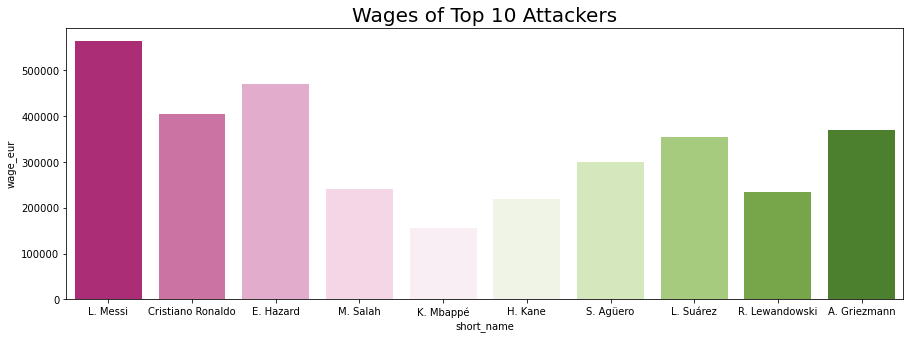

In [75]:
sns.barplot(df_20_top_attackers['short_name'].head(10), df_20_top_attackers['wage_eur'].head(10), palette="PiYG").set_title("Wages of Top 10 Attackers", fontsize=20)

In [76]:
df_20_top_midfield = df_20[df_20['team_position'].str.contains('CM|CAM|CDM|LM|RM')].sort_values(by="overall", ascending=False)
df_20_top_midfield.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,1952,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,Disclosed,2017-08-03,2e+03,91,85,87,95,32,58,65,63,62,66,38,63,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22
5,K. De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,High/High,Normal,1665,"#Dribbler, #Playmaker , #Engine, #Distance Sh...",RCM,17,Disclosed,2015-08-30,2e+03,76,86,92,86,61,78,65,63,62,66,38,63,"Power Free-Kick, Avoids Using Weaker Foot, Div...",93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,15,13,5,10,13,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21
8,L. Modrić,33,1985-09-09,172,66,Croatia,Real Madrid,90,90,45000000,340000,CM,Right,4,4,4,High/High,Lean,923,"#Dribbler, #Playmaker , #Crosser, #Acrobat, #...",RCM,10,Disclosed,2012-08-01,2e+03,74,76,89,89,72,66,65,63,62,66,38,63,"Argues with Officials, Finesse Shot, Speed Dri...",86,72,55,92,76,87,85,78,88,92,77,71,92,89,93,79,68,85,58,82,62,82,79,91,82,92,68,76,71,13,9,7,14,9,77+3,77+3,77+3,84+3,83+3,83+3,83+3,84+3,86+3,86+3,86+3,85+3,87+3,87+3,87+3,85+3,81+3,81+3,81+3,81+3,81+3,79+3,72+3,72+3,72+3,79+3,22
15,N. Kanté,28,1991-03-29,168,72,France,Chelsea,89,90,66000000,235000,"CDM, CM",Right,3,3,2,Medium/High,Normal,1304,"#Tackling , #Tactician",RCM,7,Disclosed,2016-07-16,2e+03,78,65,77,81,87,83,65,63,62,66,38,63,Diver,68,65,54,86,56,79,49,49,81,80,79,77,82,93,92,71,77,97,73,63,90,92,72,79,54,85,90,91,85,15,12,10,7,10,72+3,72+3,72+3,77+3,76+3,76+3,76+3,77+3,78+3,78+3,78+3,79+3,82+3,82+3,82+3,79+3,85+3,87+3,87+3,87+3,85+3,84+3,83+3,83+3,83+3,84+3,25
21,Sergio Busquets,30,1988-07-16,189,76,Spain,FC Barcelona,89,89,55000000,300000,"CDM, CM",Right,4,3,3,Medium/Medium,Lean,1128,"#Playmaker , #Tactician",CDM,5,Disclosed,2008-09-01,2e+03,42,62,80,80,85,80,65,63,62,66,38,63,Giant Throw-in,62,67,68,89,44,80,66,68,82,88,40,43,67,87,49,61,66,86,77,54,85,89,77,86,60,93,90,86,80,5,8,13,9,13,70+3,70+3,70+3,73+3,75+3,75+3,75+3,73+3,78+3,78+3,78+3,75+3,83+3,83+3,83+3,75+3,78+3,86+3,86+3,86+3,78+3,78+3,82+3,82+3,82+3,78+3,21
27,C. Eriksen,27,1992-02-14,181,76,Denmark,Tottenham Hotspur,88,89,68000000,205000,"CAM, CM",Right,3,5,4,High/High,Lean,1309,"#Playmaker , #Engine, #Crosser, #FK Specialis...",RM,23,Disclosed,2013-08-30,2e+03,73,81,90,84,53,63,65,63,62,66,38,63,"Selfish, Argues with Officials, Finesse Shot",88,77,52,91,80,81,89

Text(0.5, 1.0, 'Overall Ratings of Top 10 Midfielders')

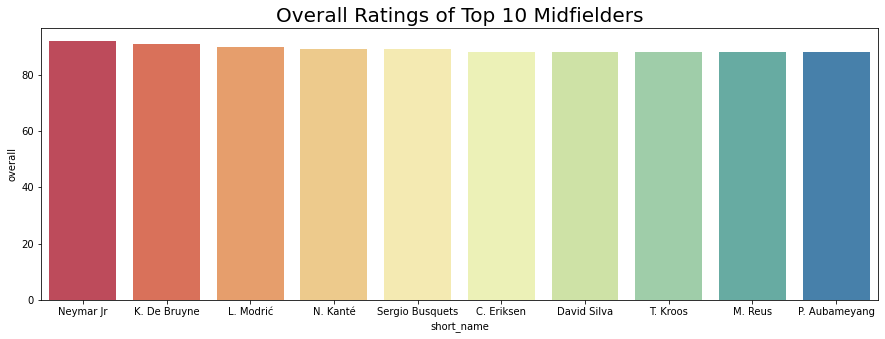

In [77]:
sns.barplot(df_20_top_midfield['short_name'].head(10), df_20_top_midfield['overall'].head(10), palette="Spectral").set_title("Overall Ratings of Top 10 Midfielders", fontsize=20)

Text(0.5, 1.0, 'Values of Top 10 Midfielders')

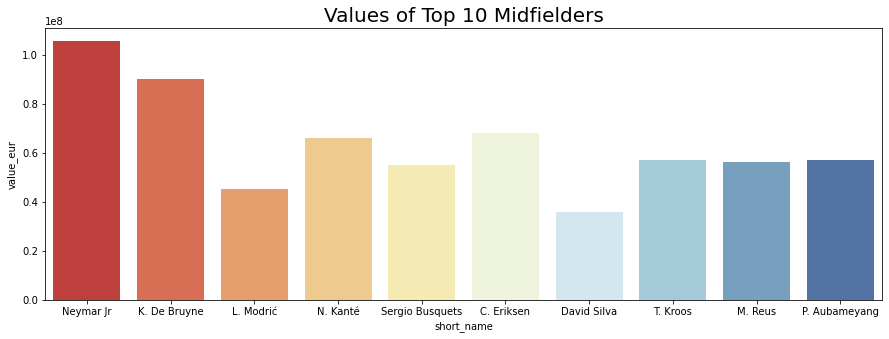

In [78]:
sns.barplot(df_20_top_midfield['short_name'].head(10), df_20_top_midfield['value_eur'].head(10), palette="RdYlBu").set_title("Values of Top 10 Midfielders", fontsize=20)

Text(0.5, 1.0, 'Wages of Top 10 Midfielders')

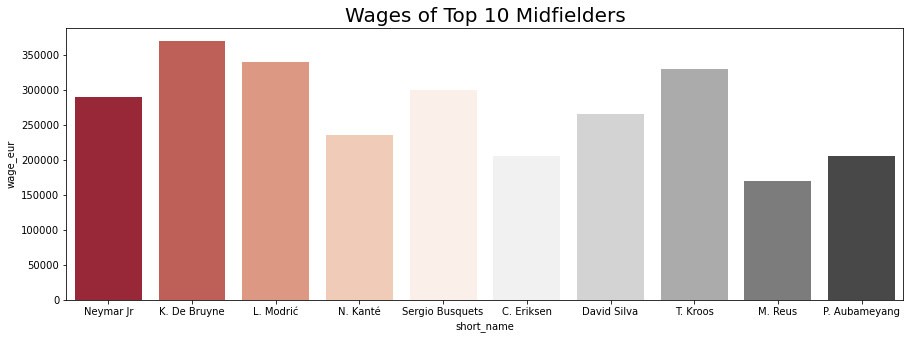

In [79]:
sns.barplot(df_20_top_midfield['short_name'].head(10), df_20_top_midfield['wage_eur'].head(10), palette="RdGy").set_title("Wages of Top 10 Midfielders", fontsize=20)

In [80]:
df_20_top_defend = df_20[df_20['team_position'].str.contains('CB|LB|RB|LWB|RWB')].sort_values(by="overall", ascending=False)
df_20_top_defend.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
7,V. van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,90,91,78000000,200000,CB,Right,3,3,2,Medium/Medium,Normal,1502,"#Tackling , #Tactician , #Strength, #Complete ...",LCB,4,Disclosed,2018-01-01,2e+03,77,60,70,71,90,86,65,63,62,66,38,63,"Diver, Avoids Using Weaker Foot, Leadership, L...",53,52,86,78,45,70,60,70,81,76,74,79,61,88,53,81,90,75,92,64,82,89,47,65,62,89,91,92,85,13,10,13,11,11,69+3,69+3,69+3,67+3,69+3,69+3,69+3,67+3,69+3,69+3,69+3,69+3,74+3,74+3,74+3,69+3,79+3,83+3,83+3,83+3,79+3,81+3,87+3,87+3,87+3,81+3,24
16,G. Chiellini,34,1984-08-14,187,85,Italy,Juventus,89,89,24500000,215000,CB,Left,4,3,2,Medium/High,Normal,404,"#Tackling , #Tactician , #Strength, #Complete ...",LCB,3,Disclosed,2005-07-01,2e+03,68,46,58,60,90,82,65,63,62,66,38,63,"Inflexible, Power Free-Kick, Injury Prone, Lon...",54,33,83,65,45,59,60,31,65,61,61,73,57,82,57,78,89,59,89,49,91,88,28,50,50,84,94,91,89,3,3,2,4,3,58+3,58+3,58+3,55+3,56+3,56+3,56+3,55+3,56+3,56+3,56+3,57+3,62+3,62+3,62+3,57+3,73+3,77+3,77+3,77+3,73+3,76+3,86+3,86+3,86+3,76+3,24
18,Sergio Ramos,33,1986-03-30,184,82,Spain,Real Madrid,89,89,31500000,300000,CB,Right,4,3,3,High/Medium,Normal,646,"#Aerial Threat, #Tackling , #Tactician , #Comp...",LCB,4,Disclosed,2005-08-01,2e+03,72,68,75,73,87,85,65,63,62,66,38,63,"Injury Prone, Avoids Using Weaker Foot, Leader...",66,63,92,80,69,65,74,72,83,83,74,71,78,87,66,79,93,80,85,62,90,88,67,71,86,84,85,87,90,11,8,9,7,11,74+3,74+3,74+3,72+3,73+3,73+3,73+3,72+3,74+3,74+3,74+3,73+3,78+3,78+3,78+3,73+3,80+3,84+3,84+3,84+3,80+3,82+3,87+3,87+3,87+3,82+3,24
11,K. Koulibaly,28,1991-06-20,187,89,Senegal,Napoli,89,91,67500000,150000,CB,Right,3,3,2,Medium/High,Normal,1198,"#Tackling , #Tactician , #Strength, #Complete ...",LCB,26,Disclosed,2014-07-01,2e+03,71,28,54,67,89,87,65,63,62,66,38,63,Long Passer (CPU AI Only),30,22,83,71,14,69,28,28,63,71,69,73,52,86,41,55,81,73,95,15,87,88,35,52,33,82,91,90,87,7,11,7,13,5,56+3,56+3,56+3,55+3,57+3,57+3,57+3,55+3,58+3,58+3,58+3,60+3,65+3,65+3,65+3,60+3,74+3,79+3,79+3,79+3,74+3,77+3,86+3,86+3,86+3,77+3,25
29,Piqué,32,1987-02-02,194,85,Spain,FC Barcelona,88,88,38000000,285000,CB,Right,4,3,2,High/Medium,Normal,779,"#Aerial Threat, #Tackling , #Tactician , #Stre...",RCB,3,Disclosed,2008-07-01,2e+03,56,61,72,68,88,80,65,63,62,66,38,63,Avoids Using Weaker Foot,57,65,85,83,57,63,58,43,81,82,48,63,57,85,36,62,75,70,87,51,76,89,64,72,69,87,89,88,87,10,11,14,15,8,70+3,70+3,70+3,67+3,69+3,69+3,69+3,67+3,71+3,71+3,71+3,69+3,76+3,76+3,76+3,69+3,77+3,83+3,83+3,83+3,77+3,78+3,85+3,85+3,85+3,78+3,22
35,D. Godín,33,1986-02-16,187,78,Uruguay,Inter,88,88,28000000,135000,CB,Right,3,3,2,Medium/High,Lean,476,"#Tackling , #Tactician",RCB,2,Disclosed,2019-07-01,2e+03,60,48,64,61,89,83,65,63,62,66,38,63,"Injury Prone, Long Passer (CPU AI Only)",52,42,88,79,47,53,49,49,70,7

Text(0.5, 1.0, 'Overall Ratings of Top 10 Defenders')

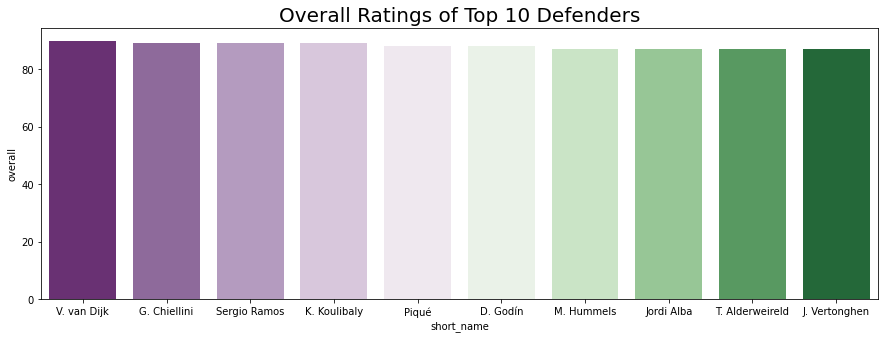

In [81]:
sns.barplot(df_20_top_defend['short_name'].head(10), df_20_top_defend['overall'].head(10), palette="PRGn").set_title("Overall Ratings of Top 10 Defenders", fontsize=20)

Text(0.5, 1.0, 'Values of Top 10 Defenders')

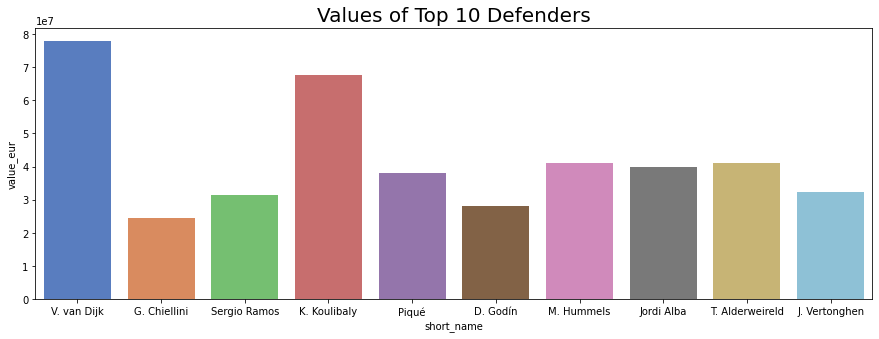

In [82]:
sns.barplot(df_20_top_defend['short_name'].head(10), df_20_top_defend['value_eur'].head(10), palette="muted").set_title("Values of Top 10 Defenders", fontsize=20)

Text(0.5, 1.0, 'Wages of Top 10 Defenders')

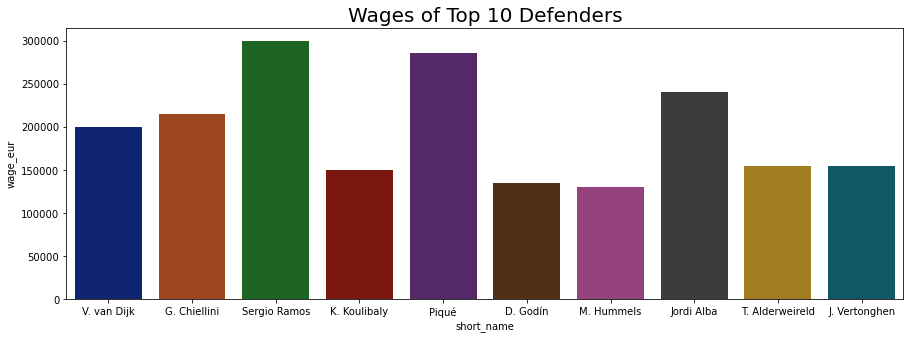

In [83]:
sns.barplot(df_20_top_defend['short_name'].head(10), df_20_top_defend['wage_eur'].head(10), palette="dark").set_title("Wages of Top 10 Defenders", fontsize=20)

In [84]:
df_20.preferred_foot.value_counts()

Right    13960
Left      4318
Name: preferred_foot, dtype: int64

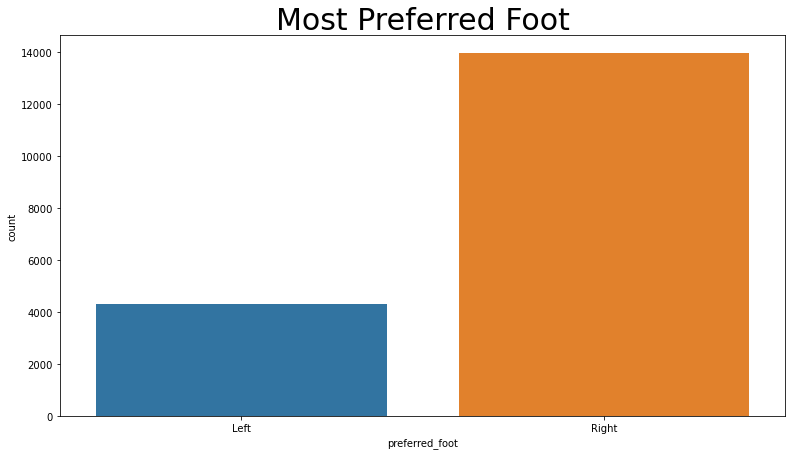

In [85]:
plt.rcParams['figure.figsize']=(13, 7)
sns.countplot(df_20['preferred_foot'])
plt.title("Most Preferred Foot", fontsize=30)
plt.show()

In [86]:
foot = ['Left', 'Right']
data = df_20.query('preferred_foot in @foot')    
fig = px.pie(data, names='preferred_foot',
             color_discrete_sequence=px.colors.sequential.Bluered,
             title='Overall Preferred foot percentages')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

In [87]:
df_20_high_value[df_20_high_value['preferred_foot']=='Right'].head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,1952,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,Disclosed,2017-08-03,2e+03,91,85,87,95,32,58,65,63,62,66,38,63,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,1917,"#Speedster, #Dribbler, #Acrobat",RW,7,Disclosed,2018-07-01,2e+03,96,84,78,90,39,75,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
5,K. De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,High/High,Normal,1665,"#Dribbler, #Playmaker , #Engine, #Distance Sh...",RCM,17,Disclosed,2015-08-30,2e+03,76,86,92,86,61,78,65,63,62,66,38,63,"Power Free-Kick, Avoids Using Weaker Foot, Div...",93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,15,13,5,10,13,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,1845,"#Speedster, #Dribbler, #Acrobat",LW,7,Disclosed,2019-07-01,2e+03,91,83,86,94,35,66,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24
12,H. Kane,25,1993-07-28,188,89,England,Tottenham Hotspur,89,91,83000000,220000,ST,Right,3,4,3,High/High,Normal,1598,"#Engine, #Distance Shooter, #Clinical Finisher",ST,10,Disclosed,2010-07-01,2e+03,70,91,79,81,47,83,65,63,62,66,38,63,"Injury Free, Avoids Using Weaker Foot, Argues ...",75,94,86,81,85,80,78,68,83,84,68,72,71,91,73,90,79,87,84,86,78,35,93,81,90,91,56,36,38,8,10,11,14,11,86+3,86+3,86+3,82+3,84+3,84+3,84+3,82+3,83+3,83+3,83+3,82+3,79+3,79+3,79+3,82+3,65+3,66+3,66+3,66+3,65+3,62+3,60+3,60+3,60+3,62+3,25
7,V. van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,90,91,78000000,200000,CB,Right,3,3,2,Medium/Medium,Normal,1502,"#Tackling , #Tactician , #Strength, #Complete ...",LCB,4,Disclosed,2018-01-01,2e+03,77

In [88]:
df_20_high_value[df_20_high_value['preferred_foot']=='Left'].head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,1958,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2e+03,87,92,92,96,39,66,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24
9,M. Salah,27,1992-06-15,175,71,Egypt,Liverpool,90,90,80500000,240000,"RW, ST",Left,3,3,4,High/Medium,PLAYER_BODY_TYPE_25,1489,"#Speedster, #Dribbler, #Acrobat, #Clinical Fin...",RW,11,Disclosed,2017-07-01,2e+03,93,86,81,89,45,74,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",79,90,59,84,79,89,83,69,75,89,94,92,91,92,88,80,69,85,73,84,63,55,92,84,77,91,38,43,41,14,14,9,11,14,84+3,84+3,84+3,88+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,87+3,81+3,81+3,81+3,87+3,70+3,67+3,67+3,67+3,70+3,66+3,57+3,57+3,57+3,66+3,23
23,P. Dybala,25,1993-11-15,177,75,Argentina,Juventus,88,92,76500000,215000,"CAM, RW",Left,3,3,4,Medium/Medium,Normal,1320,"#Dribbler, #Playmaker , #FK Specialist, #Acro...",RW,10,Disclosed,2015-07-01,2e+03,83,82,84,90,43,64,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",82,80,64,87,88,90,88,88,75,93,86,81,91,84,85,80,75,79,61,86,48,42,80,87,86,84,32,48,40,5,4,4,5,8,80+3,80+3,80+3,85+3,85+3,85+3,85+3,85+3,86+3,86+3,86+3,85+3,80+3,80+3,80+3,85+3,68+3,64+3,64+3,64+3,68+3,64+3,54+3,54+3,54+3,64+3,23
22,A. Griezmann,28,1991-03-21,176,73,France,FC Barcelona,89,89,69000000,370000,"CF, ST, LW",Left,4,3,4,High/High,Normal,1415,"#Dribbler, #Engine, #Acrobat, #Clinical Finish...",LW,17,Disclosed,2019-07-12,2e+03,81,86,84,89,57,72,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Argues with Offici...",83,89,84,85,87,88,86,85,82,90,82,81,90,92,83,82,89,87,63,83,73,49,90,86,86,89,59,54,49,14,8,14,13,14,85+3,85+3,85+3,87+3,87+3,87+3,87+3,87+3,87+3,87+3,87+3,86+3,83+3,83+3,83+3,86+3,73+3,71+3,71+3,71+3,73+3,70+3,65+3,65+3,65+3,70+3,23
41,Bernardo Silva,24,1994-08-10,173,64,Portugal,Manchester City,87,90,64000000,210000,"RW, CAM, CM",Left,2,3,4,High/High,Lean,1232,"#Dribbler, #Engine, #Acrobat",RW,20,Disclosed,2017-07-01,2e+03,81,76,83,92,51,67,65,63,62,66,38,63,"Selfish, Finesse Shot, Crowd Favourite",85,78,51,86,69,92,84,67,74,92,85,78,94,85,92,74,51,93,54,75,69,49,85,85,68,87,49,59,40,9,10,14,12,9,77+2,77+2,77+2,85+2,84+2,84+2,84+2,85+2,85+2,85+2,85+2,86+2,82+2,82+2,82+2,86+2,72+2,69+2,69+2,69+2,72+2,67+2,57+2,57+2,57+2,67+2,21
55,L. Sané,23,1996-01-11,183,75,Germany,Manchester City,86,92,61000000,195000,LW,Left,2,3,4,High/Medium,Lean,1251,"#Speedster, #Dribbler, #Acrobat",SUB,19,Disclosed,2016-08-02,2e+03,95,81,7

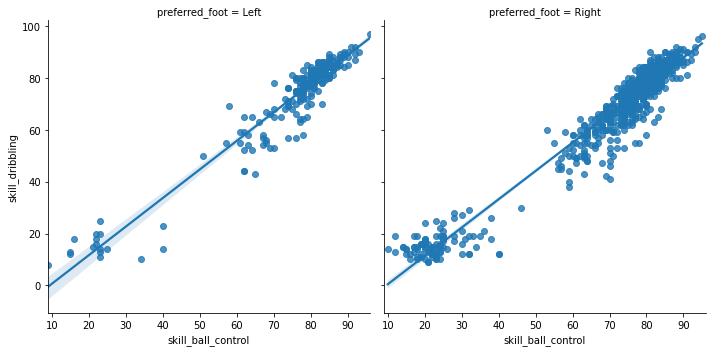

In [89]:
sns.lmplot(x='skill_ball_control', y='skill_dribbling', data=df_20[:1000], col='preferred_foot')

In [90]:
df_20['potential'].mean()

71.5468869679396

In [91]:
young_talent = df_20[df_20['age']<=22]
young_talent.sort_values(by=["potential"], ascending=False).head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,1917,"#Speedster, #Dribbler, #Acrobat",RW,7,Disclosed,2018-07-01,2e+03,96,84,78,90,39,75,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
411,João Félix,19,1999-11-10,181,70,Portugal,Atlético Madrid,80,93,28000000,38000,"CF, ST",Right,1,4,5,High/Medium,Lean,749,#Team Player,RS,7,Disclosed,2019-07-03,2e+03,82,80,74,81,40,70,65,63,62,66,38,63,"Selfish, Finesse Shot, Speed Dribbler (CPU AI ...",73,79,69,76,79,82,81,58,67,80,79,85,83,83,80,82,79,79,64,80,69,38,84,77,68,82,30,42,35,13,12,14,13,14,79+2,79+2,79+2,79+2,80+2,80+2,80+2,79+2,79+2,79+2,79+2,78+2,73+2,73+2,73+2,78+2,62+2,59+2,59+2,59+2,62+2,59+2,53+2,53+2,53+2,59+2,21
73,M. de Ligt,19,1999-08-12,189,89,Netherlands,Juventus,85,93,50000000,76000,CB,Right,3,4,2,Medium/High,Normal,925,#Strength,SUB,4,Disclosed,2019-07-18,2e+03,67,58,66,68,83,84,65,63,62,66,38,63,"Diver, Avoids Using Weaker Foot, Long Passer (...",52,50,85,76,40,66,48,55,74,74,61,72,56,83,60,82,84,77,88,64,82,82,44,63,40,82,86,82,80,12,11,11,12,10,67+3,67+3,67+3,63+3,65+3,65+3,65+3,63+3,66+3,66+3,66+3,65+3,71+3,71+3,71+3,65+3,74+3,79+3,79+3,79+3,74+3,76+3,82+3,82+3,82+3,76+3,24
108,J. Sancho,19,2000-03-25,180,76,England,Borussia Dortmund,84,92,44500000,61000,"RM, LM",Right,2,4,5,Medium/Low,Lean,823,"#Dribbler, #Acrobat",RM,7,Disclosed,2017-08-31,2e+03,88,72,77,90,36,60,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Speed Dribbler (CP...",78,78,37,83,80,92,81,48,59,88,89,87,91,84,90,68,51,77,59,62,43,29,78,83,57,80,32,45,34,7,11,10,11,13,75+2,75+2,75+2,83+2,81+2,81+2,81+2,83+2,82+2,82+2,82+2,83+2,75+2,75+2,75+2,83+2,64+2,58+2,58+2,58+2,64+2,59+2,47+2,47+2,47+2,59+2,23
109,K. Havertz,20,1999-06-11,188,83,Germany,Bayer 04 Leverkusen,84,92,46000000,70000,"CAM, RM",Left,1,4,4,Medium/Medium,Lean,874,#Team Player,RF,29,Disclosed,2016-07-01,2e+03,84,78,79,84,44,65,65,63,62,66,38,63,"Beat Offside Trap, Leadership, Argues with Off...",73,81,74,85,80,84,79,53,78,87,77,89,78,82,73,73,69,82,65,75,41,38,83,82,69,84,39,46,38,6,8,11,10,12,80+2,80+2,80+2,82+2,82+2,82+2,82+2,82+2,82+2,82+2,82+2,82+2,78+2,78+2,78+2,82+2,65+2,63+2,63+2,63+2,65+2,62+2,54+2,54+2,54+2,62+2,23
568,Vinícius Jr.,18,2000-07-12,176,73,Brazil,Real Madrid,79,92,22500000,60000,LW,Right,2,4,5,High/Medium,Lean,602,"#Speedster, #Dribbler, #Acrobat",RW,28,Disclosed,2018-07-12,2e+03,93,70,71,85,29,63,65,63,62,66,38,63,"Selfish, Early Crosser, Speed Dribbler (CPU AI...",71,68,50,73,70,86,77,62,67,82,92,94,93,77,83,74,75,79,60,68,48,26

In [92]:
most_valuable_young = young_talent.sort_values(by=["overall"], ascending=False)
most_valuable_young.head()

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,1917,"#Speedster, #Dribbler, #Acrobat",RW,7,Disclosed,2018-07-01,2e+03,96,84,78,90,39,75,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
74,G. Donnarumma,20,1999-02-25,196,90,Italy,Milan,85,92,41500000,34000,GK,Right,3,3,1,Medium/Medium,Normal,789,#Team Player,GK,99,Disclosed,2015-07-01,2e+03,68,52,57,63,52,65,90,80,74,90,50,80,"Swerve Pass, Acrobatic Clearance",12,12,12,34,8,28,12,14,24,28,46,54,64,79,38,56,72,34,72,18,30,26,14,50,24,68,20,14,16,90,80,74,80,90,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,23
75,F. de Jong,22,1997-05-12,180,74,Netherlands,FC Barcelona,85,91,52000000,195000,"CM, CDM",Right,3,3,4,Medium/High,Lean,1170,"#Dribbler, #Playmaker , #Complete Midfielder",LCM,21,Disclosed,2019-07-01,2e+03,79,64,84,87,76,76,65,63,62,66,38,63,"Selfish, Finesse Shot, Speed Dribbler (CPU AI ...",75,64,66,90,69,88,84,64,86,89,80,78,84,87,79,68,76,82,74,62,72,81,70,86,45,90,75,75,77,7,13,10,10,9,74+3,74+3,74+3,80+3,79+3,79+3,79+3,80+3,82+3,82+3,82+3,82+3,83+3,83+3,83+3,82+3,81+3,82+3,82+3,82+3,81+3,79+3,76+3,76+3,76+3,79+3,22
73,M. de Ligt,19,1999-08-12,189,89,Netherlands,Juventus,85,93,50000000,76000,CB,Right,3,4,2,Medium/High,Normal,925,#Strength,SUB,4,Disclosed,2019-07-18,2e+03,67,58,66,68,83,84,65,63,62,66,38,63,"Diver, Avoids Using Weaker Foot, Long Passer (...",52,50,85,76,40,66,48,55,74,74,61,72,56,83,60,82,84,77,88,64,82,82,44,63,40,82,86,82,80,12,11,11,12,10,67+3,67+3,67+3,63+3,65+3,65+3,65+3,63+3,66+3,66+3,66+3,65+3,71+3,71+3,71+3,65+3,74+3,79+3,79+3,79+3,74+3,76+3,82+3,82+3,82+3,76+3,24
108,J. Sancho,19,2000-03-25,180,76,England,Borussia Dortmund,84,92,44500000,61000,"RM, LM",Right,2,4,5,Medium/Low,Lean,823,"#Dribbler, #Acrobat",RM,7,Disclosed,2017-08-31,2e+03,88,72,77,90,36,60,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Speed Dribbler (CP...",78,78,37,83,80,92,81,48,59,88,89,87,91,84,90,68,51,77,59,62,43,29,78,83,57,80,32,45,34,7,11,10,11,13,75+2,75+2,75+2,83+2,81+2,81+2,81+2,83+2,82+2,82+2,82+2,83+2,75+2,75+2,75+2,83+2,64+2,58+2,58+2,58+2,64+2,59+2,47+2,47+2,47+2,59+2,23


In [93]:
print(most_valuable_young['age'][:10].mean())
print(most_valuable_young['value_eur'][:10].mean())

20.5
47950000.0


In [94]:
young_talent.sort_values(by=["release_clause_eur"], ascending=False).head()

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,1917,"#Speedster, #Dribbler, #Acrobat",RW,7,Disclosed,2018-07-01,2e+03,96,84,78,90,39,75,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23
75,F. de Jong,22,1997-05-12,180,74,Netherlands,FC Barcelona,85,91,52000000,195000,"CM, CDM",Right,3,3,4,Medium/High,Lean,1170,"#Dribbler, #Playmaker , #Complete Midfielder",LCM,21,Disclosed,2019-07-01,2e+03,79,64,84,87,76,76,65,63,62,66,38,63,"Selfish, Finesse Shot, Speed Dribbler (CPU AI ...",75,64,66,90,69,88,84,64,86,89,80,78,84,87,79,68,76,82,74,62,72,81,70,86,45,90,75,75,77,7,13,10,10,9,74+3,74+3,74+3,80+3,79+3,79+3,79+3,80+3,82+3,82+3,82+3,82+3,83+3,83+3,83+3,82+3,81+3,82+3,82+3,82+3,81+3,79+3,76+3,76+3,76+3,79+3,22
110,O. Dembélé,22,1997-05-15,178,67,France,FC Barcelona,84,90,42500000,195000,"RW, LW",Left,3,5,5,High/Medium,Lean,956,"#Speedster, #Dribbler",SUB,11,Disclosed,2017-08-28,2e+03,93,79,80,87,36,57,65,63,62,66,38,63,"Power Free-Kick, Selfish, Early Crosser, Crowd...",84,79,43,82,76,89,82,64,76,85,94,93,89,78,83,83,59,69,52,78,54,36,78,78,75,82,42,30,33,6,6,14,10,13,76+3,76+3,76+3,84+3,82+3,82+3,82+3,84+3,82+3,82+3,82+3,83+3,75+3,75+3,75+3,83+3,64+3,59+3,59+3,59+3,64+3,59+3,47+3,47+3,47+3,59+3,21
73,M. de Ligt,19,1999-08-12,189,89,Netherlands,Juventus,85,93,50000000,76000,CB,Right,3,4,2,Medium/High,Normal,925,#Strength,SUB,4,Disclosed,2019-07-18,2e+03,67,58,66,68,83,84,65,63,62,66,38,63,"Diver, Avoids Using Weaker Foot, Long Passer (...",52,50,85,76,40,66,48,55,74,74,61,72,56,83,60,82,84,77,88,64,82,82,44,63,40,82,86,82,80,12,11,11,12,10,67+3,67+3,67+3,63+3,65+3,65+3,65+3,63+3,66+3,66+3,66+3,65+3,71+3,71+3,71+3,65+3,74+3,79+3,79+3,79+3,74+3,76+3,82+3,82+3,82+3,76+3,24
109,K. Havertz,20,1999-06-11,188,83,Germany,Bayer 04 Leverkusen,84,92,46000000,70000,"CAM, RM",Left,1,4,4,Medium/Medium,Lean,874,#Team Player,RF,29,Disclosed,2016-07-01,2e+03,84,78,79,84,44,65,65,63,62,66,38,63,"Beat Offside Trap, Leadership, Argues with Off...",73,81,74,85,80,84,79,53,78,87,77,89,78,82,73,73,69,82,65,75,41,38,83,82,69,84,39,46,38,6,8,11,10,12,80+2,80+2,80+2,82+2,82+2,82+2,82+2,82+2,82+2,82+2,82+2,82+2,78+2,78+2,78+2,82+2,65+2,63+2,63+2,63+2,65+2,62+2,54+2,54+2,54+2,62+2,23


In [95]:
for p in range(80, 95):
    overall_req = df_20[df_20['overall']==p]
    potential_req = df_20[df_20['potential']==p]
    mean = round(overall_req.loc[:, 'value_eur'].mean())
    df_20.at[potential_req.index, 'potential_value'] = mean
    
df_copy = df_20
df_copy['value_change'] = df_copy['potential_value'] - df_copy['value_eur']
df_copy.loc[:, ['short_name', 'age', 'overall', 'potential', 'value_eur', 'potential_value', 'value_change']].sort_values(by="value_change", ascending=False).head(20)

,short_name,age,overall,potential,value_eur,potential_value,value_change
568,Vinícius Jr.,18,79,92,22500000,1e+08,8e+07
74,G. Donnarumma,20,85,92,41500000,1e+08,6e+07
108,J. Sancho,19,84,92,44500000,1e+08,6e+07
109,K. Havertz,20,84,92,46000000,1e+08,6e+07
1254,P. Foden,19,76,90,16500000,7e+07,5e+07
2121,D. Szoboszlai,18,74,89,11500000,6e+07,5e+07
4756,P. De la Vega,18,70,88,3700000,5e+07,5e+07
1615,S. Tonali,19,75,89,13500000,6e+07,5e+07
4041,W. Saliba,18,71,88,4600000,5e+07,5e+07
753,A. Meret,22,78,89,14000000,6e+07,5e+07


In [96]:
corr_mat = df_20.corr()
corr_mat

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,bmi,potential_value,value_change
age,1e+00,8e-02,2e-01,5e-01,-3e-01,8e-02,2e-01,3e-01,7e-02,5e-02,7e-02,-2e-01,-2e-01,2e-01,3e-01,1e-01,2e-01,4e-01,2e-01,2e-01,2e-01,2e-01,1e-01,2e-01,1e-01,8e-02,1e-01,1e-01,1e-01,2e-02,1e-01,2e-01,2e-01,9e-02,-2e-01,-1e-01,-2e-02,5e-01,-9e-02,3e-01,2e-01,1e-01,3e-01,2e-01,3e-01,2e-01,9e-02,2e-01,1e-01,4e-01,2e-01,1e-01,1e-01,1e-01,1e-01,1e-01,1e-01,1e-01,3e-01,-2e-03,-6e-01
height_cm,8e-02,1e+00,8e-01,4e-02,-2e-03,1e-02,2e-02,4e-02,-2e-01,-4e-01,1e-02,-3e-02,-4e-01,-2e-01,-3e-01,-4e-01,2e-01,4e-01,3e-02,3e-02,2e-02,3e-02,-4e-03,3e-02,-5e-01,-4e-01,1e-02,-4e-01,-4e-01,-5e-01,-4e-01,-4e-01,-3e-01,-4e-01,-6e-01,-5e-01,-6e-01,-2e-02,-8e-01,-2e-01,-4e-02,-3e-01,5e-01,-4e-01,-5e-02,-5e-02,-4e-01,-4e-01,-3e-01,-2e-01,-8e-02,-7e-02,-8e-02,4e-01,4e-01,4e-01,4e-01,4e-01,-4e-02,3e-02,-6e-03
weight_kg,2e-01,8e-01,1e+00,2e-01,-1e-02,5e-02,7e-02,9e-02,-1e-01,-4e-01,5e-02,-8e-02,-3e-01,-9e-02,-2e-01,-3e-01,2e-01,5e-01,7e-02,8e-02,6e-02,7e-02,2e-02,8e-02,-4e-01,-3e-01,4e-02,-3e-01,-3e-01,-4e-01,-3e-01,-3e-01,-3e-01,-3e-01,-5e-01,-4e-01,-5e-01,9e-02,-7e-01,-6e-02,3e-02,-2e-01,6e-01,-3e-01,3e-02,-3e-02,-4e-01,-3e-01,-2e-01,-5e-02,-5e-02,-5e-02,-6e-02,3e-01,3e-01,3e-01,3e-01,3e-01,6e-01,4e-02,-1e-01
overall,5e-01,4e-02,2e-01,1e+00,6e-01,6e-01,6e-01,5e-01,2e-01,4e-01,6e-01,-2e-01,1e-01,5e-01,6e-01,6e-01,3e-01,5e-01,3e-01,3e-01,3e-01,3e-01,2e-01,3e-01,4e-01,3e-01,3e-01,5e-01,4e-01,4e-01,4e-01,4e-01,5e-01,5e-01,2e-01,2e-01,3e-01,9e-01,1e-01,6e-01,3e-01,4e-01,4e-01,4e-01,4e-01,3e-01,4e-01,5e-01,3e-01,7e-01,3e-01,2e-01,2e-01,-1e-02,-1e-02,-2e-02,-6e-03,-1e-02,2e-01,4e-01,-4e-01
potential,-3e-01,-2e-03,-1e-02,6e-01,1e+00,6e-01,5e-01,3e-01,2e-01,3e-01,6e-01,5e-03,2e-01,3e-01,4e-01,4e-01,1e-01,1e-01,2e-01,2e-01,2e-01,2e-01,8e-02,2e-01,2e-01,2e-01,2e-01,4e-01,3e-01,3e-01,3e-01,2e-01,3e-01,3e-01,2e-01,2e-01,2e-01,5e-01,1e-01,3e-01,1e-01,2e-01,8e-02,3e-01,2e-01,2e-01,2e-01,3e-01,2e-01,4e-01,2e-01,1e-01,1e-01,-5e-02,-5e-02,-6e-02,-5e-02,-5e-02,-2e-02,1e+00,5e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
goalkeeping_positioning,1e-01,4e-01,3e-01,-6e-03,-5e-02,-2e-02,-2e-02,9e-03,-2e-01,-6e-01,-2e-02,-1e-03,-5e-03,6e-03,7e-03,3e-03,6e-03,1e-02,1e-01,1e-01,1e-01,1e-01,7e-02,2e-01,-7e-01,-6e-01,-7e-01,-7e-01,-6e-01,-8e-01,-6e-01,-6e-01,-6e-01,-8e-01,-6e-01,-6e-01,-5e-01,-6e-02,-5e-01,-3e-01,-2e-01,-7e-01,-1e-01,-6e-01,-6e-01,-5e-01,-7e-01,-4e-01,-6e-01,-4e-01,-5e-01,-5e-01,-5e-01,1e+00,1e+00,1e+00,1e+00,1e+00,7e-02,4e-02,1e-02
goalkeeping_reflexes,1e-01,4e-01,3e-01,-1e-02,-5e-02,-2e-02,-2e-02,6e-03,-2e-01,-6e-01,-2e-02,3e-03,-3e-03,6e-03,6e-03,3e-03,3e-03,9e-03,1e-01,1e-01,1e-01,2e-01,7e-02,1e-01,-7e-01,-6e-01,-7e-01,-7e-01,-6e-01,-8e-01,-6e-01,-6e-01,-6e-01,-8e-01,-6e-01,-6e-01,-5e-01,-7e-02,-5e-01,-3e-01,-2e-01,-7e-01,-1e-01,-6e-01,-6e-01,-5e-01,-7e-01,-4e-01,-6e-01,-4e-01,-5e-01,-5e-01,-5e-01,1e+00,1e+00,1e+00,

In [97]:
corr_mat.loc['age':'wage_eur', 'age':'wage_eur']

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur
age,1e+00,8e-02,2e-01,5e-01,-3e-01,8e-02,2e-01
height_cm,8e-02,1e+00,8e-01,4e-02,-2e-03,1e-02,2e-02
weight_kg,2e-01,8e-01,1e+00,2e-01,-1e-02,5e-02,7e-02
overall,5e-01,4e-02,2e-01,1e+00,6e-01,6e-01,6e-01
potential,-3e-01,-2e-03,-1e-02,6e-01,1e+00,6e-01,5e-01
value_eur,8e-02,1e-02,5e-02,6e-01,6e-01,1e+00,9e-01
wage_eur,2e-01,2e-02,7e-02,6e-01,5e-01,9e-01,1e+00


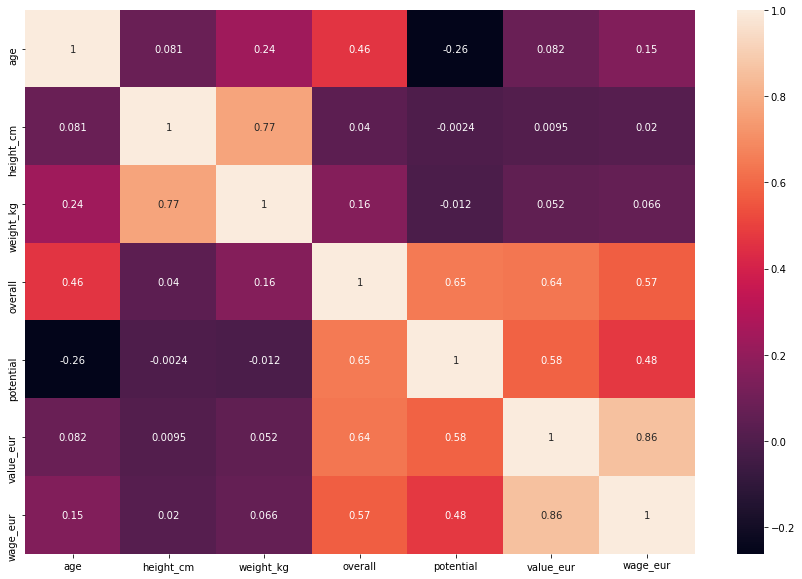

In [98]:
plt.figure(figsize=(15,10))
sns.heatmap(corr_mat.loc['age':'wage_eur', 'age':'wage_eur'], annot=True, cbar=True)

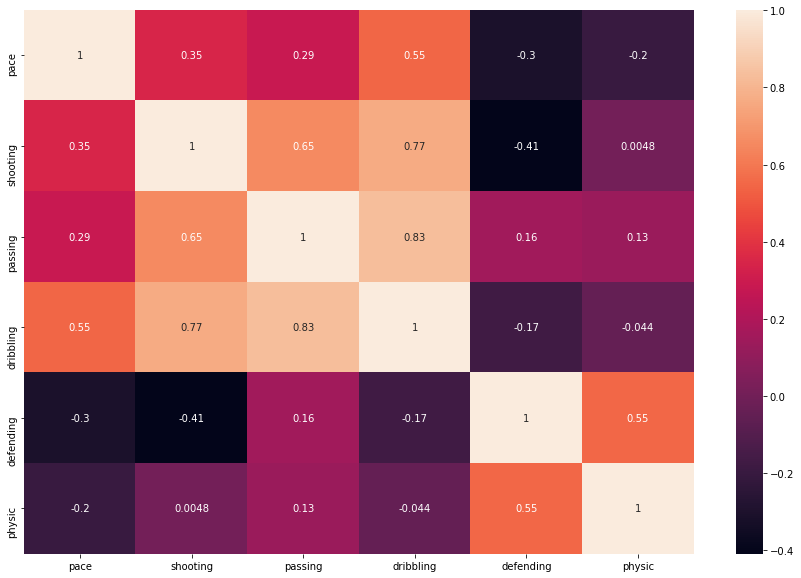

In [99]:
plt.figure(figsize=(15,10))
sns.heatmap(corr_mat.loc['pace':'physic', 'pace':'physic'], annot=True, cbar=True)

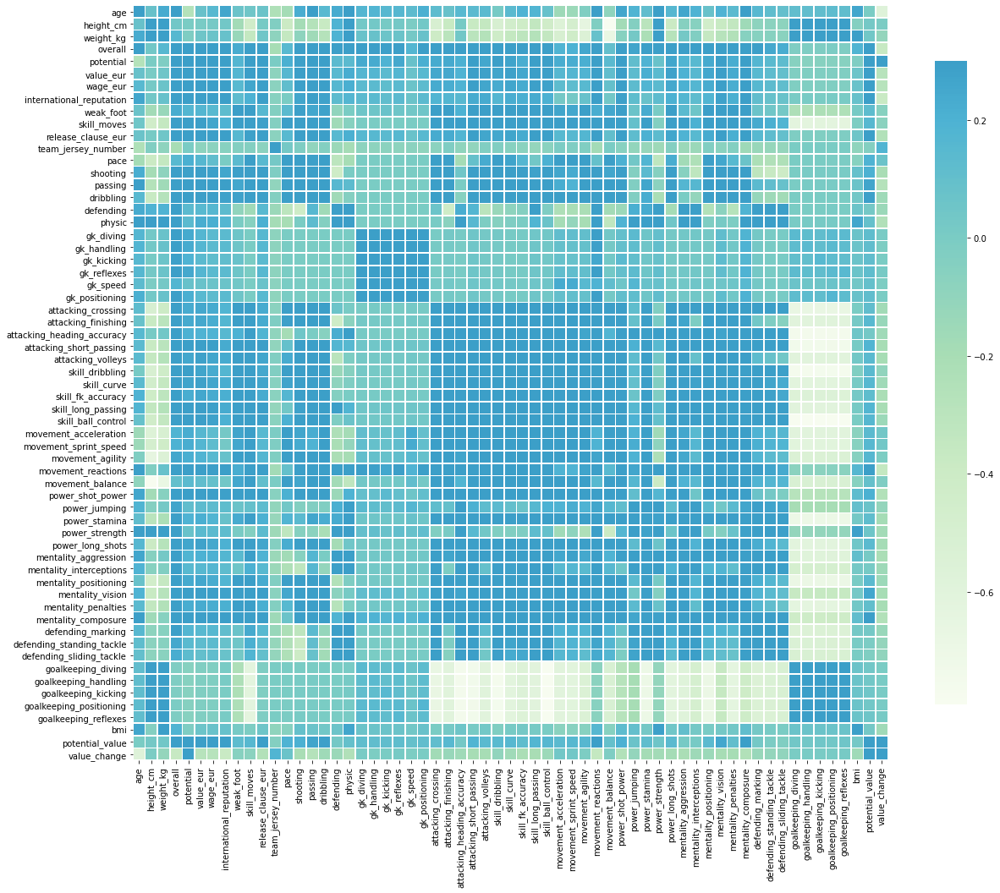

In [100]:
plt.figure(figsize=(20, 20))
mask = np.zeros_like(corr_mat, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr_mat, cmap="GnBu", vmax=.3, center=0, square=True, linewidths=.7, cbar_kws={"shrink": .7})

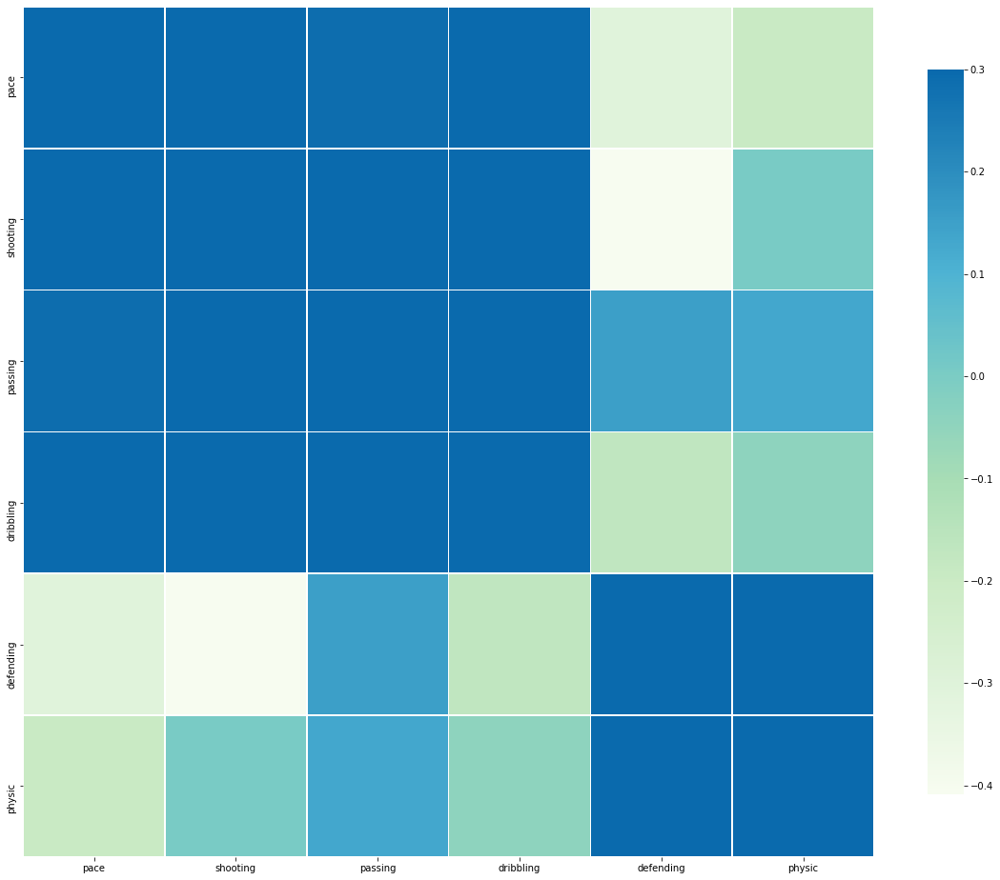

In [101]:
plt.figure(figsize=(20, 20))
mask = np.zeros_like(corr_mat.loc['pace':'physic', 'pace':'physic'], dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr_mat.loc['pace':'physic', 'pace':'physic'], cmap="GnBu", vmax=.3, center=0, square=True, linewidths=.7, cbar_kws={"shrink": .7})

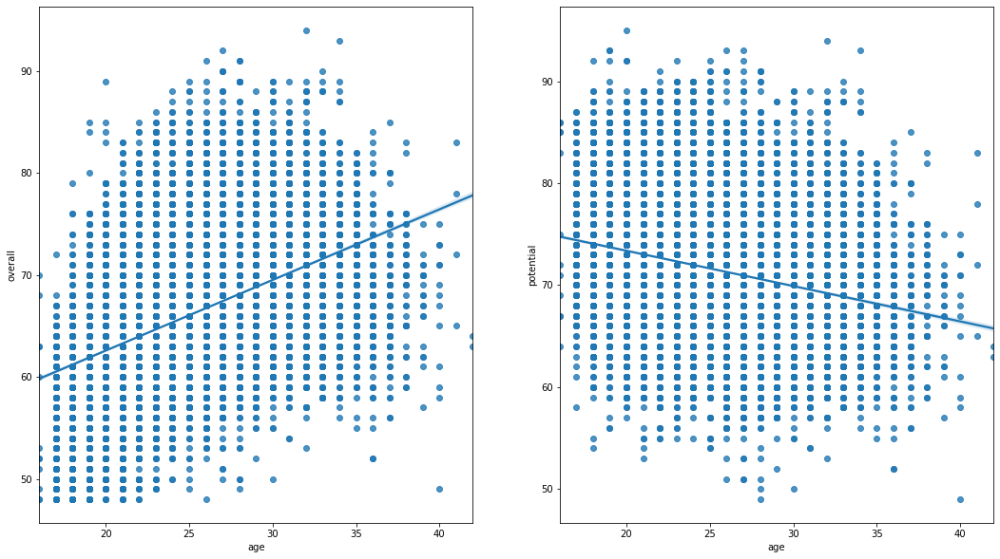

In [102]:
fig, ax = plt.subplots(ncols=2, figsize=(18, 10))
sns.regplot(x = df_20['age'], y = df_20['overall'], ax=ax[0])
sns.regplot(x = df_20['age'], y = df_20['potential'], ax=ax[1])

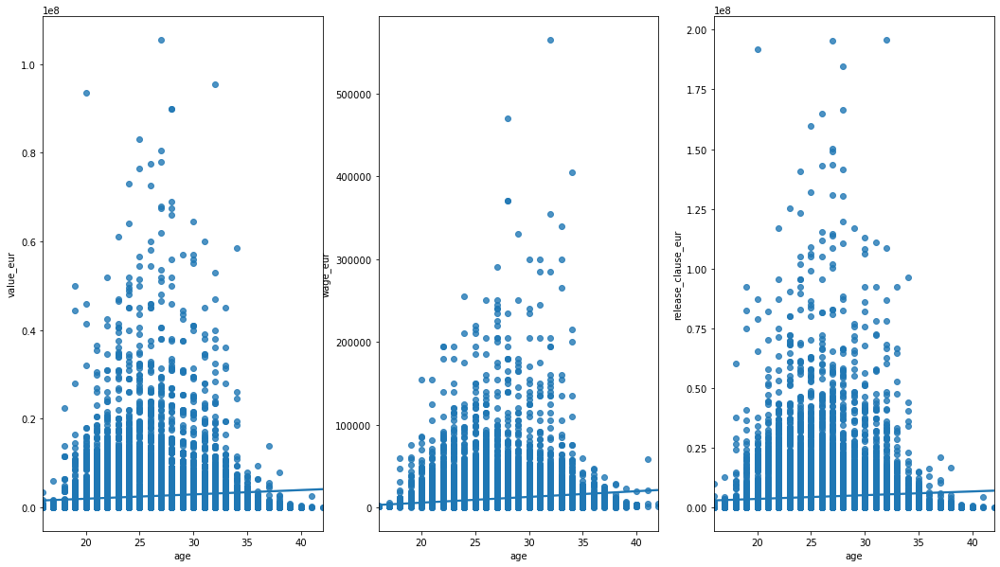

In [103]:
fig, ax = plt.subplots(ncols=3, figsize=(18, 10))
sns.regplot(x = df_20['age'], y = df_20['value_eur'], ax=ax[0])
sns.regplot(x = df_20['age'], y = df_20['wage_eur'], ax=ax[1])
sns.regplot(x = df_20['age'], y = df_20['release_clause_eur'], ax=ax[2])

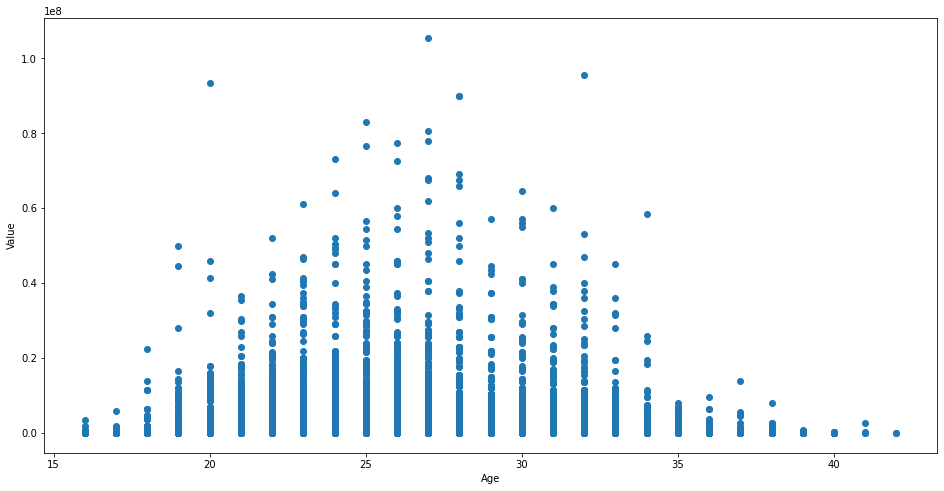

In [104]:
fig, ax = plt.subplots(figsize=(16, 8))
ax.scatter(df_20['age'], df_20['value_eur'])
ax.set_xlabel("Age")
ax.set_ylabel("Value")
plt.show()

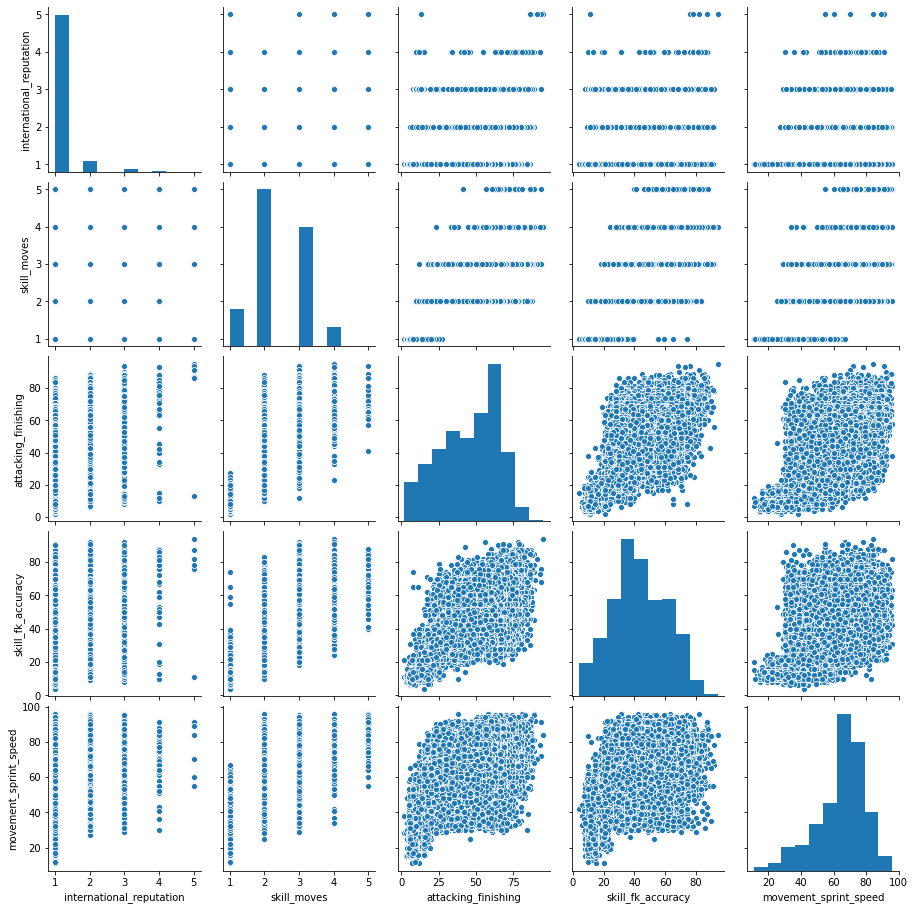

In [105]:
sns.pairplot(df_20[["international_reputation","skill_moves", "attacking_finishing", "skill_fk_accuracy", "movement_sprint_speed"]], palette="deep")

In [106]:
df_20.sort_values(by="pace", ascending=False).head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
2167,Adama Traoré,23,1996-01-25,178,72,Spain,Wolverhampton Wanderers,74,82,8500000,56000,"RW, RWB",Right,1,2,4,High/Medium,Stocky,2e+07,"#Speedster, #Dribbler",SUB,37,Disclosed,2018-08-08,2e+03,96,60,61,84,31,75,65,63,62,66,38,63,"Injury Prone, Injury Free, Selfish, Early Crosser",71,58,40,64,52,89,65,42,52,80,97,96,84,62,87,74,73,73,81,55,62,29,60,57,47,70,25,36,33,13,9,11,12,7,67+2,67+2,67+2,73+2,70+2,70+2,70+2,73+2,69+2,69+2,69+2,73+2,62+2,62+2,62+2,73+2,58+2,51+2,51+2,51+2,58+2,54+2,46+2,46+2,46+2,54+2,22,2e+07,1e+07
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,2e+08,"#Speedster, #Dribbler, #Acrobat",RW,7,Disclosed,2018-07-01,2e+03,96,84,78,90,39,75,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23,NaN,NaN
6495,K. Nagai,30,1989-03-05,178,71,Japan,FC Tokyo,69,69,1000000,6000,"ST, LM, LW",Right,1,4,2,High/Low,Normal,1e+06,#Speedster,LS,11,Disclosed,2017-01-01,2e+03,95,64,60,67,41,74,65,63,62,66,38,63,"Argues with Officials, Early Crosser",59,63,65,61,60,67,61,54,58,61,95,95,82,70,68,68,81,94,69,61,61,40,67,62,62,67,50,28,29,7,12,12,16,11,67+2,67+2,67+2,68+2,67+2,67+2,67+2,68+2,66+2,66+2,66+2,68+2,61+2,61+2,61+2,68+2,58+2,54+2,54+2,54+2,58+2,56+2,50+2,50+2,50+2,56+2,22,NaN,NaN
55,L. Sané,23,1996-01-11,183,75,Germany,Manchester City,86,92,61000000,195000,LW,Left,2,3,4,High/Medium,Lean,1e+08,"#Speedster, #Dribbler, #Acrobat",SUB,19,Disclosed,2016-08-02,2e+03,95,81,79,86,38,70,65,63,62,66,38,63,"Long Throw-in, Selfish, Early Crosser",83,81,72,80,85,88,83,82,64,85,93,96,86,81,80,87,64,78,70,78,61,34,84,82,71,80,36,32,35,8,12,9,9,14,82+2,82+2,82+2,84+2,84+2,84+2,84+2,84+2,83+2,83+2,83+2,83+2,74+2,74+2,74+2,83+2,65+2,59+2,59+2,59+2,65+2,61+2,52+2,52+2,52+2,61+2,22,1e+08,4e+07
9065,A. Chalá,23,1996-05-09,178,71,Ecuador,Deportivo Toluca,66,73,800000,5000,"LB, LM",Left,1,3,2,High/Medium,Lean,2e+06,#Speedster,LWB,6,Disclosed,2019-07-01,2e+03,95,46,54,57,63,65,65,63,62,66,38,63,Early Crosser,59,38,56,54,36,54,49,31,51,55,93,96,70,58,66,61,67,75,59,42,68,59,66,58,54,60,67,65,62,6,13,10,8,7,57+2,57+2,57+2,59+2,58+2,58+2,58+2,59+2,57+2,57+2,57+2,61+2,56+2,56+2,56+2,61+2,64+2,59+2,59+2,59+2,64+2,65+2,62+2,62+2,62+2,65+2,22,NaN,NaN
256,Gelson Martins,24,1995-05-11,173,74,Portugal,AS Monaco,82,86,29000000,47000,"RM, RW",Right,3,3,5,High/Medium,Lean,6e+07,"#Speedster, #Dribbler, #Acrobat",RM,11,Disclosed,2019-07-01,2e+03,95,71,74,86,47,61,65,63,62,66,38,63,"Selfish, Early Crosser, Speed Dribbler (CPU AI...",80,70,51,76,74,87,82,60

In [107]:
df_20[df_20["international_reputation"]==5].head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,1958,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2e+03,87,92,92,96,39,66,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24,1e+08,0e+00
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,965,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,Disclosed,2018-07-10,2e+03,90,93,82,89,35,78,65,63,62,66,38,63,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23,6e+07,0e+00
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,1952,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10,Disclosed,2017-08-03,2e+03,91,85,87,95,32,58,65,63,62,66,38,63,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22,1e+08,0e+00
19,L. Suárez,32,1987-01-24,182,86,Uruguay,FC Barcelona,89,89,53000000,355000,ST,Right,5,4,3,High/Medium,Normal,1087,"#Distance Shooter, #Strength, #Clinical Finish...",ST,9,Disclosed,2014-07-11,2e+03,73,89,80,84,51,84,65,63,62,66,38,63,"Diver, Speed Dribbler (CPU AI Only)",78,91,83,82,90,85,86,82,72,84,76,70,79,92,79,88,69,82,86,86,87,41,92,82,83,85,57,45,38,27,25,31,33,37,86+5,86+5,86+5,83+5,85+5,85+5,85+5,83+5,84+5,84+5,84+5,82+5,79+5,79+5,79+5,82+5,67+5,67+5,67+5,67+5,67+5,64+5,63+5,63+5,63+5,64+5,25,6e+07,7e+06
31,M. Neuer,33,1986-03-27,193,92,Germany,FC Bayern München,88,88,32000000,155000,GK,Right,5,4,1,Medium/Medium,Normal,528,#Team Player,GK,1,Disclosed,2011-07-01,2e+03,68,52,57,63,52,65,87,87,91,87,57,85,"Power Free-Kick, Flair, Swerve Pass, Acrobatic...",15,13,25,55,11,30,14,11,59,46,54,60,51,84,35,68,77,43,80,16,29,30,12,70,47,70,17,10,11,87,87,91,85,87,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,24,5e+07,2e+07
96,Z. Ibrahimović,37,1981-10-03,195,95,Sweden,LA Galaxy,85,85,14000000,15000,ST,Right,5,4,5,Medium/Low,Normal,210,"#Poacher, #Aerial Threat, #Distance Shooter, #...",ST,9,Disclosed,2

In [108]:
top_speed = df_20.sort_values(by=['movement_sprint_speed'], ascending=False)
free_kick = df_20.sort_values(by=['skill_fk_accuracy'], ascending=False)
skill_moves = df_20.sort_values(by=['skill_moves'], ascending=False)
finishing = df_20.sort_values(by=['attacking_finishing'], ascending=False)

In [109]:
top_speed.head()

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,High/Low,Normal,1917,"#Speedster, #Dribbler, #Acrobat",RW,7,Disclosed,2018-07-01,2e+03,96,84,78,90,39,75,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86+3,86+3,86+3,87+3,87+3,87+3,87+3,87+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,66+3,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23,NaN,NaN
2167,Adama Traoré,23,1996-01-25,178,72,Spain,Wolverhampton Wanderers,74,82,8500000,56000,"RW, RWB",Right,1,2,4,High/Medium,Stocky,179,"#Speedster, #Dribbler",SUB,37,Disclosed,2018-08-08,2e+03,96,60,61,84,31,75,65,63,62,66,38,63,"Injury Prone, Injury Free, Selfish, Early Crosser",71,58,40,64,52,89,65,42,52,80,97,96,84,62,87,74,73,73,81,55,62,29,60,57,47,70,25,36,33,13,9,11,12,7,67+2,67+2,67+2,73+2,70+2,70+2,70+2,73+2,69+2,69+2,69+2,73+2,62+2,62+2,62+2,73+2,58+2,51+2,51+2,51+2,58+2,54+2,46+2,46+2,46+2,54+2,22,2e+07,1e+07
9065,A. Chalá,23,1996-05-09,178,71,Ecuador,Deportivo Toluca,66,73,800000,5000,"LB, LM",Left,1,3,2,High/Medium,Lean,15,#Speedster,LWB,6,Disclosed,2019-07-01,2e+03,95,46,54,57,63,65,65,63,62,66,38,63,Early Crosser,59,38,56,54,36,54,49,31,51,55,93,96,70,58,66,61,67,75,59,42,68,59,66,58,54,60,67,65,62,6,13,10,8,7,57+2,57+2,57+2,59+2,58+2,58+2,58+2,59+2,57+2,57+2,57+2,61+2,56+2,56+2,56+2,61+2,64+2,59+2,59+2,59+2,64+2,65+2,62+2,62+2,62+2,65+2,22,NaN,NaN
55,L. Sané,23,1996-01-11,183,75,Germany,Manchester City,86,92,61000000,195000,LW,Left,2,3,4,High/Medium,Lean,1251,"#Speedster, #Dribbler, #Acrobat",SUB,19,Disclosed,2016-08-02,2e+03,95,81,79,86,38,70,65,63,62,66,38,63,"Long Throw-in, Selfish, Early Crosser",83,81,72,80,85,88,83,82,64,85,93,96,86,81,80,87,64,78,70,78,61,34,84,82,71,80,36,32,35,8,12,9,9,14,82+2,82+2,82+2,84+2,84+2,84+2,84+2,84+2,83+2,83+2,83+2,83+2,74+2,74+2,74+2,83+2,65+2,59+2,59+2,59+2,65+2,61+2,52+2,52+2,52+2,61+2,22,1e+08,4e+07
1083,I. Bebou,25,1994-04-23,183,72,Togo,TSG 1899 Hoffenheim,77,80,11000000,36000,"RW, ST, LW",Right,1,3,4,Medium/Medium,Lean,195,#Speedster,RS,9,Disclosed,2019-07-01,2e+03,93,70,66,81,33,64,65,63,62,66,38,63,Early Crosser,68,74,55,73,63,83,63,46,53,78,91,95,83,73,75,66,69,78,64,64,43,31,74,68,67,66,26,35,33,10,11,12,11,11,72+2,72+2,72+2,77+2,75+2,75+2,75+2,77+2,74+2,74+2,74+2,76+2,67+2,67+2,67+2,76+2,59+2,53+2,53+2,53+2,59+2,56+2,46+2,46+2,46+2,56+2,21,1e+07,3e+06


In [110]:
free_kick.head()

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,2e+08,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2e+03,87,92,92,96,39,66,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24,1e+08,0e+00
393,S. Giovinco,32,1987-01-26,163,61,Italy,Al Hilal,81,81,14000000,56000,"CF, ST, RM",Right,2,4,4,High/Medium,Normal,2e+07,"#Dribbler, #FK Specialist, #Acrobat",RS,9,Disclosed,2019-01-31,2e+03,81,79,79,87,27,56,65,63,62,66,38,63,"Selfish, Argues with Officials, Finesse Shot, ...",72,78,34,80,75,86,90,92,76,86,84,78,94,83,93,80,34,75,42,81,75,26,83,78,73,82,23,29,28,6,3,6,3,3,74+2,74+2,74+2,81+2,81+2,81+2,81+2,81+2,82+2,82+2,82+2,80+2,75+2,75+2,75+2,80+2,59+2,56+2,56+2,56+2,59+2,53+2,41+2,41+2,41+2,53+2,22,2e+07,2e+06
65,M. Pjanić,29,1990-04-02,178,72,Bosnia Herzegovina,Juventus,86,86,42500000,180000,"CM, CDM",Right,3,4,3,Medium/Medium,Normal,7e+07,"#Dribbler, #Playmaker , #FK Specialist, #Comp...",CDM,5,Disclosed,2016-07-01,2e+03,68,68,87,85,75,67,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Fine...",80,56,60,91,72,86,86,92,87,89,69,67,75,84,81,78,60,79,61,82,70,78,68,88,79,86,78,76,70,7,7,13,7,8,71+3,71+3,71+3,78+3,78+3,78+3,78+3,78+3,81+3,81+3,81+3,80+3,84+3,84+3,84+3,80+3,79+3,80+3,80+3,80+3,79+3,77+3,73+3,73+3,73+3,77+3,22,5e+07,3e+06
1612,A. Zamorado,38,1980-12-17,182,78,Ecuador,Ecuador,76,76,0,0,LM,Left,2,3,3,Medium/Low,Lean,0e+00,"#Distance Shooter, #FK Specialist",Not Decided,0,Disclosed,Disclosed,Disclosed,57,78,81,77,36,59,65,63,62,66,38,63,"Dives Into Tackles (CPU AI Only), Leadership, ...",80,68,41,80,81,74,86,91,79,85,59,55,72,76,72,86,77,74,58,89,38,55,76,80,86,70,40,26,15,6,11,8,6,10,70+2,70+2,70+2,75+2,75+2,75+2,75+2,75+2,77+2,77+2,77+2,75+2,75+2,75+2,75+2,75+2,59+2,59+2,59+2,59+2,59+2,53+2,45+2,45+2,45+2,53+2,23,NaN,NaN
779,E. Bardhi,23,1995-07-02,172,64,FYR Macedonia,Levante UD,78,84,14000000,23000,"CM, LM, CAM",Right,1,4,4,Medium/Medium,Normal,3e+07,#FK Specialist,LCM,10,Disclosed,2017-07-17,2e+03,72,81,78,80,63,56,65,63,62,66,38,63,"Argues with Officials, Speed Dribbler (CPU AI ...",78,79,52,78,81,79,89,91,75,82,75,69,78,80,86,85,45,76,44,84,62,66,75,75,78,80,63,65,63,12,13,8,12,6,74+2,74+2,74+2,78+2,77+2,77+2,77+2,78+2,78+2,78+2,78+2,77+2,76+2,76+2,76+2,77+2,72+2,70+2,70+2,70+2,72+2,70+2,62+2,62+2,62+2,70+2,21,3e+07,2e+07


In [111]:
skill_moves.head()

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
256,Gelson Martins,24,1995-05-11,173,74,Portugal,AS Monaco,82,86,29000000,47000,"RM, RW",Right,3,3,5,High/Medium,Lean,573,"#Speedster, #Dribbler, #Acrobat",RM,11,Disclosed,2019-07-01,2e+03,95,71,74,86,47,61,65,63,62,66,38,63,"Selfish, Early Crosser, Speed Dribbler (CPU AI...",80,70,51,76,74,87,82,60,55,81,95,95,95,81,92,72,65,86,48,69,60,43,79,78,66,82,54,46,36,12,9,7,6,9,74+3,74+3,74+3,81+3,79+3,79+3,79+3,81+3,79+3,79+3,79+3,80+3,72+3,72+3,72+3,80+3,68+3,61+3,61+3,61+3,68+3,64+3,53+3,53+3,53+3,64+3,24,5e+07,2e+07
568,Vinícius Jr.,18,2000-07-12,176,73,Brazil,Real Madrid,79,92,22500000,60000,LW,Right,2,4,5,High/Medium,Lean,602,"#Speedster, #Dribbler, #Acrobat",RW,28,Disclosed,2018-07-12,2e+03,93,70,71,85,29,63,65,63,62,66,38,63,"Selfish, Early Crosser, Speed Dribbler (CPU AI...",71,68,50,73,70,86,77,62,67,82,92,94,93,77,83,74,75,79,60,68,48,26,76,73,65,77,32,25,18,5,7,7,7,10,73+2,73+2,73+2,79+2,77+2,77+2,77+2,79+2,77+2,77+2,77+2,78+2,70+2,70+2,70+2,78+2,58+2,53+2,53+2,53+2,58+2,53+2,43+2,43+2,43+2,53+2,23,1e+08,8e+07
154,R. Mahrez,28,1991-02-21,179,67,Algeria,Manchester City,84,84,31500000,195000,"RW, RM",Left,3,4,5,Medium/Medium,Lean,583,"#Dribbler, #Acrobat",SUB,26,Disclosed,2018-07-10,2e+03,84,78,79,89,38,59,65,63,62,66,38,63,"Injury Free, Beat Offside Trap, Selfish, Argue...",81,77,48,78,76,90,84,78,75,90,87,82,92,77,87,79,60,76,54,80,48,39,79,81,70,84,45,31,22,15,9,13,11,6,76+3,76+3,76+3,83+3,81+3,81+3,81+3,83+3,82+3,82+3,82+3,82+3,76+3,76+3,76+3,82+3,63+3,59+3,59+3,59+3,63+3,58+3,47+3,47+3,47+3,58+3,20,3e+07,-1e+06
1931,M. Fernández,33,1986-05-15,178,72,Chile,Junior FC,75,75,3900000,5000,"CM, CAM",Right,2,4,5,Medium/Medium,Lean,55,#Team Player,RES,18,Disclosed,2019-02-11,2e+03,70,69,77,78,58,62,65,63,62,66,38,63,"Selfish, Argues with Officials, Crowd Favourite",75,61,50,78,70,78,80,82,76,80,72,69,76,71,74,78,69,63,65,75,50,60,70,78,72,76,58,60,56,11,8,5,10,11,69+2,69+2,69+2,73+2,73+2,73+2,73+2,73+2,75+2,75+2,75+2,74+2,73+2,73+2,73+2,74+2,67+2,67+2,67+2,67+2,67+2,65+2,60+2,60+2,60+2,65+2,22,NaN,NaN
369,Quaresma,35,1983-09-26,175,67,Portugal,Beşiktaş JK,81,81,8000000,59000,"RM, LM",Right,3,4,5,High/Low,Normal,152,"#Dribbler, #Crosser",RM,7,Disclosed,2015-07-22,2e+03,77,73,82,86,24,63,65,63,62,66,38,63,"Injury Free, Selfish, Argues with Officials, S...",91,67,41,79,80,87,94,71,75,86,77,77,86,75,84,79,63,62,59,79,74,24,78,84,73,82,29,17,11,12,14,10,5,15,72+3,72+3,72+3,81+3,78+3,78+3,78+3,81+3,80+3,80+3,80+3,80+3,73+3,73+3,73+3,80+3,56+3,54+3,54+3,54+3,56+3,50+3,40+3,40+3,40+3,50+3,21,2e+07,8e+06


In [112]:
finishing.head()

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,1958,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2e+03,87,92,92,96,39,66,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24,1e+08,0e+00
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,965,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,Disclosed,2018-07-10,2e+03,90,93,82,89,35,78,65,63,62,66,38,63,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23,6e+07,0e+00
12,H. Kane,25,1993-07-28,188,89,England,Tottenham Hotspur,89,91,83000000,220000,ST,Right,3,4,3,High/High,Normal,1598,"#Engine, #Distance Shooter, #Clinical Finisher",ST,10,Disclosed,2010-07-01,2e+03,70,91,79,81,47,83,65,63,62,66,38,63,"Injury Free, Avoids Using Weaker Foot, Argues ...",75,94,86,81,85,80,78,68,83,84,68,72,71,91,73,90,79,87,84,86,78,35,93,81,90,91,56,36,38,8,10,11,14,11,86+3,86+3,86+3,82+3,84+3,84+3,84+3,82+3,83+3,83+3,83+3,82+3,79+3,79+3,79+3,82+3,65+3,66+3,66+3,66+3,65+3,62+3,60+3,60+3,60+3,62+3,25,9e+07,3e+06
17,S. Agüero,31,1988-06-02,173,70,Argentina,Manchester City,89,89,60000000,300000,ST,Right,4,4,4,High/Medium,Stocky,1110,"#Dribbler, #Clinical Finisher, #Complete Forward",ST,10,Disclosed,2011-07-28,2e+03,80,90,77,88,33,74,65,63,62,66,38,63,"Avoids Using Weaker Foot, Outside Foot Shot",70,93,78,83,85,88,83,73,64,89,82,78,84,92,91,89,81,79,74,84,65,24,93,83,83,90,30,29,24,13,15,6,11,14,87+3,87+3,87+3,85+3,87+3,87+3,87+3,85+3,85+3,85+3,85+3,83+3,77+3,77+3,77+3,83+3,60+3,58+3,58+3,58+3,60+3,56+3,50+3,50+3,50+3,56+3,23,6e+07,1e+05
19,L. Suárez,32,1987-01-24,182,86,Uruguay,FC Barcelona,89,89,53000000,355000,ST,Right,5,4,3,High/Medium,Normal,1087,"#Distance Shooter, #Strength, #Clinical Finish...",ST,9,Disclosed,2014-07-11,2e+03,73,89,80,84,51,84,65,63,62,66,38,63,"Diver, Speed Dribbler (CPU AI Only)",78,91,83,82,90,85,86,82,72,84,76,70,79,92,79,88,69,82,86,86,87,41,92,82,83,85,57,45,38,27,25,31,33,37,86+5,86+5,86+5,83+5,85+5,85+5,85+5,83+5,84+5,84+5,84+5,82+5,79+5,79+5,79+5,82+5,67+5,67+5,67+5,67+5,67+5,64+5,63+5,63+5,63+5,64+5,25,6e+07,7e+06


In [113]:
top_speed = top_speed.head(10)
free_kick = free_kick.head(10)
skill_moves = skill_moves.head(10)
finishing = finishing.head(10)

Text(0.5, 1.0, 'Fastest Players')

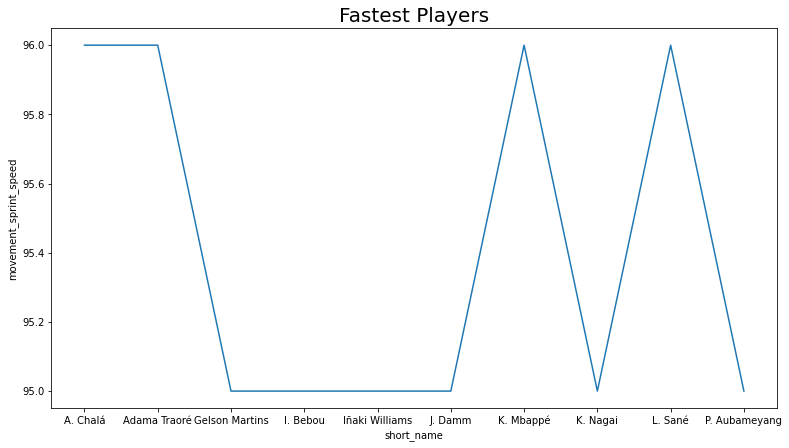

In [114]:
sns.lineplot(top_speed['short_name'], top_speed['movement_sprint_speed']).set_title("Fastest Players", fontsize=20)

Text(0.5, 1.0, 'Best Free Kick Takers')

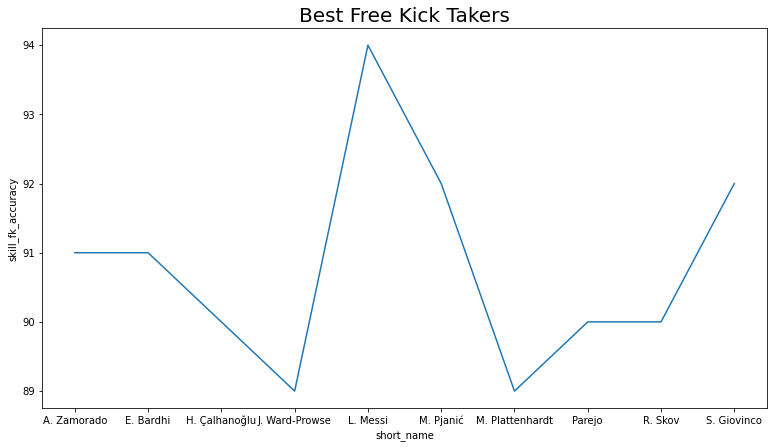

In [115]:
sns.lineplot(free_kick['short_name'], free_kick['skill_fk_accuracy']).set_title("Best Free Kick Takers", fontsize=20)

Text(0.5, 1.0, 'Best Skill Moves')

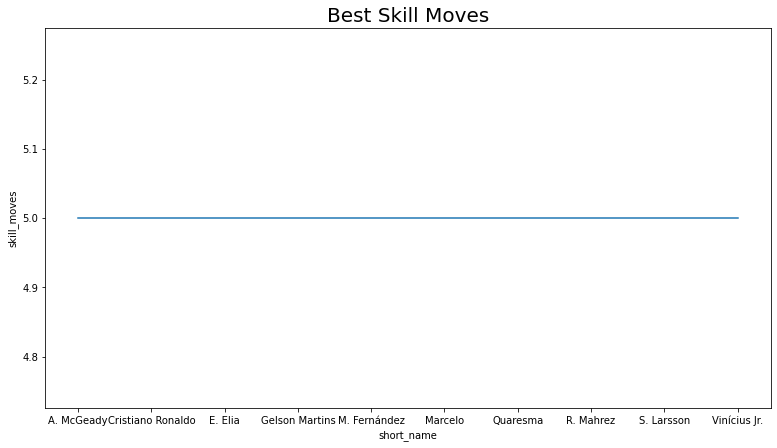

In [116]:
sns.lineplot(skill_moves['short_name'], skill_moves['skill_moves']).set_title("Best Skill Moves", fontsize=20)

Text(0.5, 1.0, 'Best Finishing')

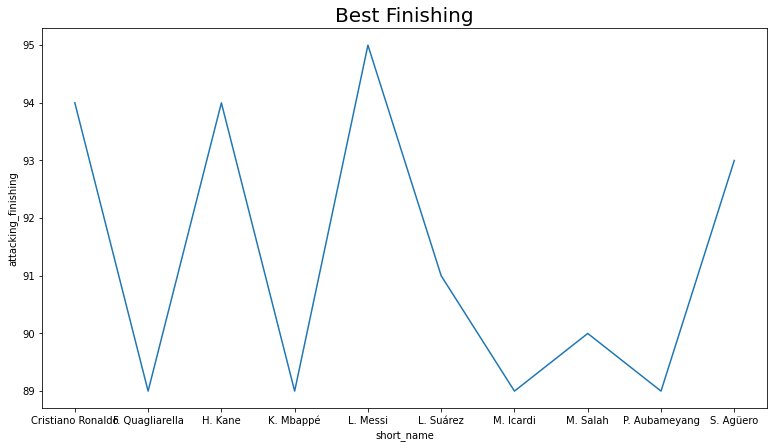

In [117]:
sns.lineplot(finishing['short_name'], finishing['attacking_finishing']).set_title("Best Finishing", fontsize=20)

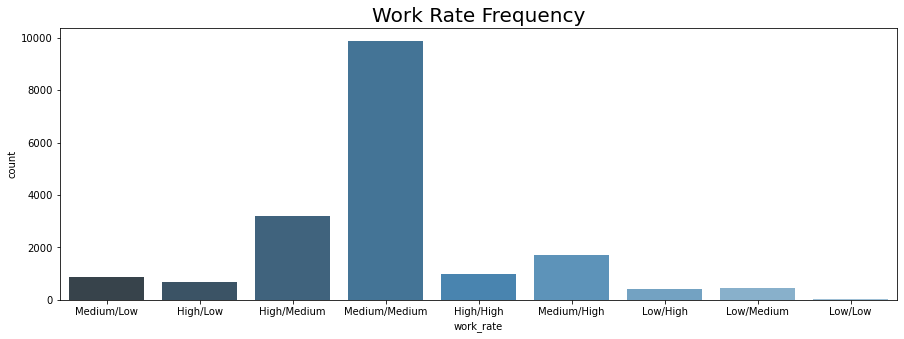

In [118]:
plt.rcParams['figure.figsize']=(15, 5)
sns.countplot(df_20['work_rate'], palette="Blues_d")
plt.title("Work Rate Frequency", fontsize=20)
plt.show()

Text(0.5, 1.0, 'Relationship between Age and Work Rate of Players')

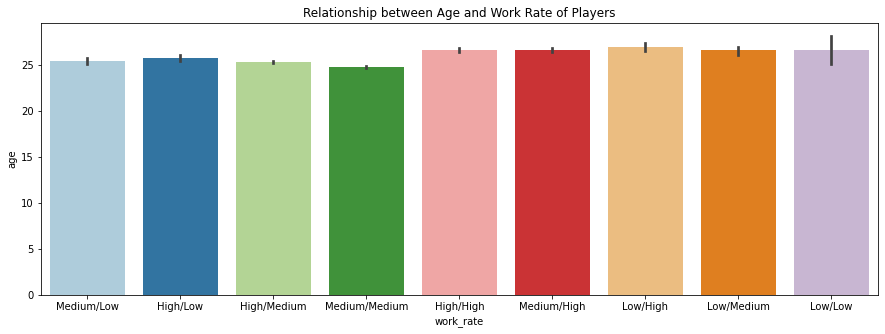

In [119]:
sns.barplot(df_20['work_rate'], df_20['age'], palette="Paired").set_title("Relationship between Age and Work Rate of Players")

In [120]:
rate = ['Medium/Low', 'High/Low', 'High/Medium', 'Medium/Medium', 'High/High', 'Medium/High', 'Low/High', 'Low/Medium', 'Low/Low']
data = df_20.query('work_rate in @rate')    
fig = px.pie(data, names='work_rate',
             color_discrete_sequence=px.colors.sequential.Plasma_r,
             title='Percentage of players in Various Work Rates')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

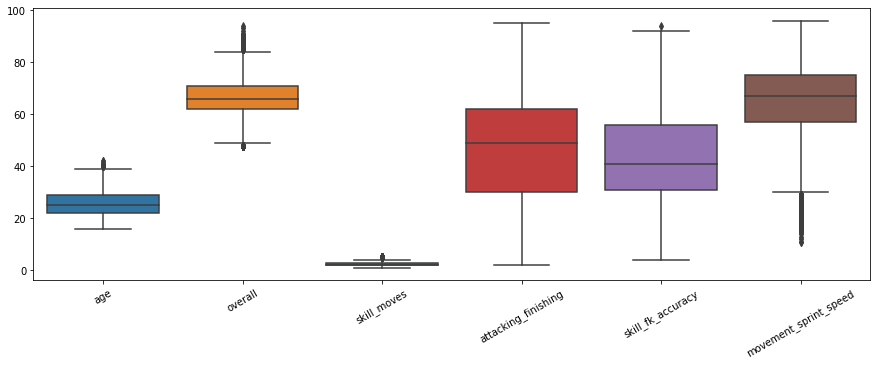

In [121]:
features = df_20[['age', 'overall', 'skill_moves', 'attacking_finishing', 'skill_fk_accuracy', 'movement_sprint_speed']]
ax = sns.boxplot(data=features)
plt.tick_params(axis='x', rotation=30)

In [122]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df_20['overall'],
    y = df_20['value_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=df_20['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= df_20['short_name'],
))

fig.update_layout(title='Overall Rating vs Value in Euros',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

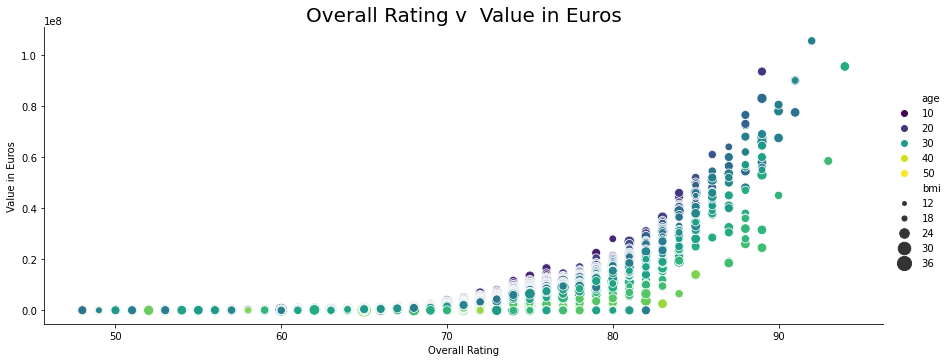

In [123]:
sns.relplot(x='overall',y='value_eur',hue='age',palette = 'viridis',size="bmi", sizes=(15, 200),aspect=2.5,data=df_20)
plt.title('Overall Rating v  Value in Euros',fontsize = 20)
plt.xlabel('Overall Rating')
plt.ylabel('Value in Euros')
plt.show()

In [124]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df_20['overall'],
    y = df_20['wage_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=df_20['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= df_20['short_name'],
))

fig.update_layout(title='Overall Rating vs Wage in Euros',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

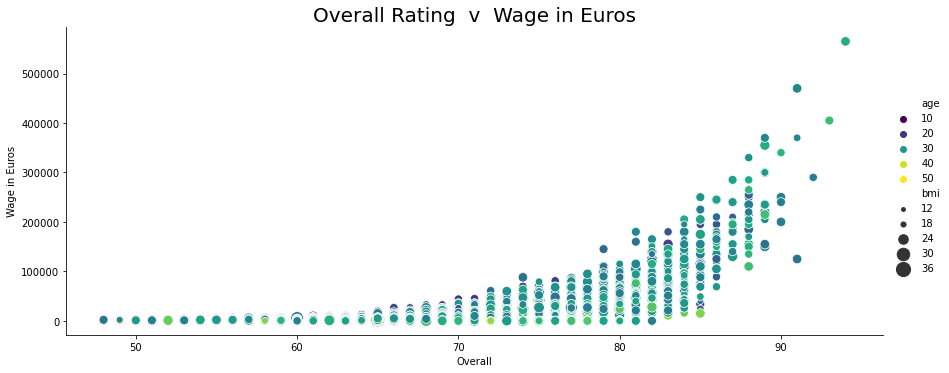

In [125]:
sns.relplot(x='overall',y='wage_eur',hue='age',palette = 'viridis',size="bmi", sizes=(15, 200),aspect=2.5,data=df_20)
plt.title('Overall Rating  v  Wage in Euros',fontsize = 20)
plt.xlabel('Overall')
plt.ylabel('Wage in Euros')
plt.show()

In [126]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df_20['overall'],
    y = df_20['bmi'],
    mode='markers',
    marker=dict(
        size=16,
        color=df_20['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= df_20['short_name'],
))

fig.update_layout(title='Overall Rating vs BMI',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

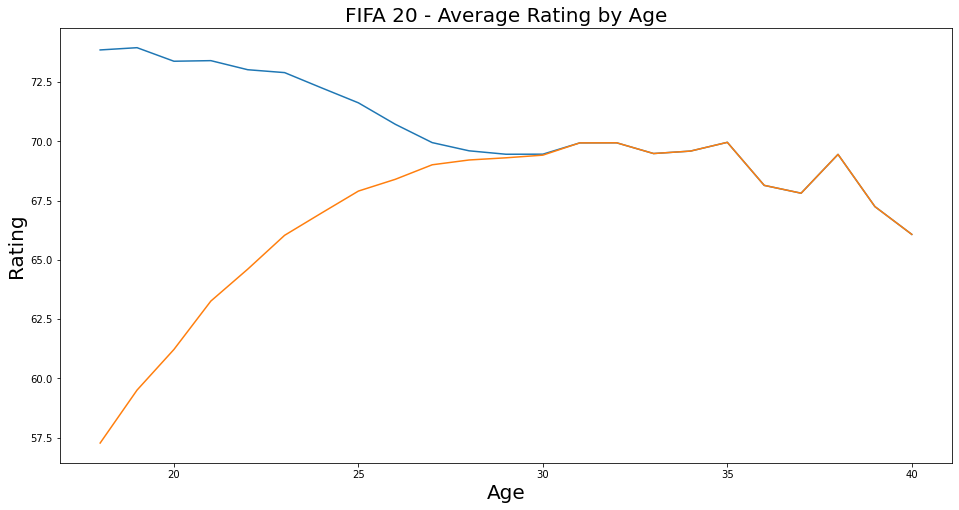

In [127]:
df_20_potential = df_20[(df_20.age.astype(int)>=18) & (df_20.age.astype(int)<=40)].groupby(['age'])['potential'].mean()
df_20_overall = df_20[(df_20.age.astype(int)>=18) & (df_20.age.astype(int)<=40)].groupby(['age'])['overall'].mean()
df_20_summary = pd.concat([df_20_potential, df_20_overall], axis=1)

fig, ax = plt.subplots(figsize=(16, 8))
ax.plot(df_20_summary)
ax.set_xlabel("Age", fontsize=20)
ax.set_ylabel("Rating", fontsize=20)
ax.set_title("FIFA 20 - Average Rating by Age", fontsize=20)
plt.show()

## Analyzing Various Football League Clubs

In [128]:
def club(x):
    return df_20[df_20['club']==x]

def teamValue(club):
    value = 0
    for i in range(len(club)):
        value += club.iloc[i]['value_eur']
    value = value/1000000
    return value

def teamWeeklyWage(club):
    wage = 0
    for i in range(len(club)):
        wage += club.iloc[i]['wage_eur']
    wage = wage/1000000
    return wage

def avgSquadAge(club):
    return round(club['age'].mean(), 1)

def avgOverallRating(club):
    return round(club['overall'].mean(), 1)

def avgPotential(club):
    return round(club['potential'].mean(), 1)

## Manchester United FC

In [129]:
MU = club('Manchester United')
MU.head()

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
14,De Gea,28,1990-11-07,192,82,Spain,Manchester United,89,90,56000000,205000,GK,Right,4,3,1,Medium/Medium,Lean,1106,#Team Player,GK,1,Disclosed,2011-07-01,2e+03,68,52,57,63,52,65,90,84,81,92,58,85,"Flair, Second Wind, Flair Passes",17,13,21,50,13,18,21,19,47,38,57,58,63,87,43,61,67,43,60,12,38,30,12,65,29,68,25,21,13,90,84,81,85,92,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,22,7e+07,1e+07
24,P. Pogba,26,1993-03-15,191,84,France,Manchester United,88,91,72500000,250000,"CM, CDM",Right,4,4,5,High/Medium,Normal,1432,"#Dribbler, #Playmaker , #Strength, #Complete ...",LDM,6,Disclosed,2016-08-09,2e+03,74,81,86,85,66,86,65,63,62,66,38,63,"Selfish, Leadership, Argues with Officials, Fi...",80,75,75,86,84,87,85,82,90,90,67,79,75,82,66,90,82,87,89,82,78,64,83,88,83,87,63,67,65,5,6,2,4,3,81+3,81+3,81+3,82+3,83+3,83+3,83+3,82+3,84+3,84+3,84+3,83+3,84+3,84+3,84+3,83+3,76+3,77+3,77+3,77+3,76+3,74+3,72+3,72+3,72+3,74+3,23,9e+07,1e+07
163,A. Martial,23,1995-12-05,184,76,France,Manchester United,83,88,34500000,140000,"LW, ST, LM",Right,3,3,4,Medium/Low,Normal,681,#Dribbler,ST,9,Disclosed,2015-09-01,2e+03,89,81,72,86,41,71,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Early Crosser, Cro...",72,82,69,78,74,87,84,54,60,86,88,89,84,80,79,84,70,75,74,77,58,42,82,73,81,79,34,39,36,9,8,8,15,11,81+3,81+3,81+3,82+3,82+3,82+3,82+3,82+3,80+3,80+3,80+3,80+3,73+3,73+3,73+3,80+3,64+3,59+3,59+3,59+3,64+3,60+3,54+3,54+3,54+3,60+3,22,5e+07,2e+07
171,M. Rashford,21,1997-10-31,186,70,England,Manchester United,83,88,35500000,125000,"ST, LM",Right,2,3,5,High/High,Lean,701,"#Speedster, #Engine, #Acrobat",LM,10,Disclosed,2014-07-01,2e+03,92,82,73,84,45,77,65,63,62,66,38,63,"Long Throw-in, Selfish, Argues with Officials,...",74,81,72,75,76,85,82,76,63,83,89,94,86,81,75,88,72,87,75,79,73,42,84,75,76,78,47,40,33,11,6,15,7,14,81+2,81+2,81+2,82+2,82+2,82+2,82+2,82+2,80+2,80+2,80+2,81+2,73+2,73+2,73+2,81+2,65+2,62+2,62+2,62+2,65+2,62+2,57+2,57+2,57+2,62+2,20,5e+07,2e+07
280,H. Maguire,26,1993-03-05,194,100,England,Manchester United,82,83,23000000,125000,CB,Right,1,3,2,High/High,Stocky,454,"#Aerial Threat, #Strength",LCB,5,Disclosed,2019-08-05,2e+03,50,53,64,69,81,84,65,63,62,66,38,63,"Diver, Leadership, Long Passer (CPU AI Only)",44,48,87,76,47,69,38,46,75,75,47,53,54,80,56,68,84,70,90,52,84,78,61,66,44,82,81,83,79,14,16,9,14,9,66+2,66+2,66+2,62+2,65+2,65+2,65+2,62+2,66+2,66+2,66+2,64+2,71+2,71+2,71+2,64+2,70+2,78+2,78+2,78+2,70+2,72+2,81+2,81+2,81+2,72+2,26,3e+07,3e+06


In [130]:
MU.shape

(33, 101)

In [131]:
MU = club("Manchester United")
print("Team Value of Manchester United is",teamValue(MU),"million Euros")
print("Manchester United spends", teamWeeklyWage(MU),"million Euros as per Week Wages")
print("Manchester United has average squad age of", avgSquadAge(MU), "years")
print("Manchester United has average overall rating of", avgOverallRating(MU))
print("Manchester United has average potential of", avgPotential(MU))

Team Value of Manchester United is 501.675 million Euros
Manchester United spends 2.874 million Euros as per Week Wages
Manchester United has average squad age of 24.8 years
Manchester United has average overall rating of 76.8
Manchester United has average potential of 82.5


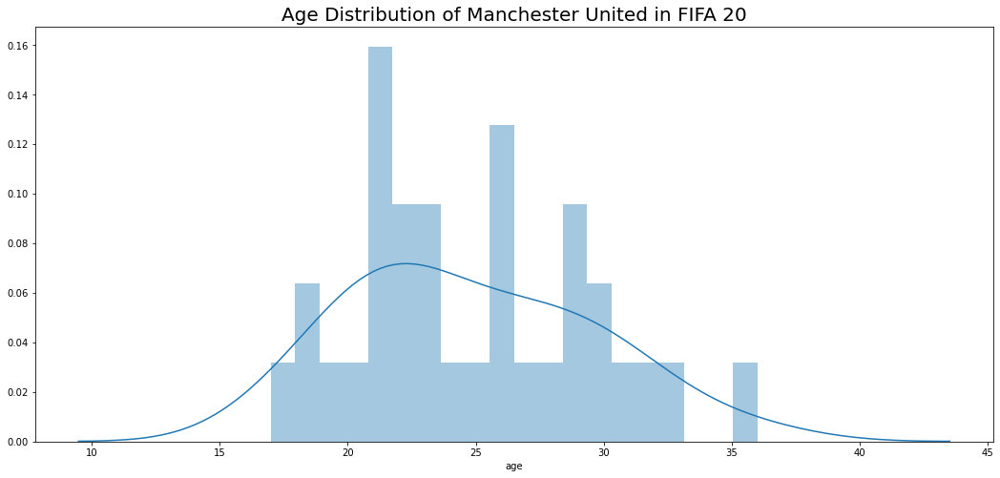

In [132]:
plt.figure(figsize=(18,8))
plt.title('Age Distribution of Manchester United in FIFA 20', fontsize=20)
sns.distplot(a=MU['age'], kde=True, bins=20)
plt.show()

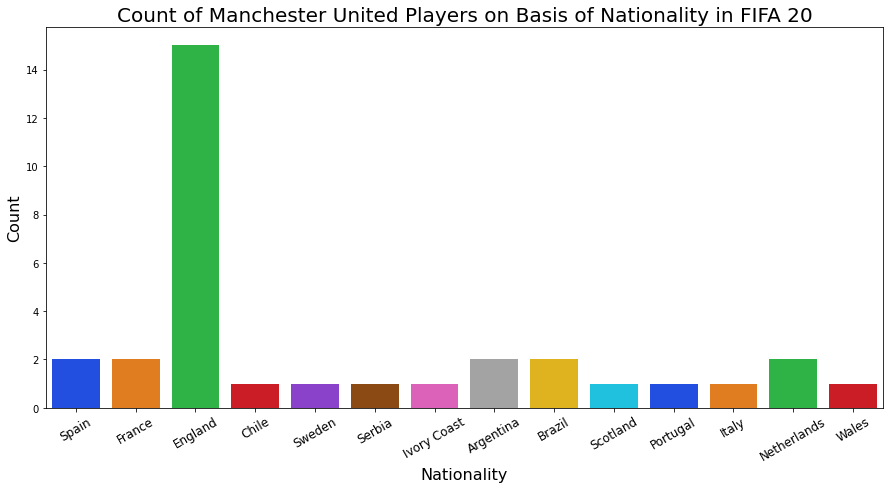

In [133]:
plt.figure(figsize= (15,7))

ax = sns.countplot(x='nationality', data=MU, palette='bright')
ax.set_title(label='Count of Manchester United Players on Basis of Nationality in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Nationality', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [134]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = MU['nationality'],
    y = MU['overall'],
    mode='markers',
    marker=dict(
        size=16,
        color=MU['overall'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= MU['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating in Manchester United',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

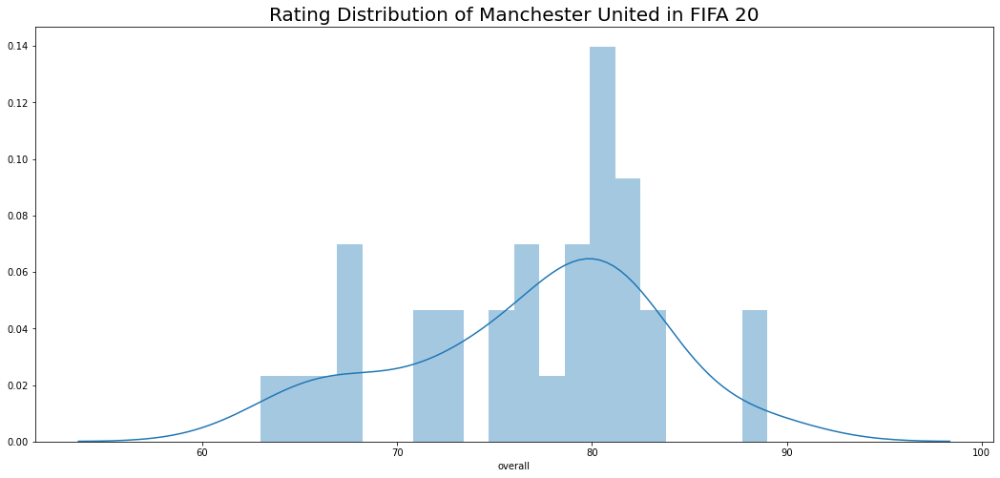

In [135]:
plt.figure(figsize=(18,8))
plt.title('Rating Distribution of Manchester United in FIFA 20', fontsize=20)
sns.distplot(a=MU['overall'], kde=True, bins=20)
plt.show()

In [136]:
MU_most_valuable = MU.sort_values(by="value_eur", ascending=False)
MU_most_valuable.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
24,P. Pogba,26,1993-03-15,191,84,France,Manchester United,88,91,72500000,250000,"CM, CDM",Right,4,4,5,High/Medium,Normal,1432,"#Dribbler, #Playmaker , #Strength, #Complete ...",LDM,6,Disclosed,2016-08-09,2e+03,74,81,86,85,66,86,65,63,62,66,38,63,"Selfish, Leadership, Argues with Officials, Fi...",80,75,75,86,84,87,85,82,90,90,67,79,75,82,66,90,82,87,89,82,78,64,83,88,83,87,63,67,65,5,6,2,4,3,81+3,81+3,81+3,82+3,83+3,83+3,83+3,82+3,84+3,84+3,84+3,83+3,84+3,84+3,84+3,83+3,76+3,77+3,77+3,77+3,76+3,74+3,72+3,72+3,72+3,74+3,23,9e+07,1e+07
14,De Gea,28,1990-11-07,192,82,Spain,Manchester United,89,90,56000000,205000,GK,Right,4,3,1,Medium/Medium,Lean,1106,#Team Player,GK,1,Disclosed,2011-07-01,2e+03,68,52,57,63,52,65,90,84,81,92,58,85,"Flair, Second Wind, Flair Passes",17,13,21,50,13,18,21,19,47,38,57,58,63,87,43,61,67,43,60,12,38,30,12,65,29,68,25,21,13,90,84,81,85,92,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,22,7e+07,1e+07
171,M. Rashford,21,1997-10-31,186,70,England,Manchester United,83,88,35500000,125000,"ST, LM",Right,2,3,5,High/High,Lean,701,"#Speedster, #Engine, #Acrobat",LM,10,Disclosed,2014-07-01,2e+03,92,82,73,84,45,77,65,63,62,66,38,63,"Long Throw-in, Selfish, Argues with Officials,...",74,81,72,75,76,85,82,76,63,83,89,94,86,81,75,88,72,87,75,79,73,42,84,75,76,78,47,40,33,11,6,15,7,14,81+2,81+2,81+2,82+2,82+2,82+2,82+2,82+2,80+2,80+2,80+2,81+2,73+2,73+2,73+2,81+2,65+2,62+2,62+2,62+2,65+2,62+2,57+2,57+2,57+2,62+2,20,5e+07,2e+07
163,A. Martial,23,1995-12-05,184,76,France,Manchester United,83,88,34500000,140000,"LW, ST, LM",Right,3,3,4,Medium/Low,Normal,681,#Dribbler,ST,9,Disclosed,2015-09-01,2e+03,89,81,72,86,41,71,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Early Crosser, Cro...",72,82,69,78,74,87,84,54,60,86,88,89,84,80,79,84,70,75,74,77,58,42,82,73,81,79,34,39,36,9,8,8,15,11,81+3,81+3,81+3,82+3,82+3,82+3,82+3,82+3,80+3,80+3,80+3,80+3,73+3,73+3,73+3,80+3,64+3,59+3,59+3,59+3,64+3,60+3,54+3,54+3,54+3,60+3,22,5e+07,2e+07
319,J. Lingard,26,1992-12-15,175,62,England,Manchester United,82,82,24000000,135000,"CAM, RW",Right,2,3,4,High/High,Lean,456,"#Engine, #Acrobat",CAM,14,Disclosed,2011-07-01,2e+03,80,78,76,83,58,72,65,63,62,66,38,63,"Selfish, Argues with Officials, Speed Dribbler...",74,77,67,80,75,82,79,68,63,84,82,79,86,83,84,81,70,89,62,78,74,54,84,81,74,82,63,57,49,14,10,8,13,9,78+2,78+2,78+2,80+2,81+2,81+2,81+2,80+2,80+2,80+2,80+2,80+2,77+2,77+2,77+2,80+2,71+2,68+2,68+2,68+2,71+2,68+2,63+2,63+2,63+2,68+2,20,2e+07,-3e+06
280,H. Maguire,26,1993-03-05,194,100,England,Manchester United,82,83,23000000,125000,CB,Right,1,3,2,High/High,Stocky,454,"#Aerial Threat, #Strength",LCB,5,Disclosed,2019-08-05,2e+03,50,53,64,69,81,84,65,63,62,66,38,63,"Diver, Leadership, Long Passer (CPU AI Only)",44,48,87,76,

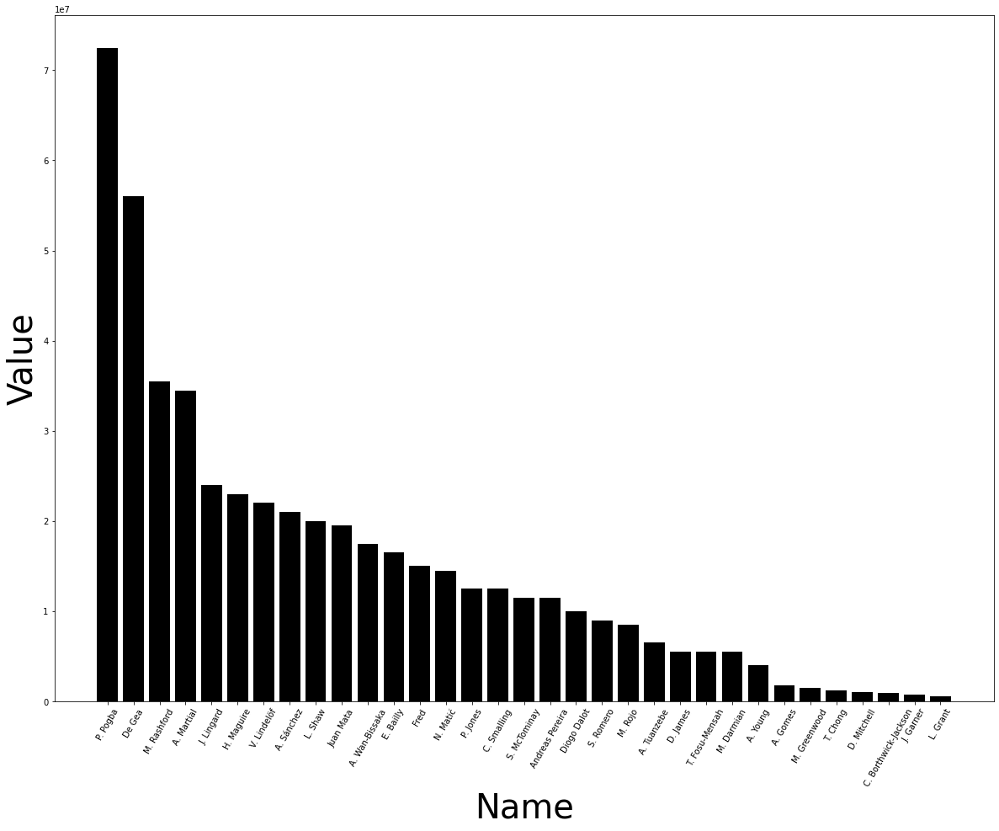

In [137]:
plt.figure(figsize=(20, 15))
plt.bar(MU_most_valuable['short_name'], MU_most_valuable['value_eur'], color="k")
plt.tick_params(axis='x', rotation=60)
plt.ylabel("Value", fontsize=40)
plt.xlabel("Name", fontsize=40)
plt.show()

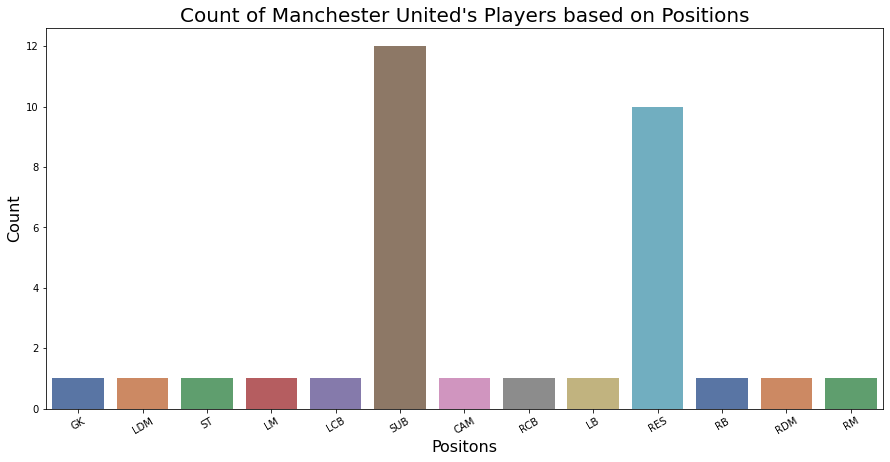

In [138]:
plt.figure(figsize=(15, 7))
ax = sns.countplot(x="team_position", data=MU, palette="deep")
ax.set_title("Count of Manchester United's Players based on Positions", fontsize=20)
ax.set_xlabel(xlabel="Positons", fontsize=16)
ax.set_ylabel(ylabel="Count", fontsize=16)
plt.xticks(rotation=30, fontsize=10)
plt.show()

In [139]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = MU['overall'],
    y = MU['value_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=MU['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= MU['short_name'],
))

fig.update_layout(title='Overall Rating vs Value in Euros for Manchester United',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

## Chelsea FC

In [140]:
CH = club("Chelsea")
print("Team Value of Chelsea is",teamValue(CH),"million Euros")
print("Chelsea spends", teamWeeklyWage(CH),"million Euros as per Week Wages")
print("Chelsea has average squad age of", avgSquadAge(CH), "years")
print("Chelsea has average overall rating of", avgOverallRating(CH))
print("Chelsea has average potential of", avgPotential(CH))

Team Value of Chelsea is 504.97 million Euros
Chelsea spends 2.806 million Euros as per Week Wages
Chelsea has average squad age of 24.8 years
Chelsea has average overall rating of 77.1
Chelsea has average potential of 82.4


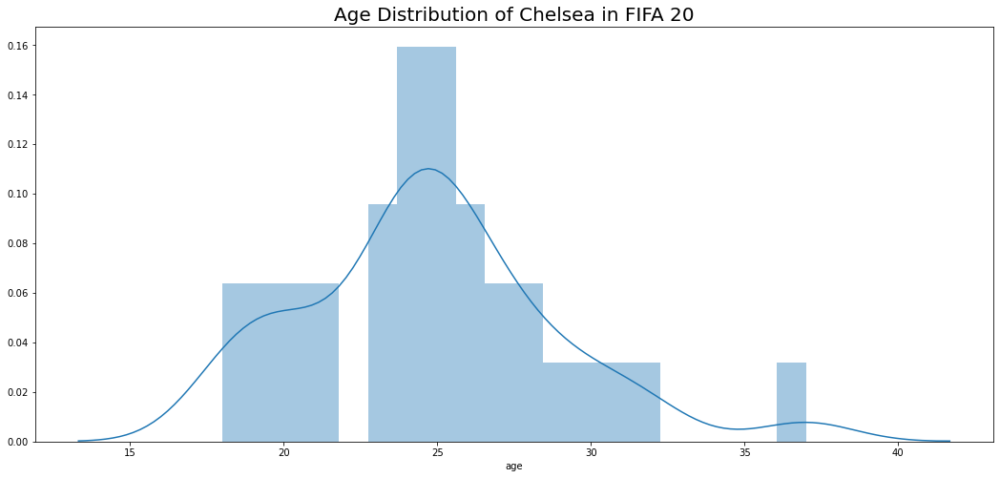

In [141]:
plt.figure(figsize=(18,8))
plt.title('Age Distribution of Chelsea in FIFA 20', fontsize=20)
sns.distplot(a=CH['age'], kde=True, bins=20)
plt.show()

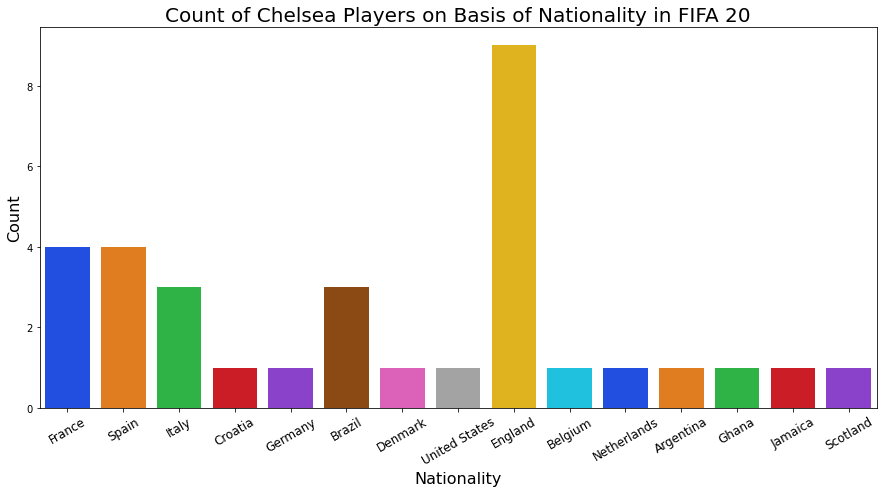

In [142]:
plt.figure(figsize= (15,7))

ax = sns.countplot(x='nationality', data=CH, palette='bright')
ax.set_title(label='Count of Chelsea Players on Basis of Nationality in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Nationality', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [143]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = CH['nationality'],
    y = CH['overall'],
    mode='markers',
    marker=dict(
        size=16,
        color=CH['overall'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= CH['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating in Chelsea',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

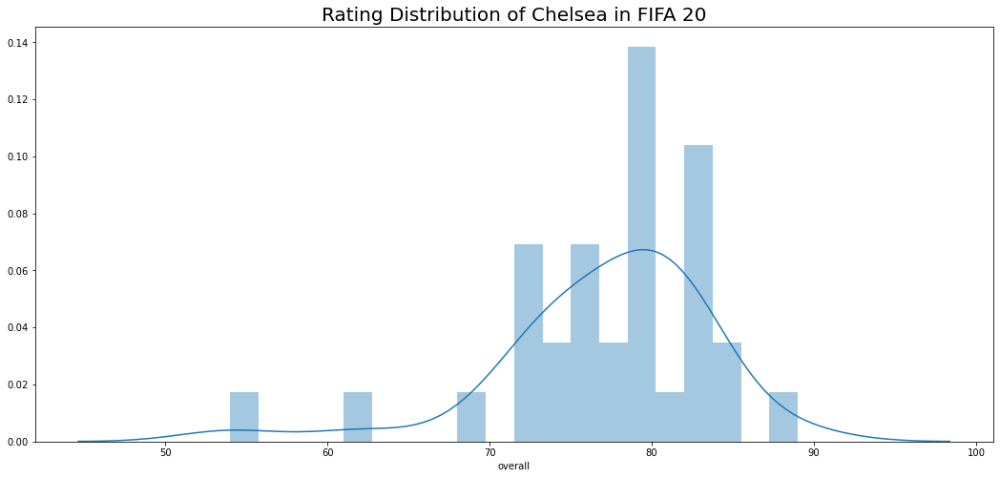

In [144]:
plt.figure(figsize=(18,8))
plt.title('Rating Distribution of Chelsea in FIFA 20', fontsize=20)
sns.distplot(a=CH['overall'], kde=True, bins=20)
plt.show()

In [145]:
CH_most_valuable = CH.sort_values(by="value_eur", ascending=False)
CH_most_valuable.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
15,N. Kanté,28,1991-03-29,168,72,France,Chelsea,89,90,66000000,235000,"CDM, CM",Right,3,3,2,Medium/High,Normal,1304,"#Tackling , #Tactician",RCM,7,Disclosed,2016-07-16,2e+03,78,65,77,81,87,83,65,63,62,66,38,63,Diver,68,65,54,86,56,79,49,49,81,80,79,77,82,93,92,71,77,97,73,63,90,92,72,79,54,85,90,91,85,15,12,10,7,10,72+3,72+3,72+3,77+3,76+3,76+3,76+3,77+3,78+3,78+3,78+3,79+3,82+3,82+3,82+3,79+3,85+3,87+3,87+3,87+3,85+3,84+3,83+3,83+3,83+3,84+3,25,7e+07,2e+06
111,Kepa,24,1994-10-03,186,85,Spain,Chelsea,84,89,31000000,92000,GK,Right,1,4,1,Medium/Medium,Lean,612,#Team Player,GK,1,Disclosed,2018-08-08,2e+03,68,52,57,63,52,65,84,82,86,85,33,80,"Flair, Flair Passes",25,11,18,51,18,10,25,19,53,16,34,33,41,78,39,65,71,37,51,14,18,21,15,57,24,63,19,18,16,84,82,86,80,85,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,24,6e+07,3e+07
199,Jorginho,27,1991-12-20,180,67,Italy,Chelsea,83,84,29000000,140000,"CM, CDM",Right,2,3,3,Medium/Medium,Lean,573,#Playmaker,CDM,5,Disclosed,2018-07-16,2e+03,55,63,84,81,70,73,65,63,62,66,38,63,Finesse Shot,75,57,56,89,71,81,75,76,87,85,61,50,77,81,72,71,58,85,66,62,79,76,68,87,84,79,62,77,70,14,7,13,14,8,68+2,68+2,68+2,74+2,74+2,74+2,74+2,74+2,78+2,78+2,78+2,76+2,82+2,82+2,82+2,76+2,75+2,79+2,79+2,79+2,75+2,73+2,71+2,71+2,71+2,73+2,20,3e+07,1e+06
240,M. Kovačić,25,1994-05-06,176,78,Croatia,Chelsea,82,87,29000000,125000,CM,Right,3,4,4,High/High,Lean,573,#Dribbler,SUB,17,Disclosed,2019-07-01,2e+03,76,68,81,86,67,70,65,63,62,66,38,63,"Selfish, Finesse Shot, Crowd Favourite",73,61,42,88,76,86,78,68,81,89,79,73,83,76,84,79,63,78,63,75,77,71,69,83,59,81,70,72,63,9,5,6,7,7,71+3,71+3,71+3,78+3,77+3,77+3,77+3,78+3,80+3,80+3,80+3,79+3,81+3,81+3,81+3,79+3,75+3,77+3,77+3,77+3,75+3,72+3,68+3,68+3,68+3,72+3,25,4e+07,1e+07
144,Azpilicueta,29,1989-08-28,178,76,Spain,Chelsea,84,84,25500000,145000,"RB, CB",Right,3,3,2,Medium/Medium,Normal,485,"#Tackling , #Tactician",RB,28,Disclosed,2012-08-24,2e+03,70,55,77,73,85,76,65,63,62,66,38,63,"Inflexible, Diver, Dives Into Tackles (CPU AI ...",81,46,75,80,51,69,68,58,80,77,73,68,72,86,73,68,77,83,70,60,84,86,62,74,66,78,85,87,86,13,9,10,6,5,66+3,66+3,66+3,70+3,69+3,69+3,69+3,70+3,71+3,71+3,71+3,73+3,76+3,76+3,76+3,73+3,81+3,82+3,82+3,82+3,81+3,81+3,81+3,81+3,81+3,81+3,23,3e+07,5e+06
263,A. Rüdiger,26,1993-03-03,190,85,Germany,Chelsea,82,84,24000000,115000,CB,Right,2,3,2,Medium/High,Lean,474,#Team Player,SUB,2,Disclosed,2017-07-09,2e+03,72,43,67,63,82,78,65,63,62,66,38,63,Leadership,68,32,81,75,34,60,35,56,72,69,66,76,57,82,50,72,75,61,82,44,88,80,39,57,40,72,82,85,82,14,15,10,12,8,60+2,60+2,60+2,60+2,60+2,60+2,60+2,60+2,61+2,61+2,61+2,63+2,66+2,66+2,66+2,63+2,74+2,76+2,76+2,76+2,74+2,76+2,81+2,81+2,81+2,76+2,23,3e+07,6e+06
298,Willian,30,1988-08-09,175,78,Brazil

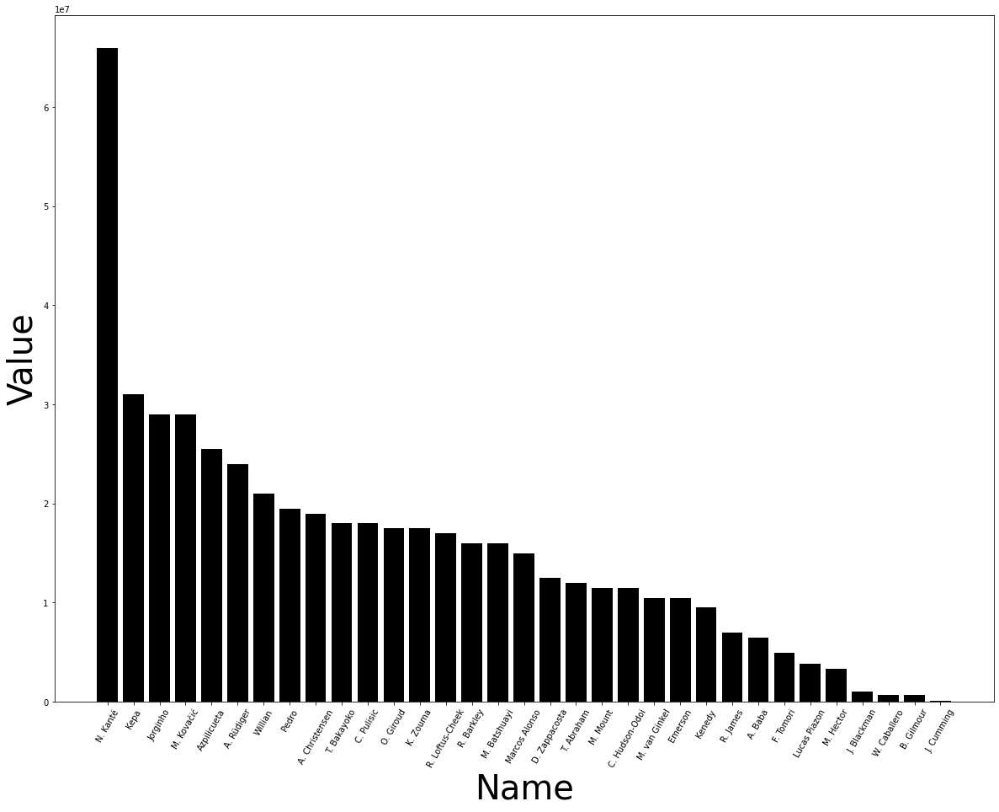

In [146]:
plt.figure(figsize=(20, 15))
plt.bar(CH_most_valuable['short_name'], CH_most_valuable['value_eur'], color="k")
plt.tick_params(axis='x', rotation=60)
plt.ylabel("Value", fontsize=40)
plt.xlabel("Name", fontsize=40)
plt.show()

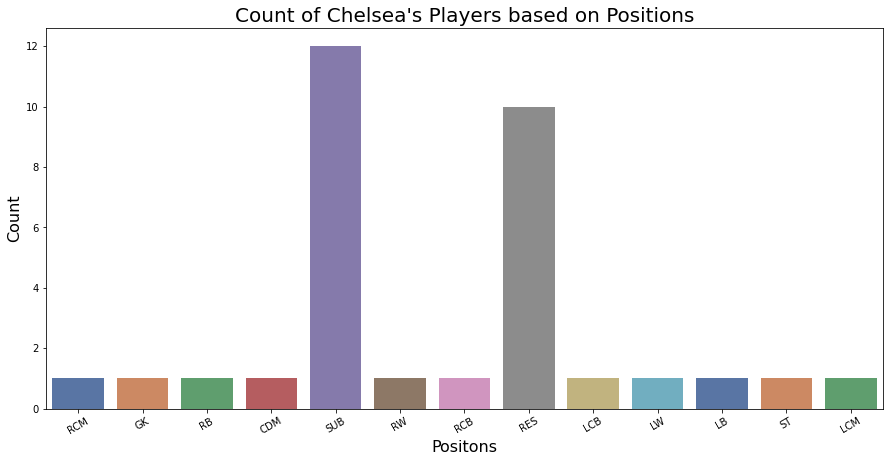

In [147]:
plt.figure(figsize=(15, 7))
ax = sns.countplot(x="team_position", data=CH, palette="deep")
ax.set_title("Count of Chelsea's Players based on Positions", fontsize=20)
ax.set_xlabel(xlabel="Positons", fontsize=16)
ax.set_ylabel(ylabel="Count", fontsize=16)
plt.xticks(rotation=30, fontsize=10)
plt.show()

In [148]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = CH['overall'],
    y = CH['value_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=CH['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= CH['short_name'],
))

fig.update_layout(title='Overall Rating vs Value in Euros in Chelsea',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

## Liverpool FC

In [149]:
LI = club('Liverpool')
print("Team Value of Liverpool is",teamValue(LI),"million Euros")
print("Liverpool spends", teamWeeklyWage(LI),"million Euros as per Week Wages")
print("Liverpool has average squad age of", avgSquadAge(LI), "years")
print("Liverpool has average overall rating of", avgOverallRating(LI))
print("Liverpool has average potential of", avgPotential(LI))

Team Value of Liverpool is 693.265 million Euros
Liverpool spends 2.667 million Euros as per Week Wages
Liverpool has average squad age of 24.5 years
Liverpool has average overall rating of 75.8
Liverpool has average potential of 82.7


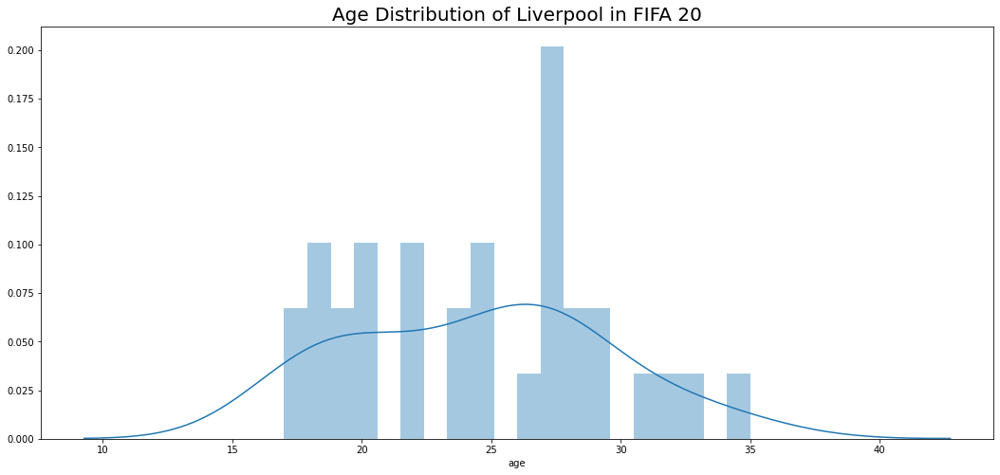

In [150]:
plt.figure(figsize=(18,8))
plt.title('Age Distribution of Liverpool in FIFA 20', fontsize=20)
sns.distplot(a=LI['age'], kde=True, bins=20)
plt.show()

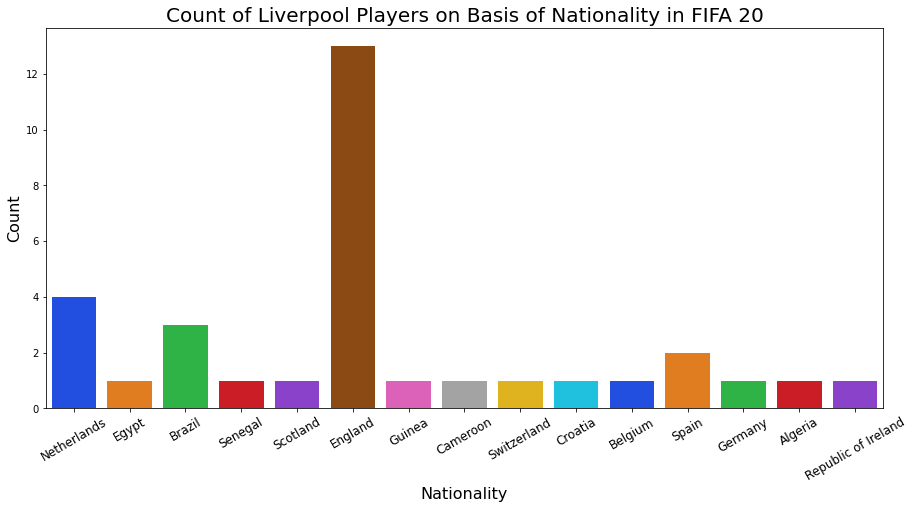

In [151]:
plt.figure(figsize= (15,7))

ax = sns.countplot(x='nationality', data=LI, palette='bright')
ax.set_title(label='Count of Liverpool Players on Basis of Nationality in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Nationality', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [152]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = LI['nationality'],
    y = LI['overall'],
    mode='markers',
    marker=dict(
        size=16,
        color=LI['overall'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= LI['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating in Liverpool',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

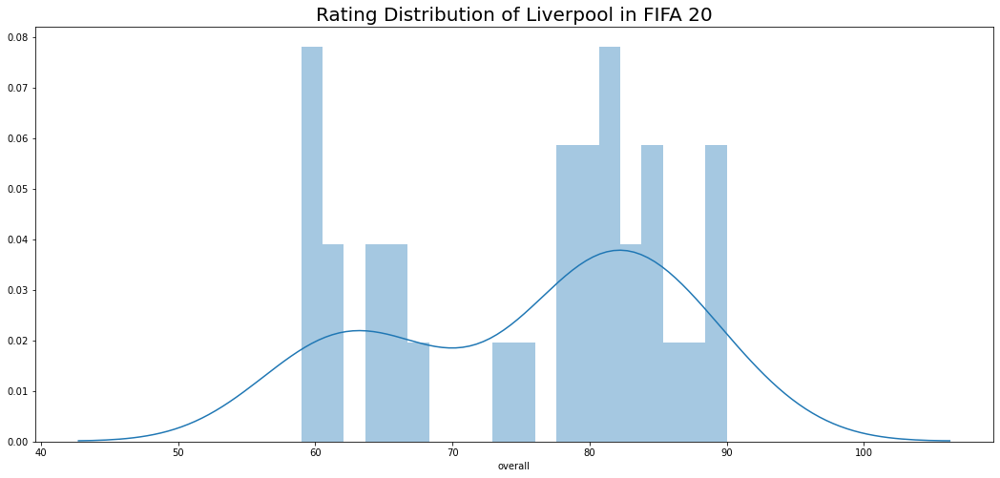

In [153]:
plt.figure(figsize=(18,8))
plt.title('Rating Distribution of Liverpool in FIFA 20', fontsize=20)
sns.distplot(a=LI['overall'], kde=True, bins=20)
plt.show()

In [154]:
LI_most_valuable = LI.sort_values(by="value_eur", ascending=False)
LI_most_valuable.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
9,M. Salah,27,1992-06-15,175,71,Egypt,Liverpool,90,90,80500000,240000,"RW, ST",Left,3,3,4,High/Medium,PLAYER_BODY_TYPE_25,1489,"#Speedster, #Dribbler, #Acrobat, #Clinical Fin...",RW,11,Disclosed,2017-07-01,2e+03,93,86,81,89,45,74,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",79,90,59,84,79,89,83,69,75,89,94,92,91,92,88,80,69,85,73,84,63,55,92,84,77,91,38,43,41,14,14,9,11,14,84+3,84+3,84+3,88+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,87+3,81+3,81+3,81+3,87+3,70+3,67+3,67+3,67+3,70+3,66+3,57+3,57+3,57+3,66+3,23,7e+07,-1e+07
7,V. van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,90,91,78000000,200000,CB,Right,3,3,2,Medium/Medium,Normal,1502,"#Tackling , #Tactician , #Strength, #Complete ...",LCB,4,Disclosed,2018-01-01,2e+03,77,60,70,71,90,86,65,63,62,66,38,63,"Diver, Avoids Using Weaker Foot, Leadership, L...",53,52,86,78,45,70,60,70,81,76,74,79,61,88,53,81,90,75,92,64,82,89,47,65,62,89,91,92,85,13,10,13,11,11,69+3,69+3,69+3,67+3,69+3,69+3,69+3,67+3,69+3,69+3,69+3,69+3,74+3,74+3,74+3,69+3,79+3,83+3,83+3,83+3,79+3,81+3,87+3,87+3,87+3,81+3,24,9e+07,8e+06
39,S. Mané,27,1992-04-10,175,69,Senegal,Liverpool,88,88,62000000,220000,"LW, LM",Right,3,4,4,High/Medium,Normal,1147,"#Speedster, #Dribbler, #Acrobat",LW,10,Disclosed,2016-07-01,2e+03,94,83,77,89,44,74,65,63,62,66,38,63,"Selfish, Early Crosser",74,87,81,81,75,89,76,64,71,87,95,93,92,90,86,84,86,85,67,77,75,35,90,83,71,84,42,42,38,10,10,15,7,14,85+3,85+3,85+3,86+3,87+3,87+3,87+3,86+3,85+3,85+3,85+3,85+3,78+3,78+3,78+3,85+3,67+3,63+3,63+3,63+3,67+3,64+3,57+3,57+3,57+3,64+3,22,5e+07,-1e+07
13,Alisson,26,1992-10-02,191,91,Brazil,Liverpool,89,91,58000000,155000,GK,Right,3,3,1,Medium/Medium,Normal,1117,#Team Player,GK,1,Disclosed,2018-07-19,2e+03,68,52,57,63,52,65,85,84,85,89,51,90,"Flair, Swerve Pass",17,13,19,45,20,27,19,18,44,30,56,47,40,88,37,64,52,32,78,14,27,11,13,66,23,65,15,19,16,85,84,85,90,89,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,24,9e+07,3e+07
63,Roberto Firmino,27,1991-10-02,181,76,Brazil,Liverpool,86,87,52000000,170000,"CF, ST, CAM",Right,3,4,4,High/High,Lean,1001,"#Dribbler, #Playmaker , #Engine, #Complete Mi...",CF,9,Disclosed,2015-07-06,2e+03,77,82,80,87,61,78,65,63,62,66,38,63,"Selfish, Finesse Shot, Outside Foot Shot, Crow...",72,85,78,86,81,88,80,65,76,88,78,77,80,86,81,81,81,88,74,76,73,58,87,86,72,88,60,64,42,8,11,9,6,10,83+3,83+3,83+3,83+3,84+3,84+3,84+3,83+3,84+3,84+3,84+3,83+3,82+3,82+3,82+3,83+3,72+3,73+3,73+3,73+3,72+3,69+3,67+3,67+3,67+3,69+3,23,4e+07,-9e+06
81,Fabinho,25,1993-10-23,188,78,Brazil,Liverpool,85,89,45000000,125000,CDM,Right,3,2,3,Medium/High,Lean,866,"#Tackling , #Tactician",CDM,3,Disclosed,2018-07-01,2e+03,68,69,78,77,85,83,65,63,62,66,38,63,"Diver, Injury Prone, Leadership",75,66,75,83,47,76,7

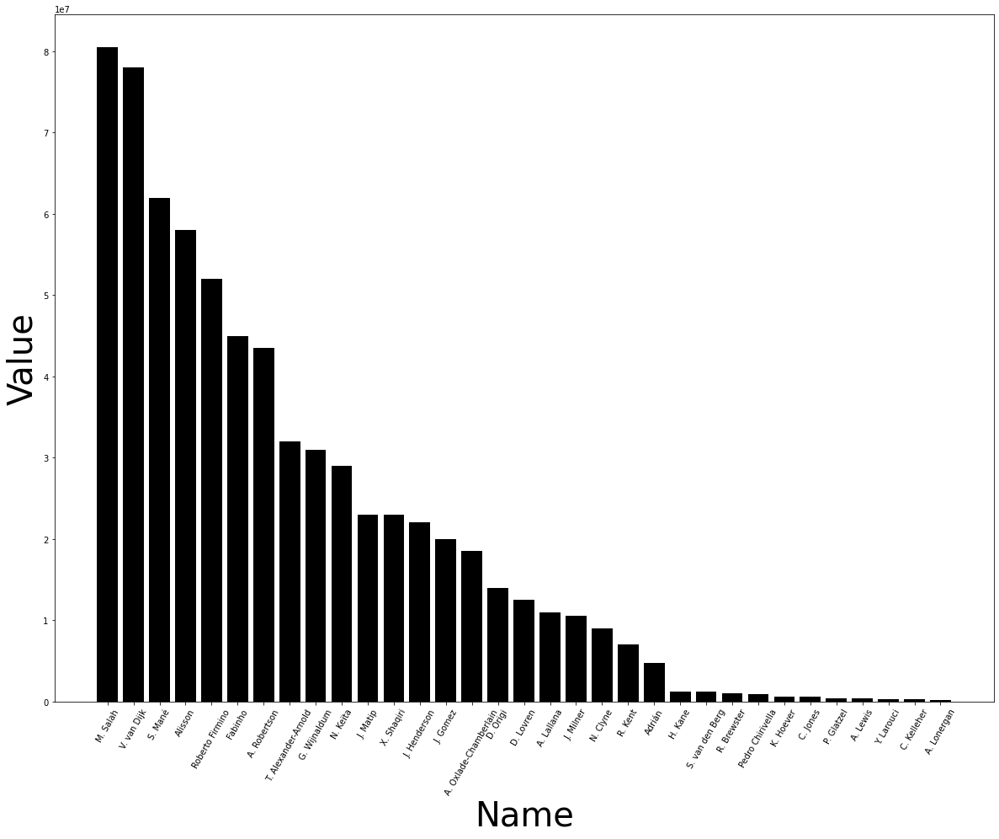

In [155]:
plt.figure(figsize=(20, 15))
plt.bar(LI_most_valuable['short_name'], LI_most_valuable['value_eur'], color="k")
plt.tick_params(axis='x', rotation=60)
plt.ylabel("Value", fontsize=40)
plt.xlabel("Name", fontsize=40)
plt.show()

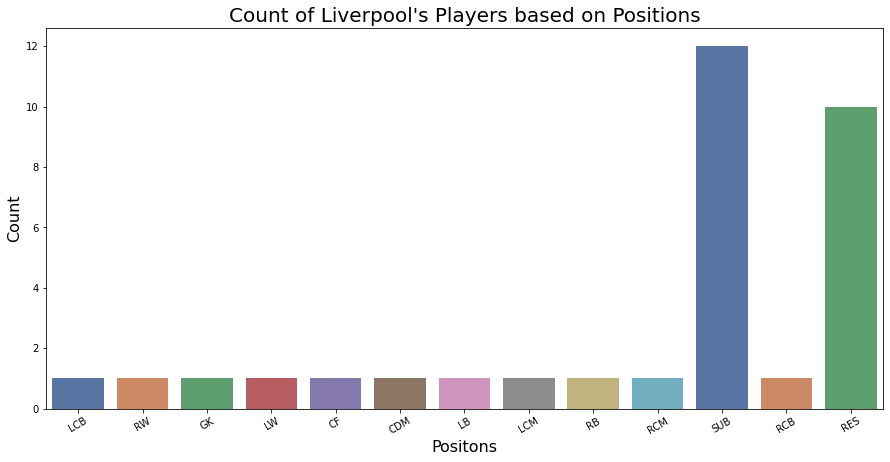

In [156]:
plt.figure(figsize=(15, 7))
ax = sns.countplot(x="team_position", data=LI, palette="deep")
ax.set_title("Count of Liverpool's Players based on Positions", fontsize=20)
ax.set_xlabel(xlabel="Positons", fontsize=16)
ax.set_ylabel(ylabel="Count", fontsize=16)
plt.xticks(rotation=30, fontsize=10)
plt.show()

In [157]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = LI['overall'],
    y = LI['value_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=LI['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= LI['short_name'],
))

fig.update_layout(title='Overall Rating vs Value in Euros in Liverpool',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

## Arsenal FC

In [158]:
AS = club('Arsenal')
print("Team Value of Arsenal is",teamValue(AS),"million Euros")
print("Arsenal spends", teamWeeklyWage(AS),"million Euros as per Week Wages")
print("Arsenal has average squad age of", avgSquadAge(AS), "years")
print("Arsenal has average overall rating of", avgOverallRating(AS))
print("Arsenal has average potential of", avgPotential(AS))

Team Value of Arsenal is 454.86 million Euros
Arsenal spends 2.026 million Euros as per Week Wages
Arsenal has average squad age of 23.8 years
Arsenal has average overall rating of 75.1
Arsenal has average potential of 82.5


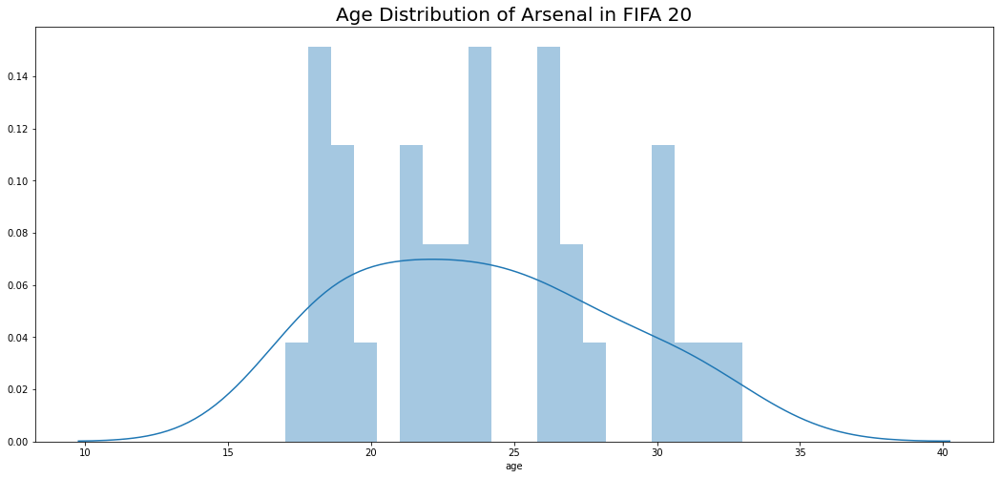

In [159]:
plt.figure(figsize=(18,8))
plt.title('Age Distribution of Arsenal in FIFA 20', fontsize=20)
sns.distplot(a=AS['age'], kde=True, bins=20)
plt.show()

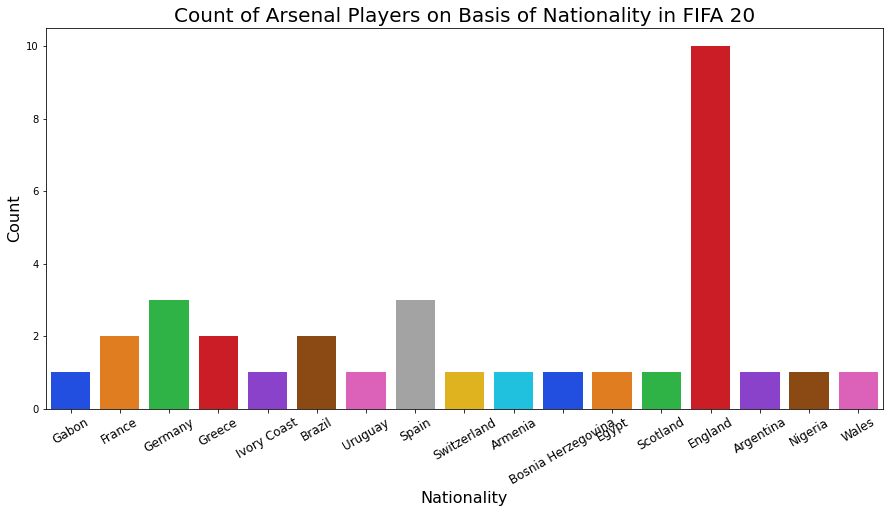

In [160]:
plt.figure(figsize= (15,7))

ax = sns.countplot(x='nationality', data=AS, palette='bright')
ax.set_title(label='Count of Arsenal Players on Basis of Nationality in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Nationality', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [161]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = AS['nationality'],
    y = AS['overall'],
    mode='markers',
    marker=dict(
        size=16,
        color=AS['overall'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= AS['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating in Arsenal',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

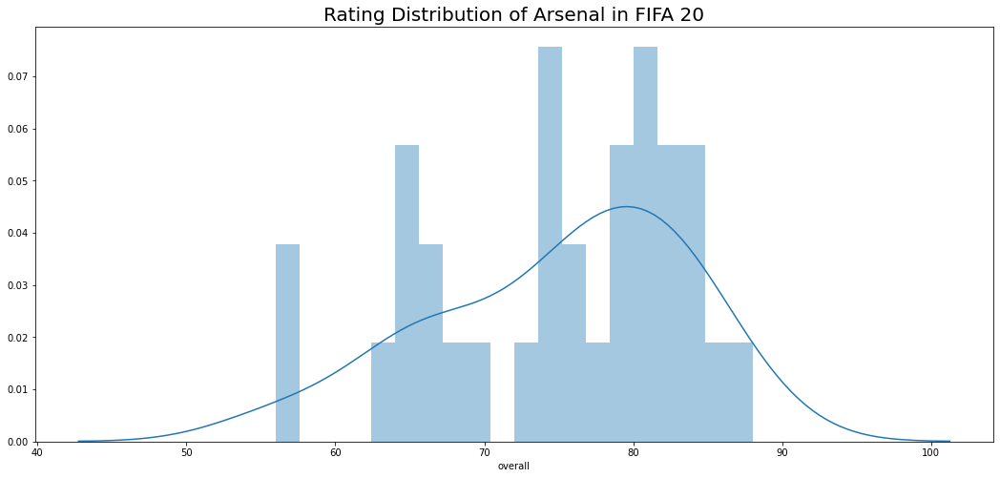

In [162]:
plt.figure(figsize=(18,8))
plt.title('Rating Distribution of Arsenal in FIFA 20', fontsize=20)
sns.distplot(a=AS['overall'], kde=True, bins=20)
plt.show()

In [163]:
AS_most_valuable = AS.sort_values(by="value_eur", ascending=False)
AS_most_valuable.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
38,P. Aubameyang,30,1989-06-18,187,80,Gabon,Arsenal,88,88,57000000,205000,"ST, LM",Right,3,4,4,Medium/Low,Lean,1e+08,"#Poacher, #Speedster, #Complete Forward",LM,14,Disclosed,2018-01-31,2e+03,94,85,75,80,37,69,65,63,62,66,38,63,"Diver, Beat Offside Trap, Early Crosser, Speed...",76,89,78,77,86,79,80,74,64,82,93,95,76,87,69,82,79,78,74,79,43,48,90,77,76,85,27,25,36,6,9,15,9,9,84+3,84+3,84+3,83+3,83+3,83+3,83+3,83+3,81+3,81+3,81+3,81+3,74+3,74+3,74+3,81+3,64+3,58+3,58+3,58+3,64+3,61+3,51+3,51+3,51+3,61+3,22,5e+07,-6e+06
72,A. Lacazette,28,1991-05-28,175,73,France,Arsenal,86,86,46000000,165000,ST,Right,3,4,4,High/High,Normal,9e+07,#Dribbler,ST,9,Disclosed,2017-07-05,2e+03,82,85,75,86,40,74,65,63,62,66,38,63,"Selfish, Speed Dribbler (CPU AI Only), Crowd F...",68,87,74,81,82,86,74,74,69,86,82,82,85,86,85,86,76,79,73,78,72,42,87,78,84,86,29,42,30,11,6,9,5,6,83+3,83+3,83+3,82+3,84+3,84+3,84+3,82+3,82+3,82+3,82+3,81+3,76+3,76+3,76+3,81+3,63+3,62+3,62+3,62+3,63+3,59+3,55+3,55+3,55+3,59+3,23,5e+07,-6e+04
169,N. Pépé,24,1995-05-29,183,73,Ivory Coast,Arsenal,83,88,34500000,97000,"RM, RW, ST",Left,1,3,4,High/Low,Lean,7e+07,"#Speedster, #Dribbler, #Acrobat",RM,19,Disclosed,2019-08-01,2e+03,91,81,75,85,33,67,65,63,62,66,38,63,"Injury Free, Beat Offside Trap, Argues with Of...",78,82,57,75,70,86,79,72,67,82,90,91,91,83,79,80,68,84,68,79,43,28,82,80,85,83,36,27,25,11,14,11,6,8,79+2,79+2,79+2,82+2,81+2,81+2,81+2,82+2,81+2,81+2,81+2,81+2,73+2,73+2,73+2,81+2,61+2,55+2,55+2,55+2,61+2,57+2,46+2,46+2,46+2,57+2,21,5e+07,2e+07
135,M. Özil,30,1988-10-15,180,76,Germany,Arsenal,84,84,29500000,125000,"CAM, RW",Left,4,2,4,Medium/Low,Lean,6e+07,#Playmaker,CAM,10,Disclosed,2013-09-02,2e+03,70,72,86,84,24,56,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Finesse Shot",83,73,51,89,80,84,84,76,82,89,72,69,77,83,71,70,45,67,56,69,44,24,81,90,67,83,24,16,19,6,14,10,6,14,74+3,74+3,74+3,81+3,80+3,80+3,80+3,81+3,83+3,83+3,83+3,81+3,77+3,77+3,77+3,81+3,57+3,55+3,55+3,55+3,57+3,51+3,39+3,39+3,39+3,51+3,23,3e+07,8e+05
244,L. Torreira,23,1996-02-11,168,64,Uruguay,Arsenal,82,87,27000000,80000,"CDM, CM",Right,2,3,3,Medium/High,Normal,5e+07,#Team Player,RDM,11,Disclosed,2018-07-12,2e+03,75,67,77,80,81,75,65,63,62,66,38,63,Argues with Officials,74,61,59,83,65,78,70,78,76,81,79,72,85,79,93,78,52,86,66,74,87,86,68,74,48,78,84,84,77,5,5,13,7,9,71+2,71+2,71+2,75+2,74+2,74+2,74+2,75+2,76+2,76+2,76+2,76+2,78+2,78+2,78+2,76+2,80+2,81+2,81+2,81+2,80+2,79+2,77+2,77+2,77+2,79+2,22,4e+07,2e+07
122,B. Leno,27,1992-03-04,190,83,Germany,Arsenal,84,86,26000000,91000,GK,Right,3,3,1,Medium/Medium,Normal,5e+07,#Team Player,GK,1,Disclosed,2018-07-01,2e+03,68,52,57,63,52,65,83,81,78,85,56,84,Swerve Pass,9,9,13,45,10,16,9,8,42,30,55,56,52,79,44,59,73,43,68,14,28,22,7,54,23,66,27,15,18,83,81,78,84,85,NA

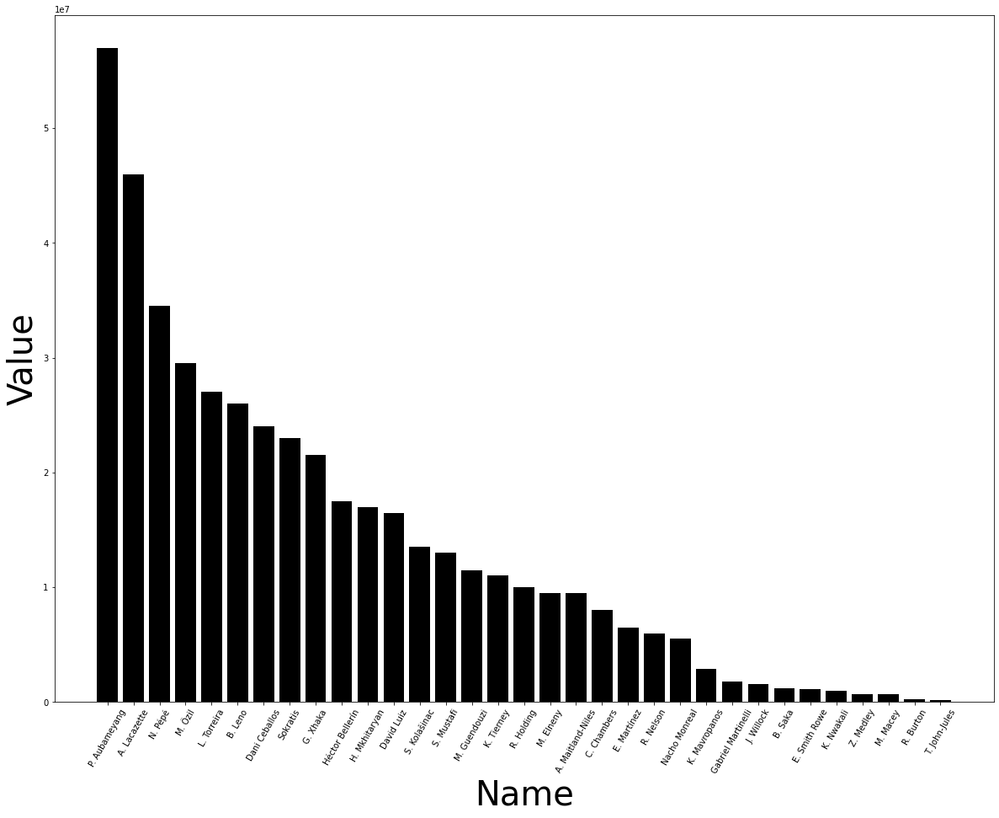

In [164]:
plt.figure(figsize=(20, 15))
plt.bar(AS_most_valuable['short_name'], AS_most_valuable['value_eur'], color="k")
plt.tick_params(axis='x', rotation=60)
plt.ylabel("Value", fontsize=40)
plt.xlabel("Name", fontsize=40)
plt.show()

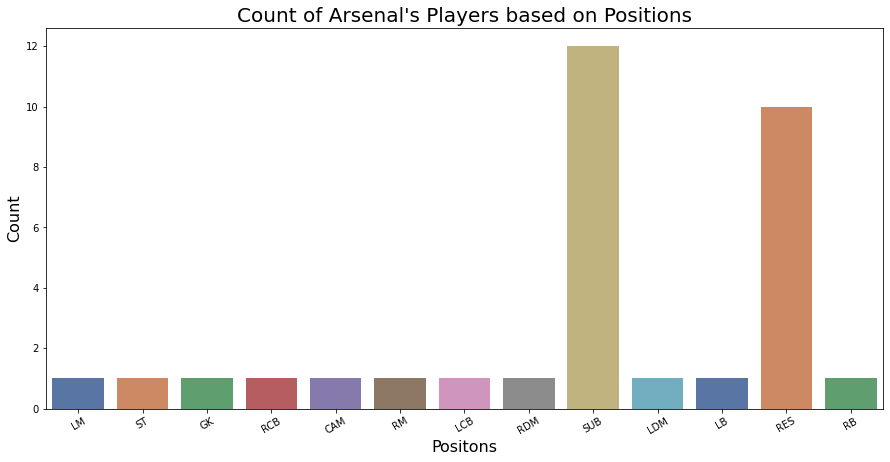

In [165]:
plt.figure(figsize=(15, 7))
ax = sns.countplot(x="team_position", data=AS, palette="deep")
ax.set_title("Count of Arsenal's Players based on Positions", fontsize=20)
ax.set_xlabel(xlabel="Positons", fontsize=16)
ax.set_ylabel(ylabel="Count", fontsize=16)
plt.xticks(rotation=30, fontsize=10)
plt.show()

In [166]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = AS['overall'],
    y = AS['value_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=df_20['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= AS['short_name'],
))

fig.update_layout(title='Overall Rating vs Value in Euros in Arsenal',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

## Manchester City FC

In [167]:
MC = club('Manchester City')
print("Team Value of Manchester City is",teamValue(MC),"million Euros")
print("Manchester City spends", teamWeeklyWage(MC),"million Euros as per Week Wages")
print("Manchester City has average squad age of", avgSquadAge(MC), "years")
print("Manchester City has average overall rating of", avgOverallRating(MC))
print("Manchester City has average potential of", avgPotential(MC))

Team Value of Manchester City is 845.745 million Euros
Manchester City spends 3.984 million Euros as per Week Wages
Manchester City has average squad age of 24.3 years
Manchester City has average overall rating of 77.0
Manchester City has average potential of 84.3


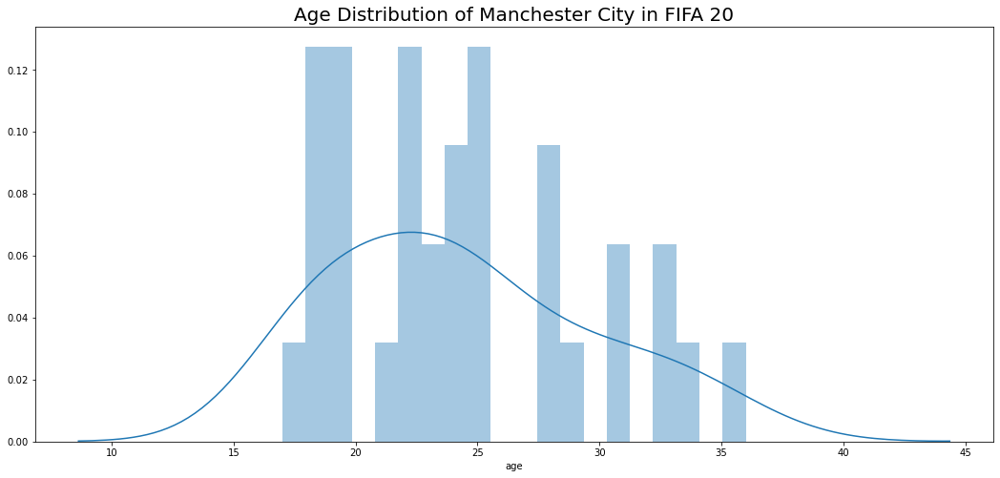

In [168]:
plt.figure(figsize=(18,8))
plt.title('Age Distribution of Manchester City in FIFA 20', fontsize=20)
sns.distplot(a=MC['age'], kde=True, bins=20)
plt.show()

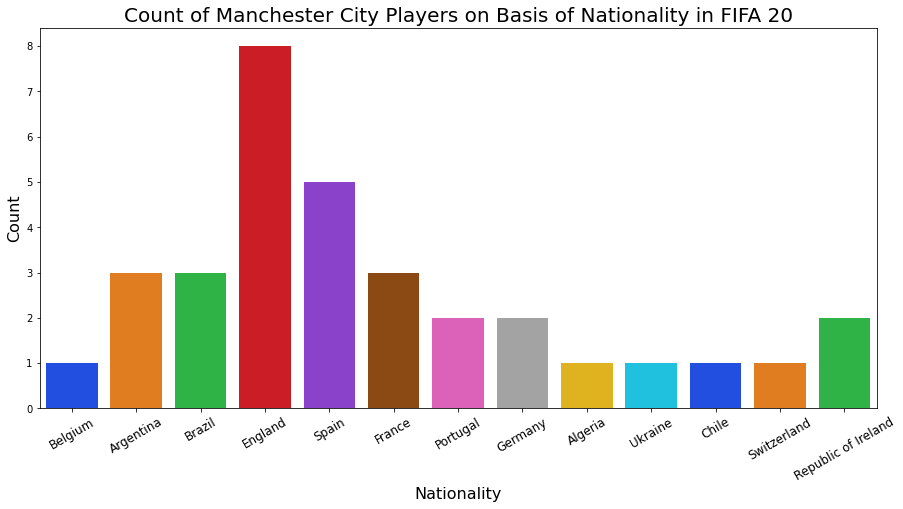

In [169]:
plt.figure(figsize= (15,7))

ax = sns.countplot(x='nationality', data=MC, palette='bright')
ax.set_title(label='Count of Manchester City Players on Basis of Nationality in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Nationality', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [170]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = MC['nationality'],
    y = MC['overall'],
    mode='markers',
    marker=dict(
        size=16,
        color=MC['overall'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= MC['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating in Manchester City',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

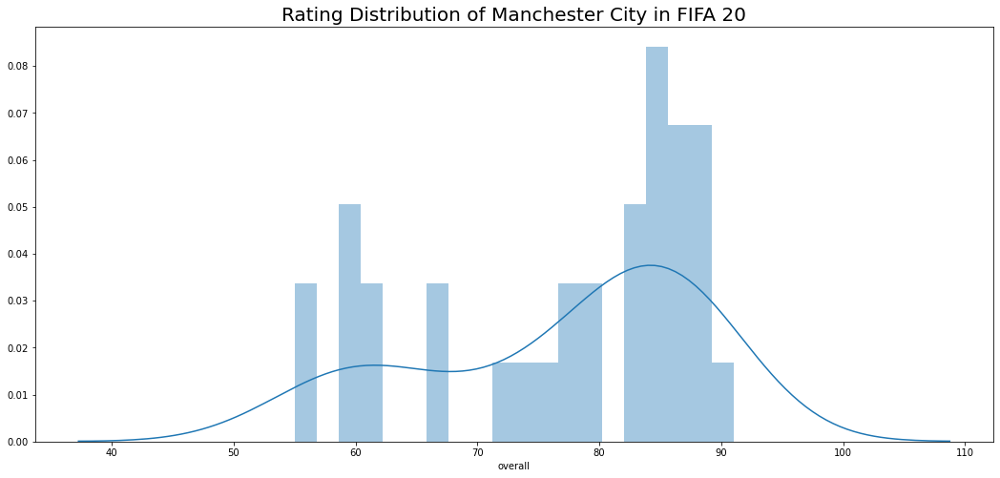

In [171]:
plt.figure(figsize=(18,8))
plt.title('Rating Distribution of Manchester City in FIFA 20', fontsize=20)
sns.distplot(a=MC['overall'], kde=True, bins=20)
plt.show()

In [172]:
MC_most_valuable = MC.sort_values(by="value_eur", ascending=False)
MC_most_valuable.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
5,K. De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,High/High,Normal,1665,"#Dribbler, #Playmaker , #Engine, #Distance Sh...",RCM,17,Disclosed,2015-08-30,2e+03,76,86,92,86,61,78,65,63,62,66,38,63,"Power Free-Kick, Avoids Using Weaker Foot, Div...",93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,15,13,5,10,13,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21,9e+07,-4e+06
26,R. Sterling,24,1994-12-08,170,69,England,Manchester City,88,90,73000000,255000,"RW, LW",Right,3,3,4,High/Medium,Lean,1405,"#Speedster, #Dribbler, #Acrobat",LW,7,Disclosed,2015-07-14,2e+03,93,79,78,89,45,57,65,63,62,66,38,63,"Selfish, Early Crosser",78,83,38,84,67,89,75,63,69,88,96,91,94,89,94,76,57,79,54,77,38,30,91,79,69,79,47,53,47,15,12,12,15,9,79+3,79+3,79+3,86+3,85+3,85+3,85+3,86+3,85+3,85+3,85+3,85+3,78+3,78+3,78+3,85+3,68+3,62+3,62+3,62+3,68+3,64+3,51+3,51+3,51+3,64+3,23,7e+07,-5e+06
41,Bernardo Silva,24,1994-08-10,173,64,Portugal,Manchester City,87,90,64000000,210000,"RW, CAM, CM",Left,2,3,4,High/High,Lean,1232,"#Dribbler, #Engine, #Acrobat",RW,20,Disclosed,2017-07-01,2e+03,81,76,83,92,51,67,65,63,62,66,38,63,"Selfish, Finesse Shot, Crowd Favourite",85,78,51,86,69,92,84,67,74,92,85,78,94,85,92,74,51,93,54,75,69,49,85,85,68,87,49,59,40,9,10,14,12,9,77+2,77+2,77+2,85+2,84+2,84+2,84+2,85+2,85+2,85+2,85+2,86+2,82+2,82+2,82+2,86+2,72+2,69+2,69+2,69+2,72+2,67+2,57+2,57+2,57+2,67+2,21,7e+07,4e+06
55,L. Sané,23,1996-01-11,183,75,Germany,Manchester City,86,92,61000000,195000,LW,Left,2,3,4,High/Medium,Lean,1251,"#Speedster, #Dribbler, #Acrobat",SUB,19,Disclosed,2016-08-02,2e+03,95,81,79,86,38,70,65,63,62,66,38,63,"Long Throw-in, Selfish, Early Crosser",83,81,72,80,85,88,83,82,64,85,93,96,86,81,80,87,64,78,70,78,61,34,84,82,71,80,36,32,35,8,12,9,9,14,82+2,82+2,82+2,84+2,84+2,84+2,84+2,84+2,83+2,83+2,83+2,83+2,74+2,74+2,74+2,83+2,65+2,59+2,59+2,59+2,65+2,61+2,52+2,52+2,52+2,61+2,22,1e+08,4e+07
17,S. Agüero,31,1988-06-02,173,70,Argentina,Manchester City,89,89,60000000,300000,ST,Right,4,4,4,High/Medium,Stocky,1110,"#Dribbler, #Clinical Finisher, #Complete Forward",ST,10,Disclosed,2011-07-28,2e+03,80,90,77,88,33,74,65,63,62,66,38,63,"Avoids Using Weaker Foot, Outside Foot Shot",70,93,78,83,85,88,83,73,64,89,82,78,84,92,91,89,81,79,74,84,65,24,93,83,83,90,30,29,24,13,15,6,11,14,87+3,87+3,87+3,85+3,87+3,87+3,87+3,85+3,85+3,85+3,85+3,83+3,77+3,77+3,77+3,83+3,60+3,58+3,58+3,58+3,60+3,56+3,50+3,50+3,50+3,56+3,23,6e+07,1e+05
40,A. Laporte,25,1994-05-27,189,85,France,Manchester City,87,90,56500000,195000,"CB, LB",Left,2,3,2,Medium/Medium,Normal,1088,"#Tackling , #Tactician",LCB,14,Disclosed,2018-01-30,2e+03,64

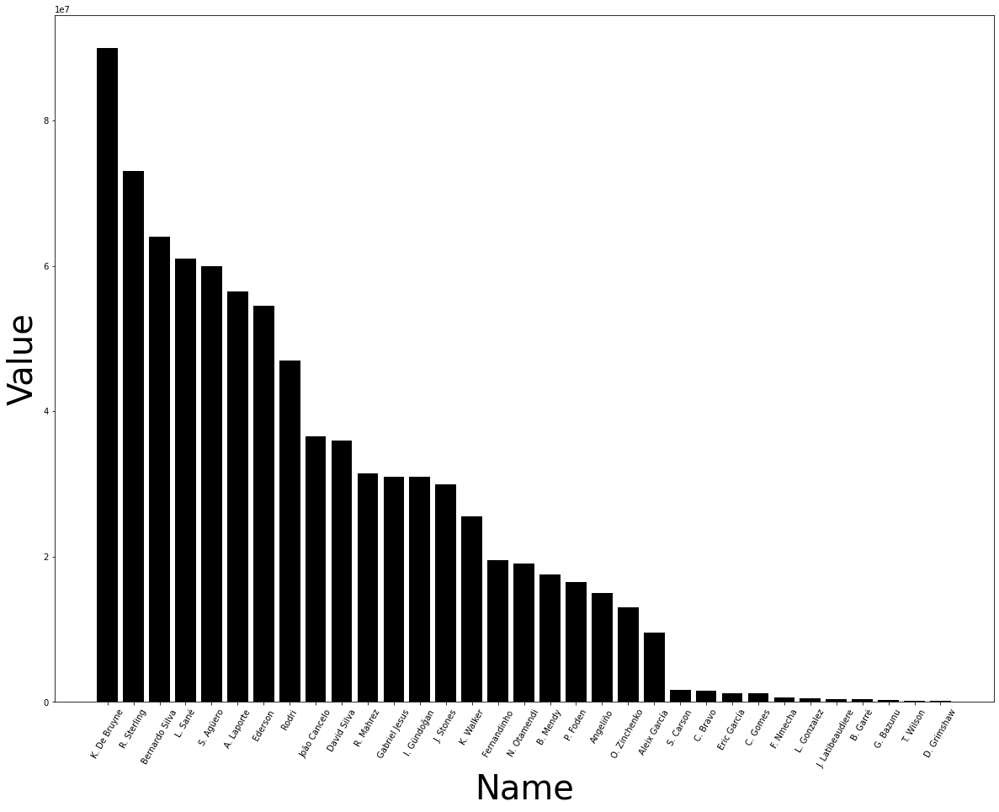

In [173]:
plt.figure(figsize=(20, 15))
plt.bar(MC_most_valuable['short_name'], MC_most_valuable['value_eur'], color="k")
plt.tick_params(axis='x', rotation=60)
plt.ylabel("Value", fontsize=40)
plt.xlabel("Name", fontsize=40)
plt.show()

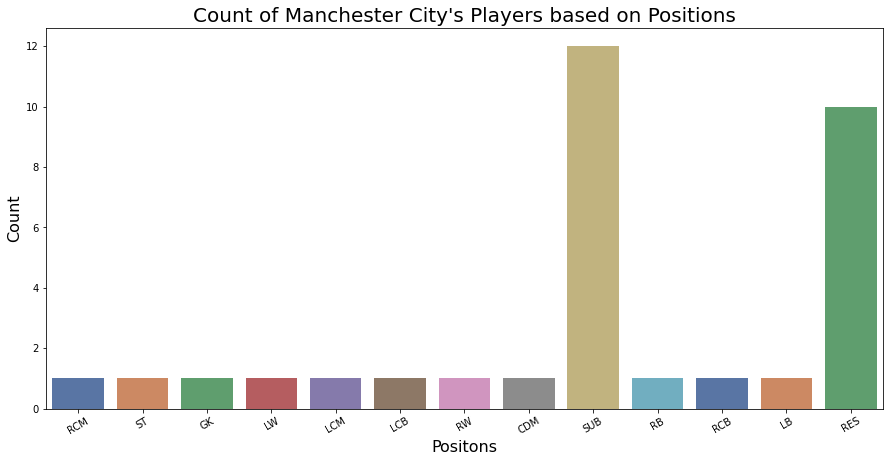

In [174]:
plt.figure(figsize=(15, 7))
ax = sns.countplot(x="team_position", data=MC, palette="deep")
ax.set_title("Count of Manchester City's Players based on Positions", fontsize=20)
ax.set_xlabel(xlabel="Positons", fontsize=16)
ax.set_ylabel(ylabel="Count", fontsize=16)
plt.xticks(rotation=30, fontsize=10)
plt.show()

In [175]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = MC['overall'],
    y = MC['value_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=MC['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= MC['short_name'],
))

fig.update_layout(title='Overall Rating vs Value in Euros in Manchester City',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

## FC Barcelona

In [176]:
BAR = club('FC Barcelona')
print("Team Value of Barcelona is",teamValue(BAR),"million Euros")
print("Barcelona spends", teamWeeklyWage(BAR),"million Euros as per Week Wages")
print("Barcelona has average squad age of", avgSquadAge(BAR), "years")
print("Barcelona has average overall rating of", avgOverallRating(BAR))
print("Barcelona has average potential of", avgPotential(BAR))

Team Value of Barcelona is 869.3 million Euros
Barcelona spends 4.95 million Euros as per Week Wages
Barcelona has average squad age of 24.1 years
Barcelona has average overall rating of 78.4
Barcelona has average potential of 85.7


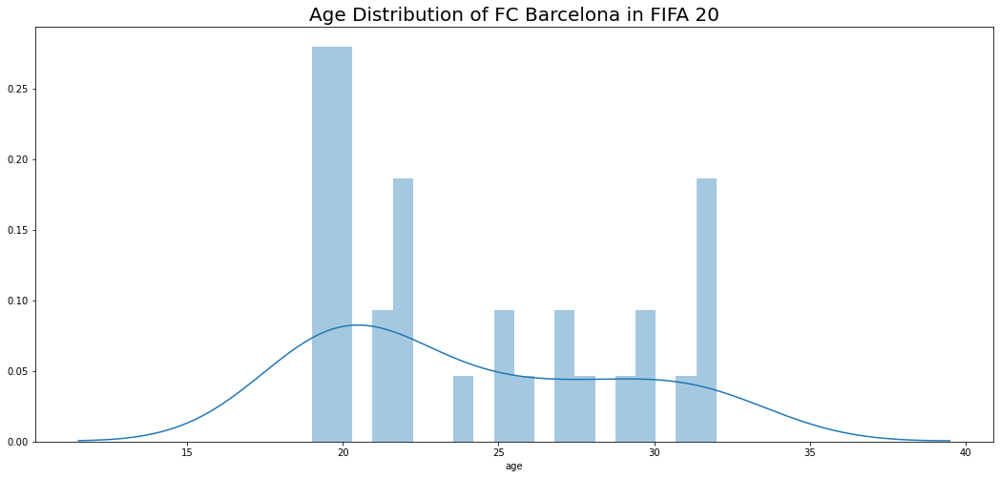

In [177]:
plt.figure(figsize=(18,8))
plt.title('Age Distribution of FC Barcelona in FIFA 20', fontsize=20)
sns.distplot(a=BAR['age'], kde=True, bins=20)
plt.show()

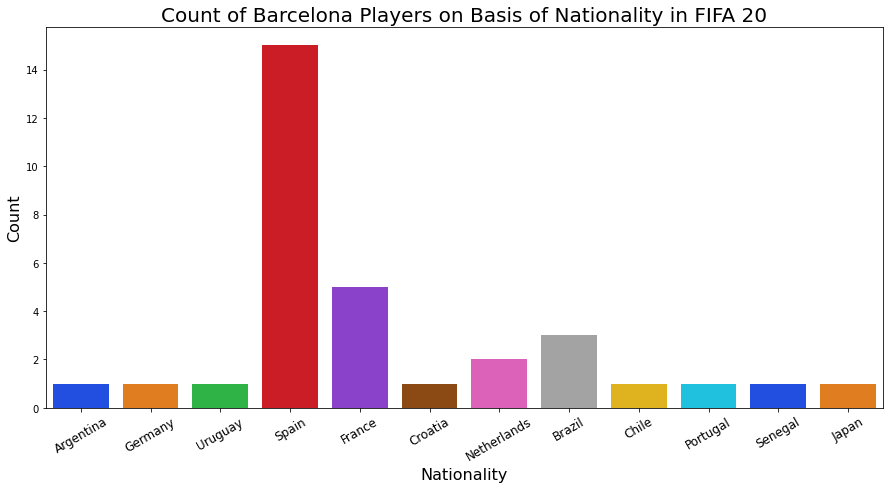

In [178]:
plt.figure(figsize= (15,7))

ax = sns.countplot(x='nationality', data=BAR, palette='bright')
ax.set_title(label='Count of Barcelona Players on Basis of Nationality in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Nationality', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [179]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = BAR['nationality'],
    y = BAR['overall'],
    mode='markers',
    marker=dict(
        size=16,
        color=BAR['overall'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= BAR['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating in Barcelona',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

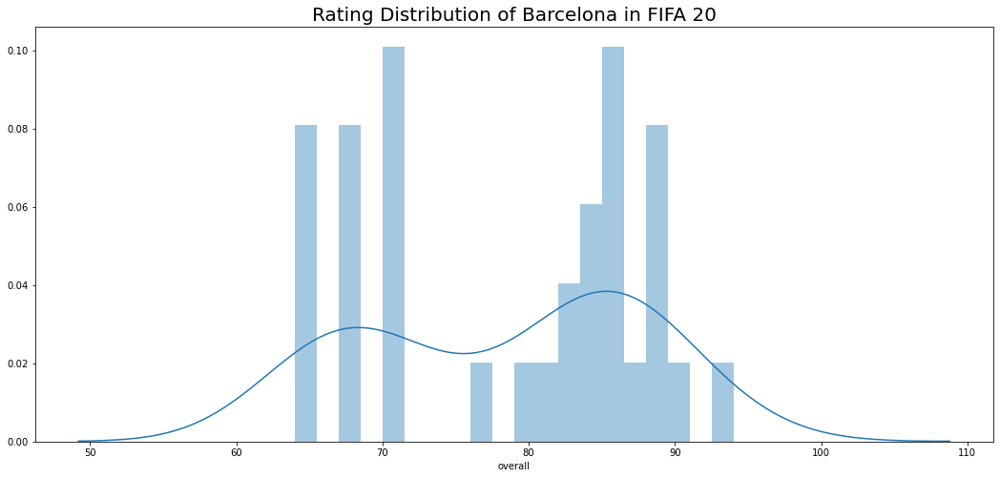

In [180]:
plt.figure(figsize=(18,8))
plt.title('Rating Distribution of Barcelona in FIFA 20', fontsize=20)
sns.distplot(a=BAR['overall'], kde=True, bins=20)
plt.show()

In [181]:
BAR_most_valuable = BAR.sort_values(by="value_eur", ascending=False)
BAR_most_valuable.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,1958,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10,Disclosed,2004-07-01,2e+03,87,92,92,96,39,66,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24,1e+08,0e+00
22,A. Griezmann,28,1991-03-21,176,73,France,FC Barcelona,89,89,69000000,370000,"CF, ST, LW",Left,4,3,4,High/High,Normal,1415,"#Dribbler, #Engine, #Acrobat, #Clinical Finish...",LW,17,Disclosed,2019-07-12,2e+03,81,86,84,89,57,72,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Argues with Offici...",83,89,84,85,87,88,86,85,82,90,82,81,90,92,83,82,89,87,63,83,73,49,90,86,86,89,59,54,49,14,8,14,13,14,85+3,85+3,85+3,87+3,87+3,87+3,87+3,87+3,87+3,87+3,87+3,86+3,83+3,83+3,83+3,86+3,73+3,71+3,71+3,71+3,73+3,70+3,65+3,65+3,65+3,70+3,23,6e+07,-9e+06
6,M. ter Stegen,27,1992-04-30,187,85,Germany,FC Barcelona,90,93,67500000,250000,GK,Right,3,4,1,Medium/Medium,Normal,1434,#Team Player,GK,1,Disclosed,2014-07-01,2e+03,68,52,57,63,52,65,88,85,88,90,45,88,"Swerve Pass, Acrobatic Clearance, Flair Passes",18,14,11,61,14,21,18,12,63,30,38,50,37,86,43,66,79,35,78,10,43,22,11,70,25,70,25,13,10,88,85,88,88,90,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,24,6e+07,-9e+06
21,Sergio Busquets,30,1988-07-16,189,76,Spain,FC Barcelona,89,89,55000000,300000,"CDM, CM",Right,4,3,3,Medium/Medium,Lean,1128,"#Playmaker , #Tactician",CDM,5,Disclosed,2008-09-01,2e+03,42,62,80,80,85,80,65,63,62,66,38,63,Giant Throw-in,62,67,68,89,44,80,66,68,82,88,40,43,67,87,49,61,66,86,77,54,85,89,77,86,60,93,90,86,80,5,8,13,9,13,70+3,70+3,70+3,73+3,75+3,75+3,75+3,73+3,78+3,78+3,78+3,75+3,83+3,83+3,83+3,75+3,78+3,86+3,86+3,86+3,78+3,78+3,82+3,82+3,82+3,78+3,21,6e+07,5e+06
19,L. Suárez,32,1987-01-24,182,86,Uruguay,FC Barcelona,89,89,53000000,355000,ST,Right,5,4,3,High/Medium,Normal,1087,"#Distance Shooter, #Strength, #Clinical Finish...",ST,9,Disclosed,2014-07-11,2e+03,73,89,80,84,51,84,65,63,62,66,38,63,"Diver, Speed Dribbler (CPU AI Only)",78,91,83,82,90,85,86,82,72,84,76,70,79,92,79,88,69,82,86,86,87,41,92,82,83,85,57,45,38,27,25,31,33,37,86+5,86+5,86+5,83+5,85+5,85+5,85+5,83+5,84+5,84+5,84+5,82+5,79+5,79+5,79+5,82+5,67+5,67+5,67+5,67+5,67+5,64+5,63+5,63+5,63+5,64+5,25,6e+07,7e+06
75,F. de Jong,22,1997-05-12,180,74,Netherlands,FC Barcelona,85,91,52000000,195000,"CM, CDM",Right,3,3,4,Medium/High,Lean,1170,"#Dribbler, #Playmaker , #Complete Midfielder",LCM,21,Disclosed,2019-07-01,2e+03,79,64,84,87,76,76,65,63,62,66,38,63,"Selfi

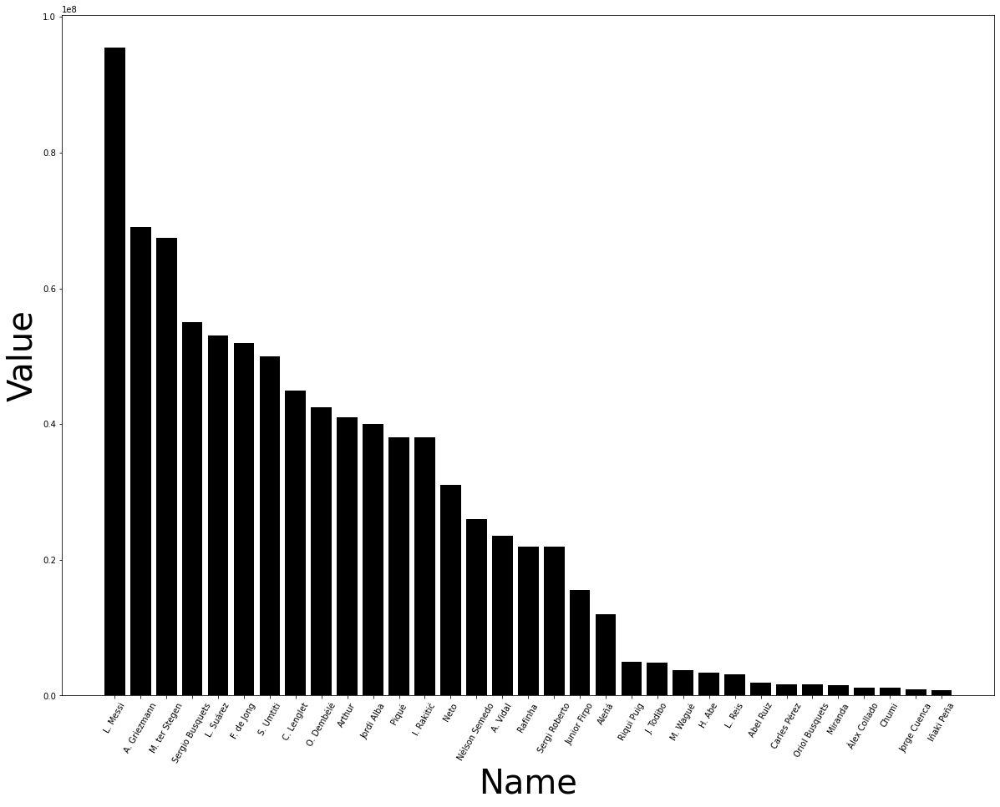

In [182]:
plt.figure(figsize=(20, 15))
plt.bar(BAR_most_valuable['short_name'], BAR_most_valuable['value_eur'], color="k")
plt.tick_params(axis='x', rotation=60)
plt.ylabel("Value", fontsize=40)
plt.xlabel("Name", fontsize=40)
plt.show()

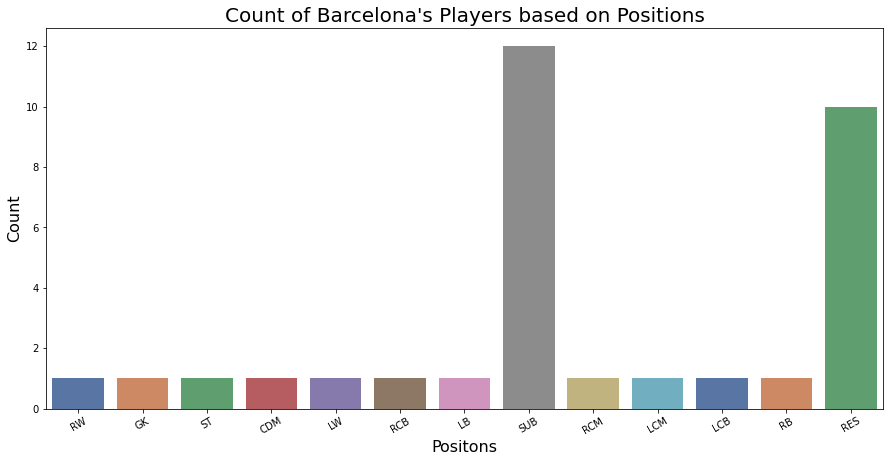

In [183]:
plt.figure(figsize=(15, 7))
ax = sns.countplot(x="team_position", data=BAR, palette="deep")
ax.set_title("Count of Barcelona's Players based on Positions", fontsize=20)
ax.set_xlabel(xlabel="Positons", fontsize=16)
ax.set_ylabel(ylabel="Count", fontsize=16)
plt.xticks(rotation=30, fontsize=10)
plt.show()

In [184]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = BAR['overall'],
    y = BAR['value_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=BAR['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= BAR['short_name'],
))

fig.update_layout(title='Overall Rating vs Value in Euros in Barcelona',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

## Real Madrid FC

In [185]:
RM = club('Real Madrid')
print("Team Value of Real Madrid is",teamValue(RM),"million Euros")
print("Real Madrid spends", teamWeeklyWage(RM),"million Euros as per Week Wages")
print("Real Madrid has average squad age of", avgSquadAge(RM), "years")
print("Real Madrid has average overall rating of", avgOverallRating(RM))
print("Real Madrid has average potential of", avgPotential(RM))

Team Value of Real Madrid is 897.85 million Euros
Real Madrid spends 5.354 million Euros as per Week Wages
Real Madrid has average squad age of 24.9 years
Real Madrid has average overall rating of 80.1
Real Madrid has average potential of 85.7


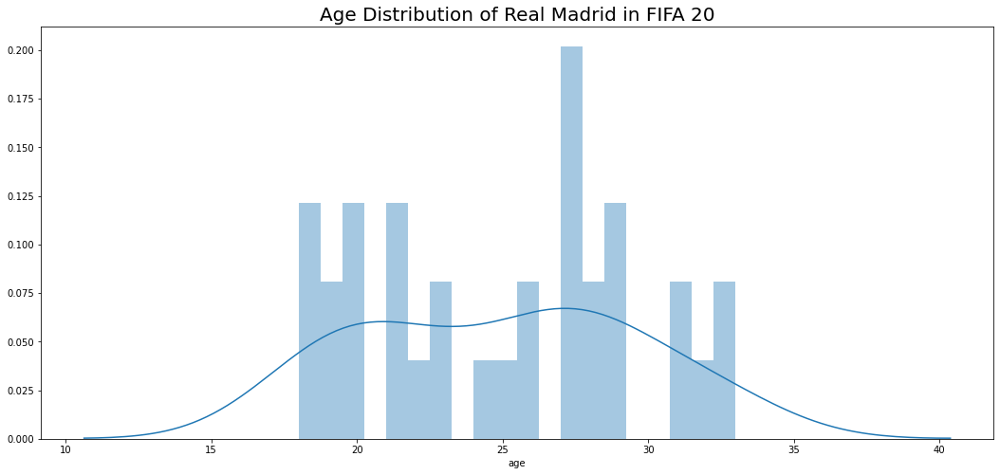

In [186]:
plt.figure(figsize=(18,8))
plt.title('Age Distribution of Real Madrid in FIFA 20', fontsize=20)
sns.distplot(a=RM['age'], kde=True, bins=20)
plt.show()

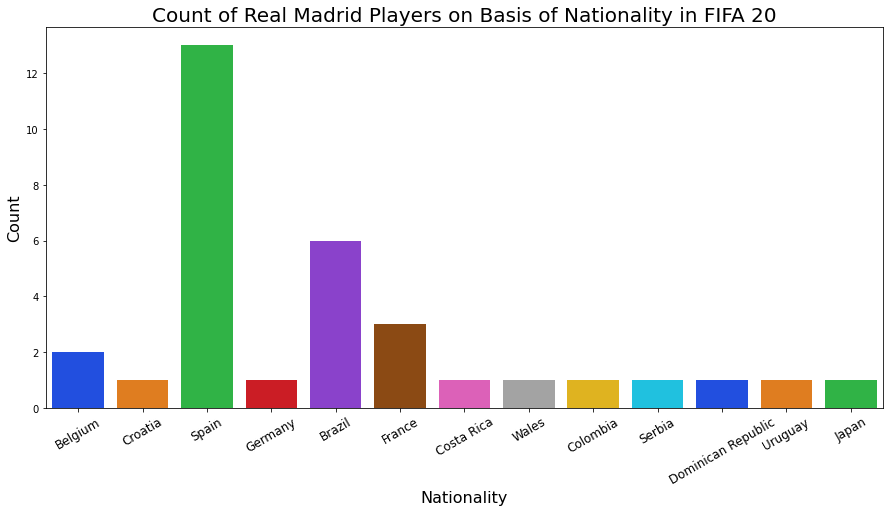

In [187]:
plt.figure(figsize= (15,7))

ax = sns.countplot(x='nationality', data=RM, palette='bright')
ax.set_title(label='Count of Real Madrid Players on Basis of Nationality in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Nationality', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [188]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = RM['nationality'],
    y = RM['overall'],
    mode='markers',
    marker=dict(
        size=16,
        color=RM['overall'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= RM['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating in Real Madrid',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

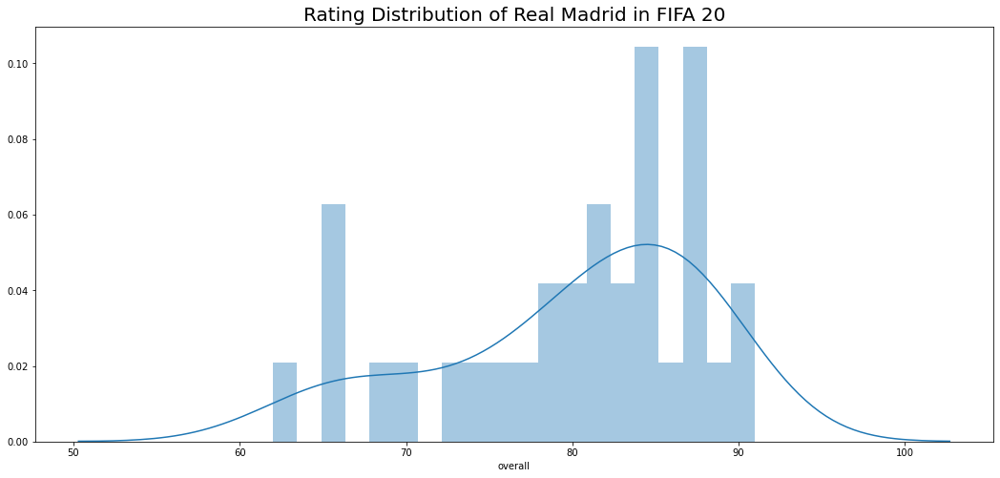

In [189]:
plt.figure(figsize=(18,8))
plt.title('Rating Distribution of Real Madrid in FIFA 20', fontsize=20)
sns.distplot(a=RM['overall'], kde=True, bins=20)
plt.show()

In [190]:
RM_most_valuable = RM.sort_values(by="value_eur", ascending=False)
RM_most_valuable.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,1845,"#Speedster, #Dribbler, #Acrobat",LW,7,Disclosed,2019-07-01,2e+03,91,83,86,94,35,66,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24,9e+07,-4e+06
36,T. Kroos,29,1990-01-04,183,76,Germany,Real Madrid,88,88,57000000,330000,CM,Right,4,5,3,Medium/Medium,Normal,1169,"#Playmaker , #Crosser, #Complete Midfielder",LCM,8,Disclosed,2014-07-17,2e+03,45,80,90,81,70,69,65,63,62,66,38,63,"Argues with Officials, Finesse Shot, Crowd Fav...",88,75,58,91,82,80,86,84,92,89,50,41,60,87,71,87,30,74,73,86,60,76,75,89,73,88,72,70,62,10,11,13,7,10,75+3,75+3,75+3,78+3,79+3,79+3,79+3,78+3,81+3,81+3,81+3,79+3,85+3,85+3,85+3,79+3,75+3,79+3,79+3,79+3,75+3,72+3,69+3,69+3,69+3,72+3,22,5e+07,-6e+06
42,Casemiro,27,1992-02-23,185,84,Brazil,Real Madrid,87,89,53500000,240000,CDM,Right,3,3,2,Medium/High,Normal,1137,"#Tackling , #Tactician , #Strength, #Complete ...",CDM,14,Disclosed,2013-07-11,2e+03,62,72,75,72,85,89,65,63,62,66,38,63,"Long Throw-in, Injury Prone, Argues with Offic...",58,64,76,83,61,69,63,74,82,78,58,66,62,86,66,86,87,88,90,81,89,86,69,77,66,84,84,87,86,13,14,16,12,12,74+3,74+3,74+3,71+3,74+3,74+3,74+3,71+3,74+3,74+3,74+3,72+3,79+3,79+3,79+3,72+3,78+3,84+3,84+3,84+3,78+3,79+3,84+3,84+3,84+3,79+3,24,6e+07,7e+06
62,Isco,27,1992-04-21,176,79,Spain,Real Madrid,86,87,51000000,245000,"CAM, CM, LW",Right,3,3,4,Medium/Low,Normal,1084,#Dribbler,SUB,22,Disclosed,2013-07-03,2e+03,71,77,83,91,59,60,65,63,62,66,38,63,"Injury Free, Beat Offside Trap, Selfish, Fines...",78,79,55,84,67,92,88,76,80,93,74,68,85,76,90,69,61,62,59,84,58,61,79,87,76,86,58,64,51,10,8,12,15,6,76+3,76+3,76+3,83+3,82+3,82+3,82+3,83+3,84+3,84+3,84+3,81+3,81+3,81+3,81+3,81+3,70+3,70+3,70+3,70+3,70+3,67+3,62+3,62+3,62+3,67+3,25,4e+07,-8e+06
28,T. Courtois,27,1992-05-11,199,96,Belgium,Real Madrid,88,89,48000000,235000,GK,Left,4,2,1,Medium/Medium,Courtois,1020,#Team Player,GK,13,Disclosed,2018-08-09,2e+03,68,52,57,63,52,65,85,89,72,87,49,85,"Flair, Acrobatic Clearance",14,14,13,33,12,13,19,20,35,23,46,52,61,83,45,54,68,38,70,17,23,15,13,44,27,66,20,18,16,85,89,72,85,87,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,24,6e+07,1e+07
8,L. Modrić,33,1985-09-09,172,66,Croatia,Real Madrid,90,90,45000000,340000,CM,Right,4,4,4,High/High,Lean,923,"#Dribbler, #Playmaker , #Crosser, #Acrobat, #...",RCM,10,Disclosed,2012-08-01,2e+03,74,76,89,89,72,66,65,63,62,66,38,63,"Argues with Officials, Finesse Shot, Speed Dri.

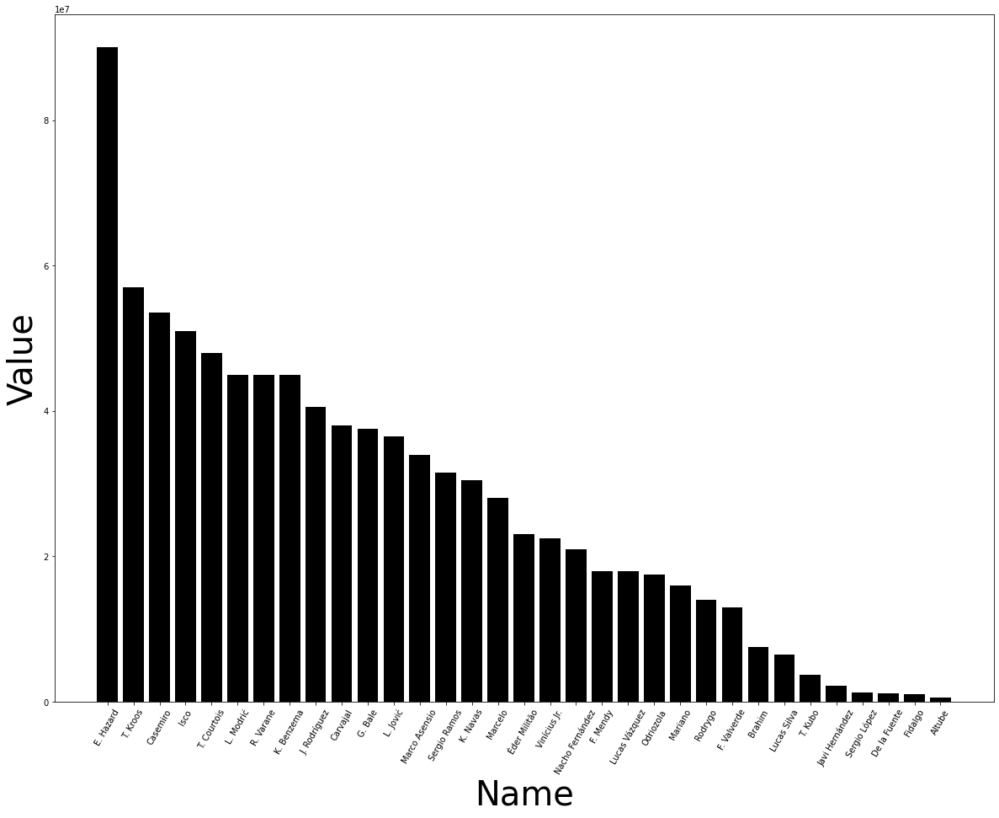

In [191]:
plt.figure(figsize=(20, 15))
plt.bar(RM_most_valuable['short_name'], RM_most_valuable['value_eur'], color="k")
plt.tick_params(axis='x', rotation=60)
plt.ylabel("Value", fontsize=40)
plt.xlabel("Name", fontsize=40)
plt.show()

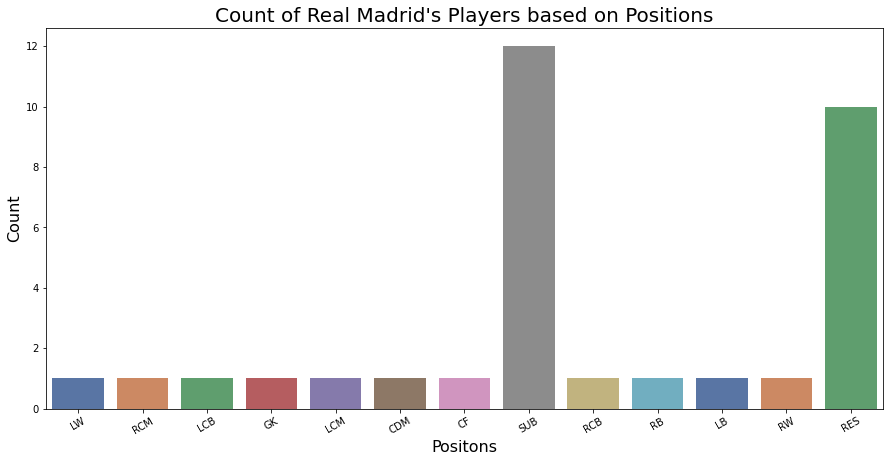

In [192]:
plt.figure(figsize=(15, 7))
ax = sns.countplot(x="team_position", data=RM, palette="deep")
ax.set_title("Count of Real Madrid's Players based on Positions", fontsize=20)
ax.set_xlabel(xlabel="Positons", fontsize=16)
ax.set_ylabel(ylabel="Count", fontsize=16)
plt.xticks(rotation=30, fontsize=10)
plt.show()

In [193]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = RM['overall'],
    y = RM['value_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=RM['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= RM['short_name'],
))

fig.update_layout(title='Overall Rating vs Value in Euros in Real Madrid',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

## Juventus FC

In [194]:
JUV = club('Juventus')
print("Team Value of Juventus is",teamValue(JUV),"million Euros")
print("Juventus spends", teamWeeklyWage(JUV),"million Euros as per Week Wages")
print("Juventus has average squad age of", avgSquadAge(JUV), "years")
print("Juventus has average overall rating of", avgOverallRating(JUV))
print("Juventus has average potential of", avgPotential(JUV))

Team Value of Juventus is 735.475 million Euros
Juventus spends 3.75 million Euros as per Week Wages
Juventus has average squad age of 27.0 years
Juventus has average overall rating of 80.1
Juventus has average potential of 83.2


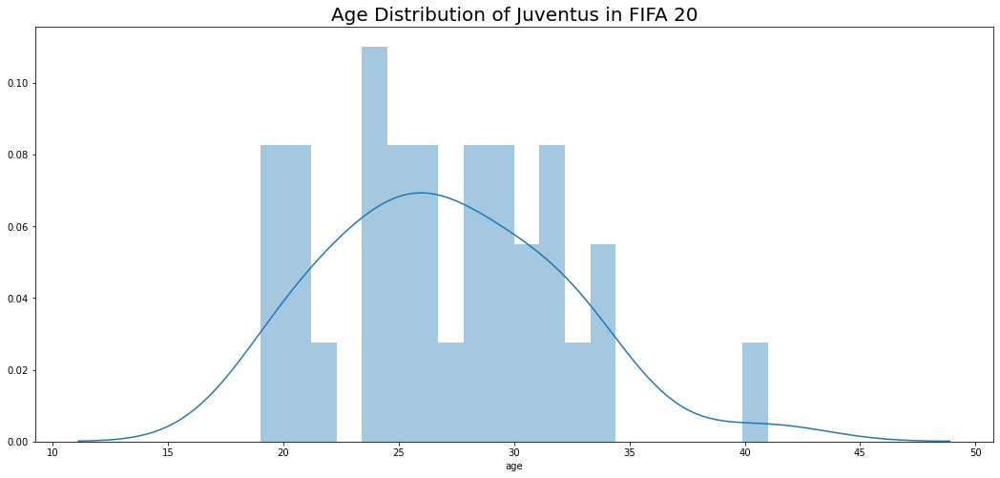

In [195]:
plt.figure(figsize=(18,8))
plt.title('Age Distribution of Juventus in FIFA 20', fontsize=20)
sns.distplot(a=JUV['age'], kde=True, bins=20)
plt.show()

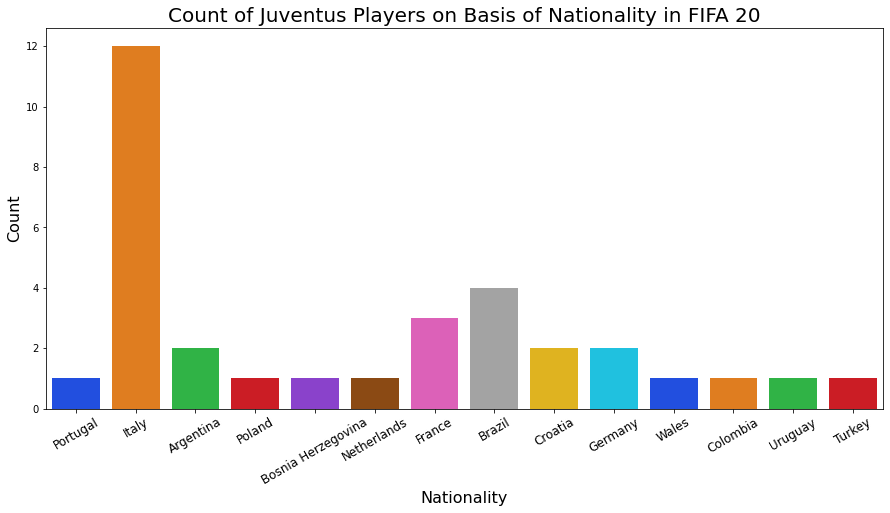

In [196]:
plt.figure(figsize= (15,7))

ax = sns.countplot(x='nationality', data=JUV, palette='bright')
ax.set_title(label='Count of Juventus Players on Basis of Nationality in FIFA 20', fontsize=20)

ax.set_xlabel(xlabel='Nationality', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

In [197]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = JUV['nationality'],
    y = JUV['overall'],
    mode='markers',
    marker=dict(
        size=16,
        color=JUV['overall'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= JUV['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating in Juventus',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

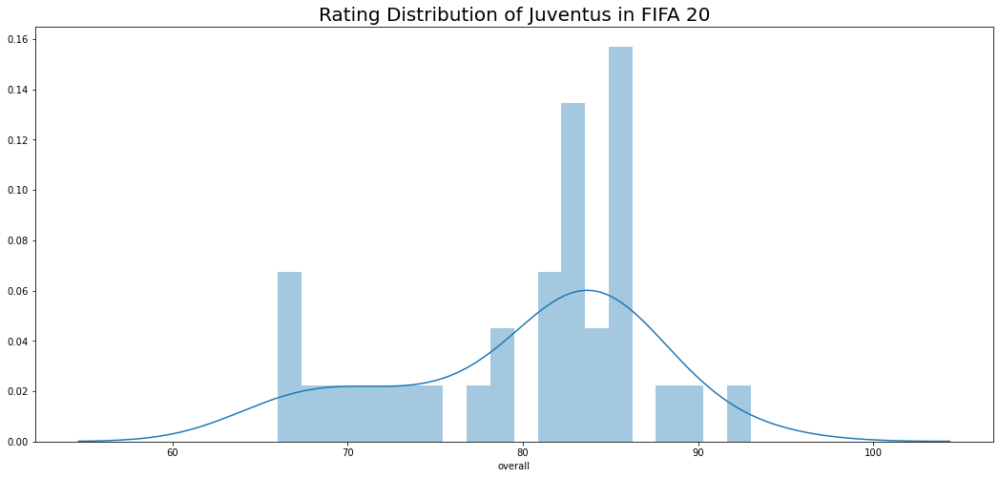

In [198]:
plt.figure(figsize=(18,8))
plt.title('Rating Distribution of Juventus in FIFA 20', fontsize=20)
sns.distplot(a=JUV['overall'], kde=True, bins=20)
plt.show()

In [199]:
JUV_most_valuable = JUV.sort_values(by="value_eur", ascending=False)
JUV_most_valuable.head(10)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi,potential_value,value_change
23,P. Dybala,25,1993-11-15,177,75,Argentina,Juventus,88,92,76500000,215000,"CAM, RW",Left,3,3,4,Medium/Medium,Normal,1320,"#Dribbler, #Playmaker , #FK Specialist, #Acro...",RW,10,Disclosed,2015-07-01,2e+03,83,82,84,90,43,64,65,63,62,66,38,63,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",82,80,64,87,88,90,88,88,75,93,86,81,91,84,85,80,75,79,61,86,48,42,80,87,86,84,32,48,40,5,4,4,5,8,80+3,80+3,80+3,85+3,85+3,85+3,85+3,85+3,86+3,86+3,86+3,85+3,80+3,80+3,80+3,85+3,68+3,64+3,64+3,64+3,68+3,64+3,54+3,54+3,54+3,64+3,23,1e+08,3e+07
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,965,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,Disclosed,2018-07-10,2e+03,90,93,82,89,35,78,65,63,62,66,38,63,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23,6e+07,0e+00
73,M. de Ligt,19,1999-08-12,189,89,Netherlands,Juventus,85,93,50000000,76000,CB,Right,3,4,2,Medium/High,Normal,925,#Strength,SUB,4,Disclosed,2019-07-18,2e+03,67,58,66,68,83,84,65,63,62,66,38,63,"Diver, Avoids Using Weaker Foot, Long Passer (...",52,50,85,76,40,66,48,55,74,74,61,72,56,83,60,82,84,77,88,64,82,82,44,63,40,82,86,82,80,12,11,11,12,10,67+3,67+3,67+3,63+3,65+3,65+3,65+3,63+3,66+3,66+3,66+3,65+3,71+3,71+3,71+3,65+3,74+3,79+3,79+3,79+3,74+3,76+3,82+3,82+3,82+3,76+3,24,6e+07,8e+06
65,M. Pjanić,29,1990-04-02,178,72,Bosnia Herzegovina,Juventus,86,86,42500000,180000,"CM, CDM",Right,3,4,3,Medium/Medium,Normal,701,"#Dribbler, #Playmaker , #FK Specialist, #Comp...",CDM,5,Disclosed,2016-07-01,2e+03,68,68,87,85,75,67,65,63,62,66,38,63,"Beat Offside Trap, Argues with Officials, Fine...",80,56,60,91,72,86,86,92,87,89,69,67,75,84,81,78,60,79,61,82,70,78,68,88,79,86,78,76,70,7,7,13,7,8,71+3,71+3,71+3,78+3,78+3,78+3,78+3,78+3,81+3,81+3,81+3,80+3,84+3,84+3,84+3,80+3,79+3,80+3,80+3,80+3,79+3,77+3,73+3,73+3,73+3,77+3,22,5e+07,3e+06
60,W. Szczęsny,29,1990-04-18,195,90,Poland,Juventus,86,88,37500000,135000,GK,Right,3,3,1,Medium/Medium,Lean,647,#Team Player,GK,1,Disclosed,2017-07-19,2e+03,68,52,57,63,52,65,85,82,73,88,49,86,Acrobatic Clearance,12,12,16,32,14,11,16,14,36,22,51,47,55,82,51,55,71,45,65,14,40,15,14,48,18,65,20,13,12,85,82,73,86,88,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,23,5e+07,1e+07
98,G. Higuaín,31,1987-12-10,186,89,Argentina,Juventus,85,85,34500000,175000,ST,Right,4,4,3,High/Medium,Normal,569,#Clinical Finisher,SUB,21,Disclosed,2016-07-26,2e+03,63,85,71,80,31,71,65,63,62,66,38,63,"Argues with Officials, Speed Dribbler (CPU AI ...",68

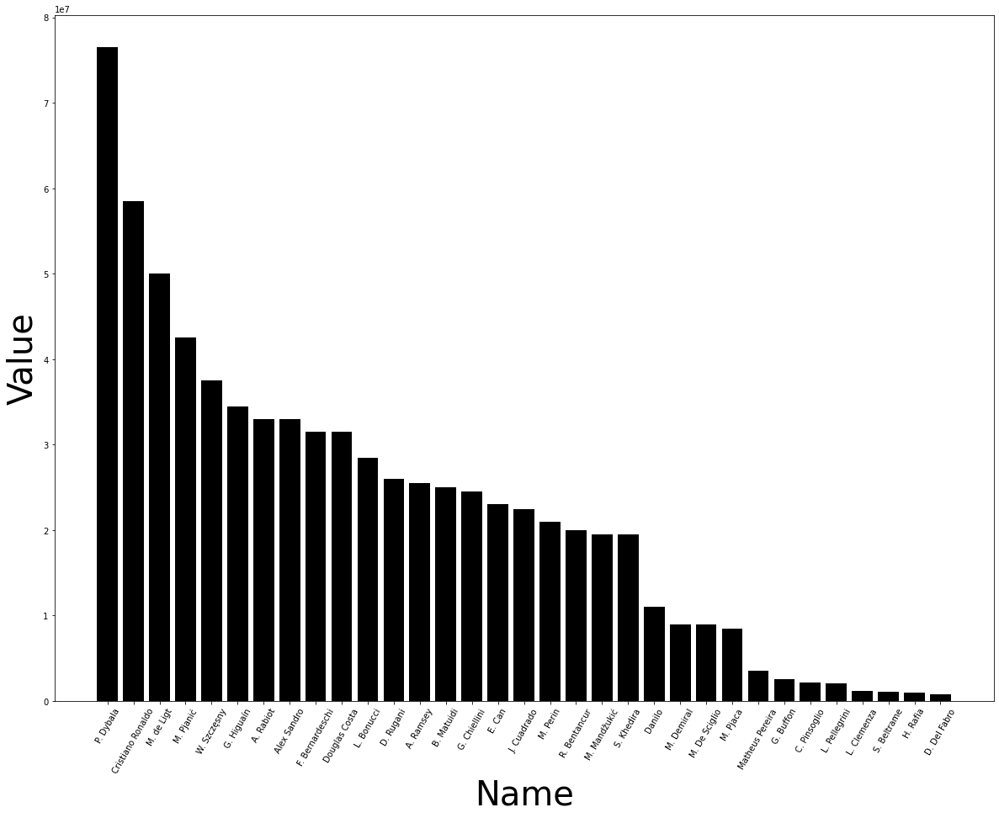

In [200]:
plt.figure(figsize=(20, 15))
plt.bar(JUV_most_valuable['short_name'], JUV_most_valuable['value_eur'], color="k")
plt.tick_params(axis='x', rotation=60)
plt.ylabel("Value", fontsize=40)
plt.xlabel("Name", fontsize=40)
plt.show()

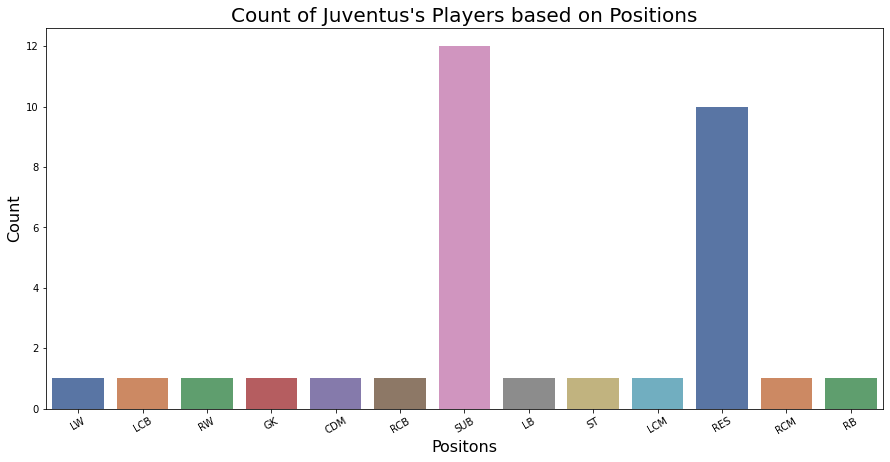

In [201]:
plt.figure(figsize=(15, 7))
ax = sns.countplot(x="team_position", data=JUV, palette="deep")
ax.set_title("Count of Juventus's Players based on Positions", fontsize=20)
ax.set_xlabel(xlabel="Positons", fontsize=16)
ax.set_ylabel(ylabel="Count", fontsize=16)
plt.xticks(rotation=30, fontsize=10)
plt.show()

In [202]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = JUV['overall'],
    y = JUV['value_eur'],
    mode='markers',
    marker=dict(
        size=16,
        color=JUV['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= JUV['short_name'],
))

fig.update_layout(title='Overall Rating vs Value in Euros in Juventus',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

## Ronaldo vs Messi over the Years

In [203]:
games = [df_15, df_16, df_17, df_18, df_19, df_20]
versions = ["fifa 15", "fifa 16", "fifa 17", "fifa 18", "fifa 19", "fifa 20"]
for data, name in zip(games, versions):
    data['FIFA'] = name
df_all = pd.concat(games)
df_all.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,FIFA,bmi,potential_value,value_change
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,27,1987-06-24,169,67,Argentina,FC Barcelona,93,95,0,0,CF,Left,5,3,4,Medium/Low,Normal,Yes,NaN,"#Speedster, #Dribbler, #FK Specialist, #Acroba...",CF,10,NaN,2004-07-01,2e+03,CF,10,93,89,86,96,27,63,NaN,NaN,NaN,NaN,NaN,NaN,"Finesse Shot, Speed Dribbler (CPU AI Only), On...",84,94-3,71,89,85-5,96-1,89+2,90+4,76,96,96,90+2,94,94-2,95,80-1,73,77-1,60,88,48,22,92-1,90,76,NaN,25,21,20,6,11,15,14,8,89+3,89+3,89+3,92+3,90+3,90+3,90+3,92+3,92+3,92+3,92+3,90+3,79+3,79+3,79+3,90+3,62+3,62+3,62+3,62+3,62+3,54+3,45+3,45+3,45+3,54+3,fifa 15,NaN,NaN,NaN
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,29,1985-02-05,185,80,Portugal,Real Madrid,92,92,0,0,"LW, LM",Right,5,4,5,High/Low,Normal,Yes,NaN,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7,NaN,2009-07-01,2e+03,LW,7,93,93,81,91,32,79,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Flair, Long Shot Taker (CPU A...",83,95+3,86,82,87+2,93+3,88,79,72,92-3,91,94,93,90,63-12,94,94,89,79,93,63,24,91+2,81,85,NaN,22,31,23,7,11,15,14,11,91+3,91+3,91+3,89+3,91+3,91+3,91+3,89+3,89+3,89+3,89+3,87+3,77+3,77+3,77+3,87+3,63+3,63+3,63+3,63+3,63+3,57+3,52+3,52+3,52+3,57+3,fifa 15,NaN,NaN,NaN
2,9014,https://sofifa.com/player/9014/arjen-robben/15...,A. Robben,Arjen Robben,30,1984-01-23,180,80,Netherlands,FC Bayern München,90,90,0,0,"RM, LM, RW",Left,5,2,4,High/Low,Normal,Yes,NaN,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",SUB,10,NaN,2009-08-28,2e+03,RS,11,93,86,83,92,32,64,NaN,NaN,NaN,NaN,NaN,NaN,"Diver, Injury Prone, Avoids Using Weaker Foot,...",80,85+2,50,86+2,86+2,93,85,83-1,76+3,90+1,93,93+2,93+1,89+2,91,86,61,78+11,65,90+1,47+9,39+1,89+2,84+2,80+1,NaN,29,26+2,26+1,10,8,11,5,15,84+3,84+3,84+3,88+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,78+3,78+3,78+3,87+3,64+3,64+3,64+3,64+3,64+3,55+3,46+3,46+3,46+3,55+3,fifa 15,NaN,NaN,NaN
3,41236,https://sofifa.com/player/41236/zlatan-ibrahim...,Z. Ibrahimović,Zlatan Ibrahimović,32,1981-10-03,195,95,Sweden,Paris Saint-Germain,90,90,0,0,ST,Right,5,4,4,Medium/Low,Normal,Yes,NaN,"#Poacher, #Aerial Threat, #Distance Shooter, #...",ST,10,NaN,2012-07-01,2e+03,ST,10,76,91,81,86,34,86,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Leadership, Flair, Long Shot ...",76,91,76,84-2,92+3,88,80,80,76+4,90,74+2,77-1,86,85,41,93,72,78,93,88,84,20,86,83-1,91,NaN,25,41-8,27,13,15,10,9,12,87+3,87+3,87+3,84+3,86+3,86+3,86+3,84+3,86+3,86+3,86+3,83+3,76+3,76+3,76+3,83+3,61+3,65+3,65+3,65+3,61+3,56+3,55+3,55+3,55+3,56+3,fifa 15,NaN,NaN,NaN
4,167495,https://sofifa.com/player/167495/manuel-neuer/...,M. Neuer,Manuel Neuer,28,1986-03-27,193,92,Germany,FC B

In [204]:
comparison = df_all[(df_all.short_name=="L. Messi")|(df_all.short_name=="Cristiano Ronaldo")]
fig = px.bar(comparison, x="short_name", y="overall", animation_frame="FIFA", color="club", hover_name="value_eur", range_y=[90, 96])
fig.update_layout(title={
    'text': 'Overall Rating Comparison over the last 6 years',
    'y': 0.95,
    'x': 0.5,
    'xanchor': 'center',
    'yanchor': 'top',
    },
    showlegend=True,
    xaxis_title="Player Name",
    yaxis_title="Overall Rating")

fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 800
fig.show()

In [205]:
fig = px.bar(comparison, x="short_name", y="wage_eur", animation_frame="FIFA", color="club", hover_name="wage_eur", range_y=[300000, 700000])
fig.update_layout(title={
    'text': 'Wage Comparison over the last 6 years',
    'y': 0.95,
    'x': 0.5,
    'xanchor': 'center',
    'yanchor': 'top',
    },
    showlegend=True,
    xaxis_title="Player Name",
    yaxis_title="Wages")

fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 800
fig.show()